## **ENTENDIENDO PCA: Realizando un paso a paso**



In [24]:
import pandas as pd
import numpy as np

# 1. Matriz de datos: cargar y preparar
# ----------------------------------------------------------------
# Asume que el CSV tiene una columna "Fecha" y luego las estaciones:
# Fecha, 101, 102, 103, ...
#df = pd.read_csv('../../DATA/all_stations_SIATA_hourly.csv', parse_dates=['Fecha'], index_col='Fecha')
df = pd.read_csv('../../DATA/all_stations_SIATA_monthly.csv', parse_dates=['Fecha'], index_col='Fecha')
# Matriz X: horas x estaciones
X = df.values  # NumPy array de forma (N, p)



In [25]:
X.shape

(140, 70)

In [26]:
# 2. Estandarización: media 0 y varianza 1 por estación
# ----------------------------------------------------------------
# Calcular medias y desviaciones por columna (estación)
means = np.mean(X, axis=0)
stds = np.std(X, axis=0, ddof=1)
Z = (X - means) / stds


In [27]:
# 3. Matriz de covarianza (o correlación si ya estandarizamos)
# ----------------------------------------------------------------
N = Z.shape[0]
C = (Z.T @ Z) / (N - 1)  # Matriz p x p

In [28]:
# 4. Descomposición en valores propios y vectores propios
# ----------------------------------------------------------------
# Usamos eigh porque C es simétrica
eigenvals, eigenvecs = np.linalg.eigh(C)
# Ordenar en orden descendente
idx = np.argsort(eigenvals)[::-1]
eigenvals = eigenvals[idx]
eigenvecs = eigenvecs[:, idx]

In [29]:
# 5. Componentes principales (scores)
# ----------------------------------------------------------------
# Proyección de los datos estandarizados sobre los vectores propios
T = Z @ eigenvecs  # Matriz N x p, T[:, k] es el PC k+1

In [30]:
# 6. Varianza explicada
# ----------------------------------------------------------------
total_variance = np.sum(eigenvals)
explained_variance_ratio = eigenvals / total_variance
cumulative_variance = np.cumsum(explained_variance_ratio)

In [31]:

# Mostrar resultados
print("Eigenvalores (varianza de cada PC):")
print(eigenvals)
print("\nVarianza explicada por componente (ratio):")
print(explained_variance_ratio)
print("\nVarianza acumulada:")
print(cumulative_variance)

# Opcional: crear DataFrame de resultados
pc_df = pd.DataFrame(
    data=explained_variance_ratio,
    index=[f'PC{k+1}' for k in range(len(eigenvals))],
    columns=['ExplainedVarianceRatio']
)
print("\nResumen de varianza explicada:")
print(pc_df)

Eigenvalores (varianza de cada PC):
[5.25522858e+01 1.75752340e+00 1.23817105e+00 1.13258957e+00
 9.37804285e-01 8.89913654e-01 7.46749515e-01 6.91808270e-01
 6.58214067e-01 5.88521526e-01 5.33789115e-01 5.17010657e-01
 4.64294462e-01 4.28284709e-01 3.85962501e-01 3.60237013e-01
 3.38855372e-01 3.31993257e-01 3.09551216e-01 2.77828869e-01
 2.62721201e-01 2.58080530e-01 2.39056695e-01 2.36332590e-01
 2.23577144e-01 2.15184513e-01 1.96763976e-01 1.91921147e-01
 1.75281748e-01 1.68457083e-01 1.61267601e-01 1.52551697e-01
 1.48091970e-01 1.32539891e-01 1.26984340e-01 1.23959660e-01
 1.22014304e-01 1.20869741e-01 1.13147314e-01 1.02840075e-01
 9.82488359e-02 9.55741013e-02 8.90842246e-02 8.12442569e-02
 7.68961544e-02 7.38451994e-02 7.14265874e-02 6.41424456e-02
 6.32470869e-02 6.19267596e-02 5.76320189e-02 5.01611208e-02
 4.98197008e-02 4.72314669e-02 4.39934696e-02 3.97185299e-02
 3.90425939e-02 3.54668992e-02 3.37574084e-02 2.92976257e-02
 2.74026740e-02 2.64791071e-02 2.33471073e-02 2.3

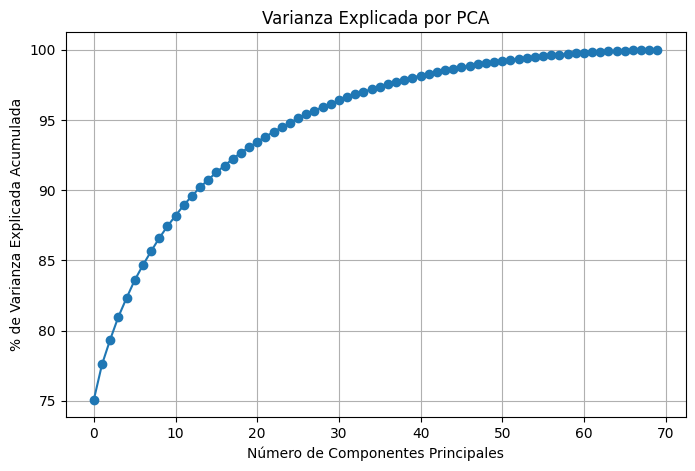

In [32]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance*100, marker='o')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('% de Varianza Explicada Acumulada')
plt.title('Varianza Explicada por PCA')
plt.grid(True)
plt.show()

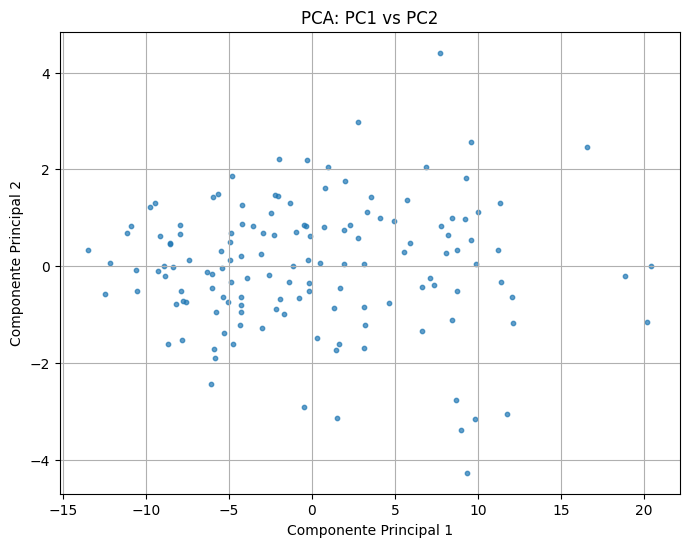

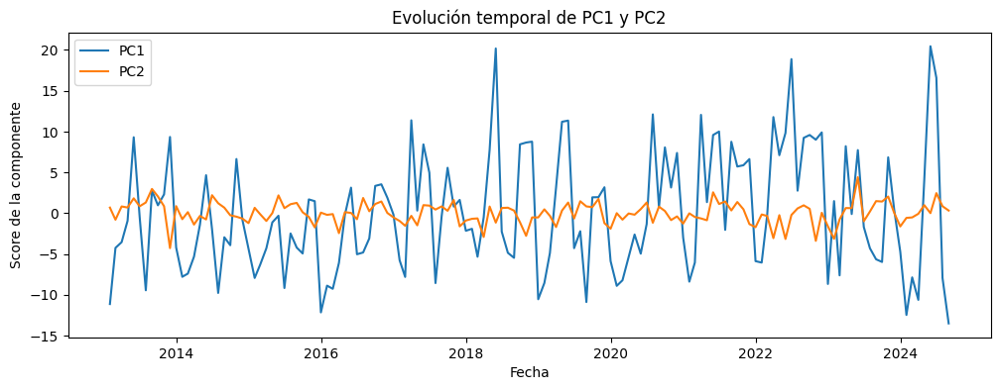

In [33]:
# Extraer PC1 y PC2
pc1 = T[:, 0]
pc2 = T[:, 1]

# 1) Diagrama de dispersión PC1 vs PC2
plt.figure(figsize=(8, 6))
plt.scatter(pc1, pc2, s=10, alpha=0.7)
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('PCA: PC1 vs PC2')
plt.grid(True)
plt.show()

# 2) Series temporales de PC1 y PC2
plt.figure(figsize=(12, 4))
plt.plot(df.index, pc1, label='PC1')
plt.plot(df.index, pc2, label='PC2')
plt.xlabel('Fecha')
plt.ylabel('Score de la componente')
plt.title('Evolución temporal de PC1 y PC2')
plt.legend()
plt.show()

In [34]:
len(pc1)

140

In [36]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# 1) Elegir m componentes
m = 4
X_pca = T[:, :m]  # scores de los primeros m PCs

# 2) Probar varios k y evaluar (Elbow + Silhouette)
sil_scores = {}
for k in range(2, 7):
    km = KMeans(n_clusters=k, random_state=0).fit(X_pca)
    sil = silhouette_score(X_pca, km.labels_)
    sil_scores[k] = sil

print("Silhouette por k:", sil_scores)

# 3) Ajustar KMeans con k óptimo (p.ej. el que maximiza silhouette)
best_k = max(sil_scores, key=sil_scores.get)
km = KMeans(n_clusters=best_k, random_state=0).fit(X_pca)
labels = km.labels_

Silhouette por k: {2: 0.5381486907426251, 3: 0.45717984670338857, 4: 0.41863731640188256, 5: 0.4082502944615005, 6: 0.3624296776439104}


(101545, 20)

## **ANÁLISIS DE PCA CON EST. SIATA HORARIAS**

In [1]:
from glob import glob
import pandas as pd
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score

from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

from sklearn.cluster import KMeans, AgglomerativeClustering
import scipy.cluster.hierarchy as sch

from scipy.spatial.distance import cdist

import numpy as np
import math

import rasterio as rio
import geopandas as gpd
from rasterio.plot import show
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from scipy.cluster.hierarchy import fcluster

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

data_input = '../../DATA/'

# 📌 Definir rutas de archivos
main = '../../DATA/shape_files/'

# 📌 Cargar datos espaciales
hill_src = rio.open(main + "DEM_west_Hillshade_Clip_r.tif")
hill = hill_src.read(1)
hill = np.where(hill == hill[0, 0], np.nan, hill)

AMVA = gpd.read_file(f"{main}mpios_amva_qnk.shp")
pluvios_shp = gpd.read_file(main + "Est_All.shp")

/run/media/oisanchezp/datos/MAESTRIA/PAPER_RainfallLandslides_Vdea/land_env/lib/python3.11/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


In [43]:
df = pd.read_csv('../../DATA/all_stations_SIATA_monthly.csv', parse_dates=['Fecha'], index_col='Fecha')
# Matriz X: horas x estaciones
X = df.values  # NumPy array de forma (N, p)

In [ ]:
# 1. Extraer patrón medio por hora del día
# hourly_pattern_df = all_stations_df_10y_imputed.copy()
# hourly_pattern_df['hour'] = hourly_pattern_df.index.hour
# hourly_means = hourly_pattern_df.groupby('hour').mean()  # 24 filas x 69 columnas

#guardar como archivo CSV

#hourly_means.to_csv('../../DATA/mean_hourly_siata.csv', index=False)

#### **Aplicamos PCA**

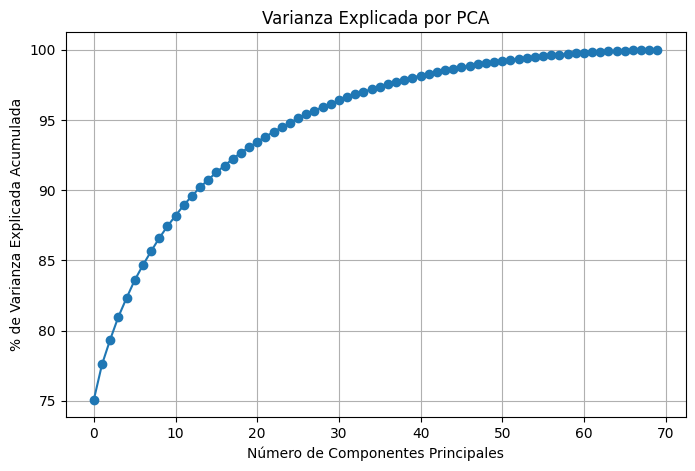

In [44]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt

# hourly_files = pd.read_csv('../../DATA/mean_hourly_siata.csv')

# X = hourly_means.T  # shape: (n_estaciones, 24 horas) (69, 24)

scaler = StandardScaler()
X_std = scaler.fit_transform(X)

pca = PCA()
X_pca = pca.fit_transform(X_std)

plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_)*100, marker='o')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('% de Varianza Explicada Acumulada')
plt.title('Varianza Explicada por PCA')
plt.grid(True)
plt.show()

# Gráfico 2D de las dos primeras componentes
# plt.figure(figsize=(8, 6))
# plt.scatter(X_pca[:, 0], X_pca[:, 1])
# for i, est in enumerate(X.index):
#     plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=9)
# plt.xlabel('PC1')
# plt.ylabel('PC2')
# plt.title('Estaciones en el espacio PCA')
# plt.grid(True)
# plt.show()

# # Gráfico 3D de las tres primeras componentes
# fig = plt.figure(figsize=(10, 8))
# ax = fig.add_subplot(111, projection='3d')

# # Coordenadas en el espacio PCA
# x = X_pca[:, 0]  # PC1
# y = X_pca[:, 1]  # PC2
# z = X_pca[:, 2]  # PC3

# # Graficar puntos
# ax.scatter(x, y, z, c='royalblue', s=50)

# # Añadir etiquetas a cada punto (nombre de estación)
# for i, est in enumerate(X.index):
#     ax.text(x[i], y[i], z[i], str(est), size=8)

# # Etiquetas de ejes
# ax.set_xlabel('PC1')
# ax.set_ylabel('PC2')
# ax.set_zlabel('PC3')
# ax.set_title('Estaciones en el espacio PCA (PC1, PC2, PC3)')

# plt.tight_layout()
# plt.show()

ValueError: x and y must have same first dimension, but have shapes (69,) and (70,)

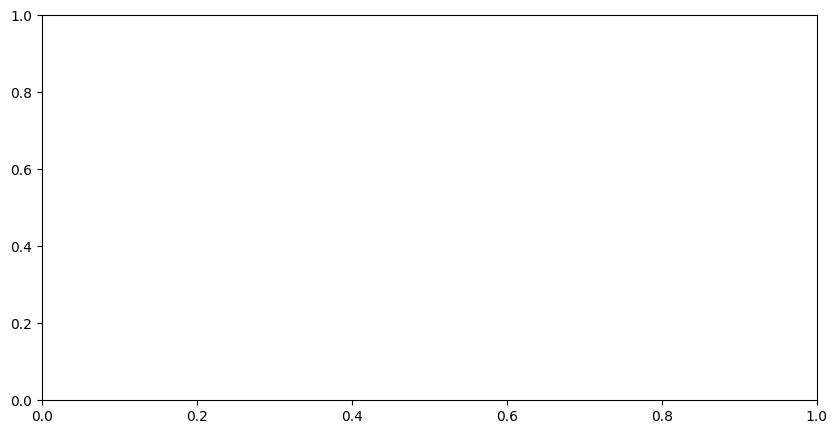

In [45]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10, 5))
for i in range(3): 
    plt.plot(range(69), pca.components_[i], label=f'PC{i+1}')

#plt.xticks(ticks=np.arange(0, 69))
plt.xlabel('Hora del día')
plt.ylabel('Peso (loading)')
plt.title('Contribución de cada hora a las primeras componentes')
plt.legend()
plt.show()


plt.figure(figsize=(10, 5))
for i in range(1): 
    plt.plot(range(69), pca.components_[i], label=f'PC{i+1}')

#plt.xticks(ticks=np.arange(0, 69))
plt.xlabel('Hora del día')
plt.ylabel('Peso (loading)')
plt.title('Contribución de cada hora a las primeras componentes')
plt.legend()
plt.show()

#### **Con KMEANS**

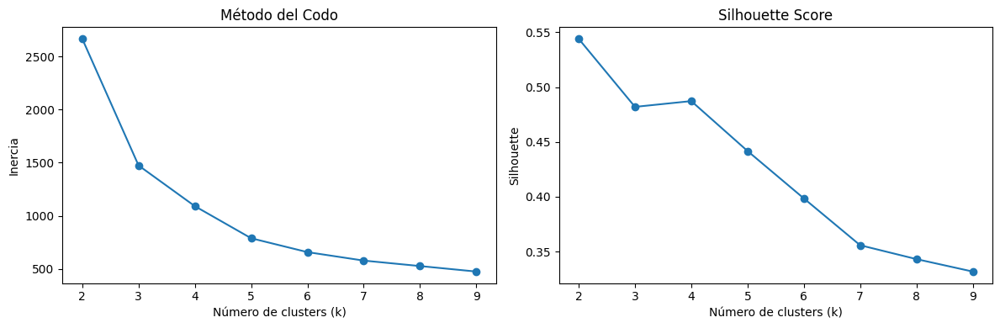

In [46]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertias = []
silhouettes = []

k_range = range(2, 10)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca[:, :3])
    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X_pca[:, :3], kmeans.labels_))

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia")

plt.subplot(1, 2, 2)
plt.plot(k_range, silhouettes, marker='o')
plt.title("Silhouette Score")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette")

plt.tight_layout()
plt.show()


#### **Con Clustering Jerarquico**

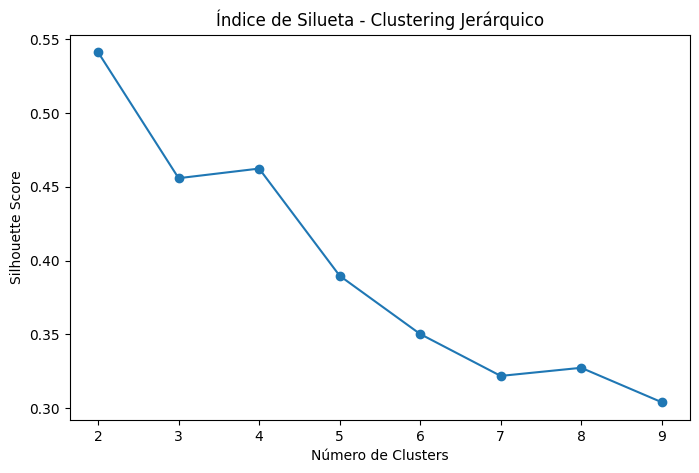

IndexError: index 4 is out of bounds for axis 1 with size 4

In [ ]:
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

X_pca_reducido = X_pca[:, :4]

Z = linkage(X_pca_reducido, method='ward', metric='euclidean')

silhouettes_hier = []
k_range = range(2, 10)

for k in k_range:
    labels = fcluster(Z, k, criterion='maxclust') 
    score = silhouette_score(X_pca_reducido, labels)
    silhouettes_hier.append(score)

plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouettes_hier, marker='o')
plt.title('Índice de Silueta - Clustering Jerárquico')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()

from scipy.cluster.hierarchy import linkage
import matplotlib.pyplot as plt

Z = linkage(X_pca[:, :4], method='ward')

distancias = Z[:, 2]

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(distancias)+1), distancias[::-1], marker='o')
plt.title('Método del Codo - Clustering Jerárquico')
plt.xlabel('Número de fusiones restantes')
plt.ylabel('Distancia entre Clusters fusionados')
plt.show()


plt.figure(figsize=(10, 6))
dendrogram = sch.dendrogram(
    Z,
    labels=df.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

from scipy.cluster.hierarchy import cut_tree

plt.axhline(y=Z[-(5 - 1), 2], c='red', ls='--')
plt.axhline(y=Z[-(4 - 1), 2], c='red', ls='--')

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Horario)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)
plt.show()

In [49]:
Z.shape

(139, 4)

/tmp/ipykernel_8815/3835281977.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


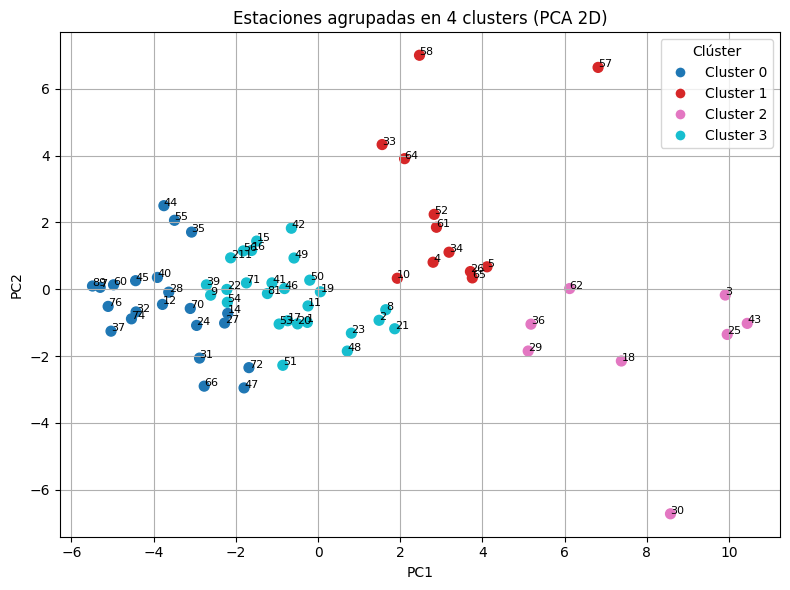

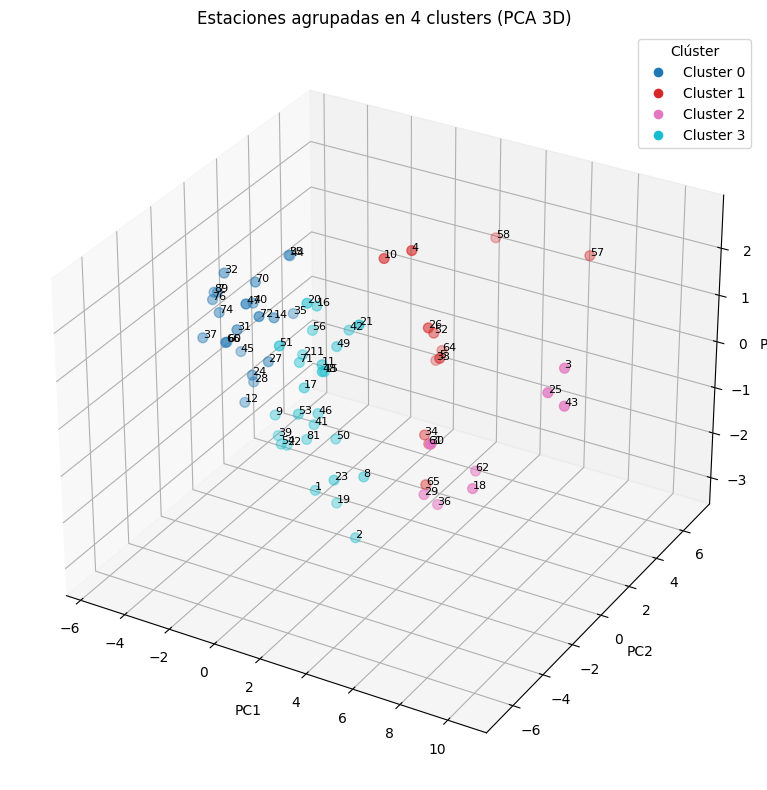

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 4
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_8815/2879149994.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


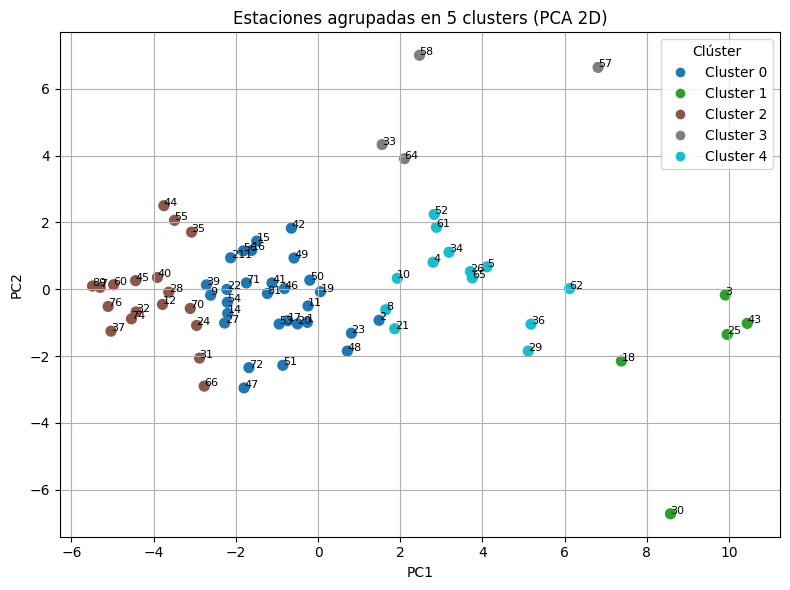

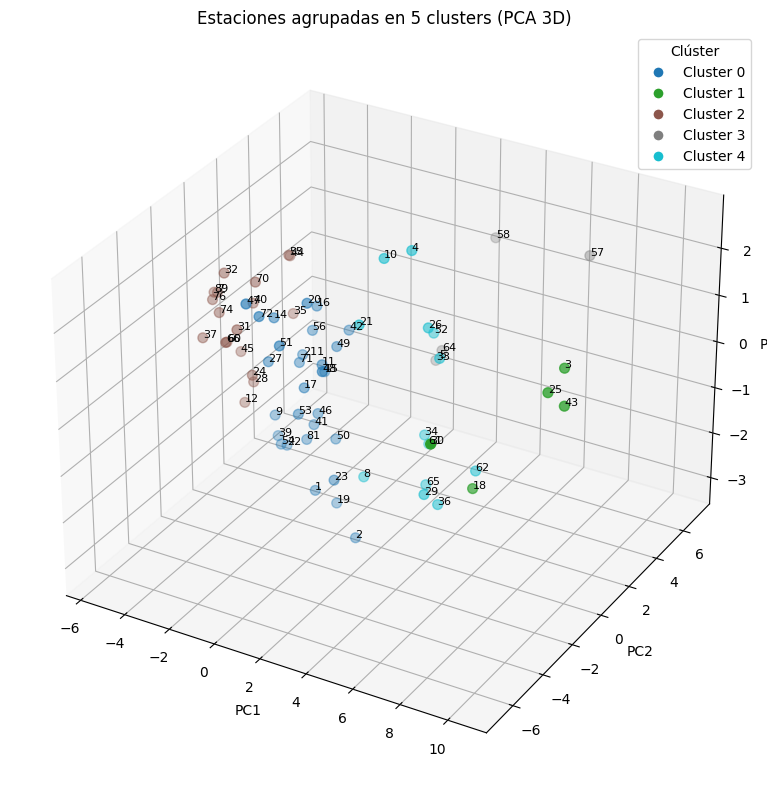

In [ ]:
k_optimo = 5
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

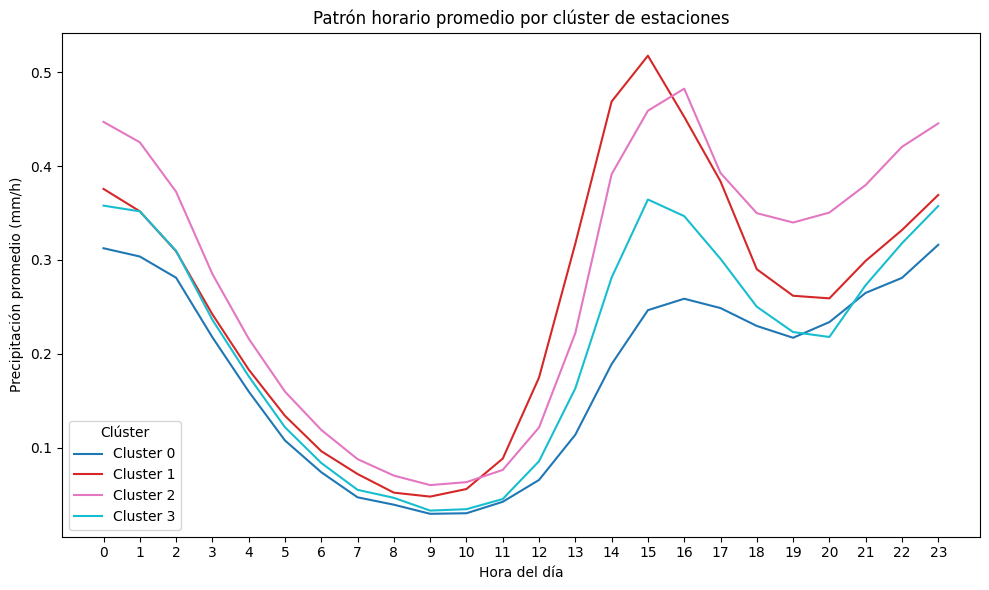

In [ ]:
# # Paso 1: calcular el patrón horario promedio (24 horas) para cada estación
df_lluvia = all_stations_df_10y_imputed.copy()
df_lluvia['hora'] = df_lluvia.index.hour

# # matriz 24h x estaciones
df_horas = df_lluvia.groupby('hora').mean()

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
plt.xticks(ticks=np.arange(0, 24))
plt.xlabel("Hora del día")
plt.ylabel("Precipitación promedio (mm/h)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

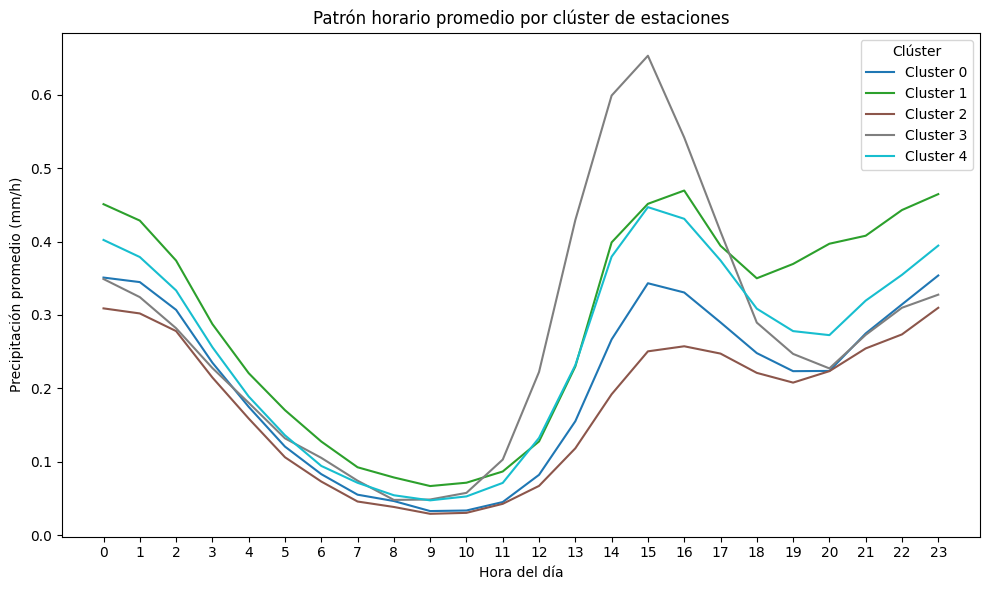

In [ ]:
# # Paso 1: calcular el patrón horario promedio (24 horas) para cada estación
df_lluvia = all_stations_df_10y_imputed.copy()
df_lluvia['hora'] = df_lluvia.index.hour

# # matriz 24h x estaciones
df_horas = df_lluvia.groupby('hora').mean()

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
plt.xticks(ticks=np.arange(0, 24))
plt.xlabel("Hora del día")
plt.ylabel("Precipitación promedio (mm/h)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

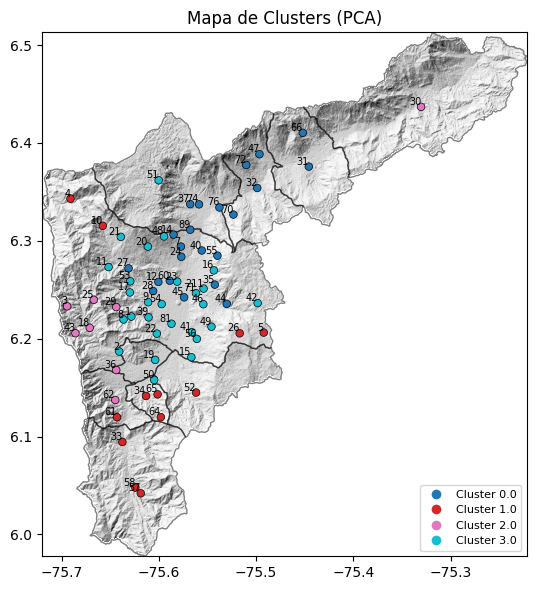

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


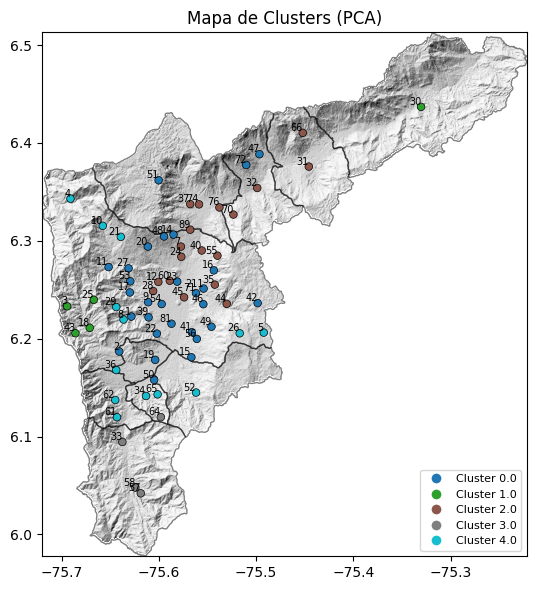

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


Patron_Lluvia
Tarde              24
Otro               23
Madrugada-Noche    22
Name: count, dtype: int64


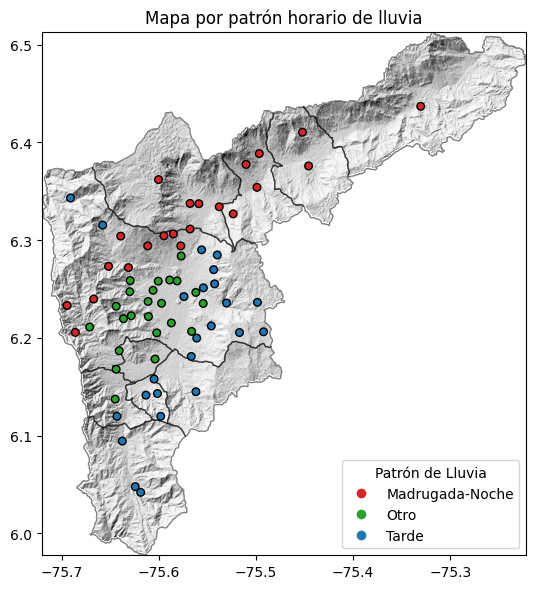

In [ ]:
df_pca_scores = pd.DataFrame({
    'Estacion': X.index.astype(int),  # si usaste los códigos como índice
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'PC3': X_pca[:, 2],
})

# Regla: si PC2 > 0.2 → lluvia en la tarde / PC2 < 0 y PC3 > 0.1 → lluvia en madrugada/noche
df_pca_scores['Patron_Lluvia'] = df_pca_scores.apply(
    lambda row: 
        'Tarde' if row['PC2'] > 0.2 
      else ('Madrugada-Noche' if (row['PC2'] < 0.2 and row['PC3'] > 0) else 'Otro'),
    axis=1
)

# df_pca_scores['Patron_Lluvia'] = df_pca_scores['PC2'].apply(
#     lambda x: 'Tarde' if x > 0.2 else 'Madrugada-Noche'
# )


# Ver cuántas hay por tipo
print(df_pca_scores['Patron_Lluvia'].value_counts())

# Ver algunas estaciones de cada tipo
df_tarde = df_pca_scores[df_pca_scores['Patron_Lluvia'] == 'Tarde']
df_noche = df_pca_scores[df_pca_scores['Patron_Lluvia'] == 'Madrugada-Noche']

# Exportar
df_pca_scores.to_csv('estaciones_patron_lluvia.csv', index=False)


n_estaciones = len(df_pca_scores)

# Simular clasificación por patrón de lluvia
patterns = ['Tarde' if i % 2 == 0 else 'Madrugada-Noche' for i in range(n_estaciones)]

pluvios_shp_c['Patron_Lluvia'] = pluvios_shp_c.index.map(df_pca_scores.set_index('Estacion')['Patron_Lluvia'])

color_dict = {
    'Tarde': '#1f77b4',            # Azul
    'Madrugada-Noche': '#d62728',   # Rojo
    'Otro': '#2ca02c'              # Verde
}

# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_patron'] = pluvios_shp_c['Patron_Lluvia'].map(color_dict)

pluvios_shp_patron = pluvios_shp_c.dropna(subset=['Patron_Lluvia'])

# Función para graficar el mapa
def plot_patron_lluvia_map(geodf, col_patron='Patron_Lluvia', col_color='color_patron', title="Mapa por patrón horario de lluvia"):
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    
    # Graficar puntos de estaciones
    geodf.plot(ax=ax, c=geodf[col_color], edgecolor='k', markersize=30)

    # Crear leyenda manual
    legend_elements = []
    for patron in sorted(geodf[col_patron].unique()):
        color = geodf.loc[geodf[col_patron] == patron, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=patron,
                                      markerfacecolor=color, markersize=8))
    ax.legend(handles=legend_elements, loc='lower right', title="Patrón de Lluvia")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Mostrar el mapa
plot_patron_lluvia_map(pluvios_shp_patron)



#### **PCA con Matriz de Vecindad Y Clustering Jearquico**

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 4 clusters


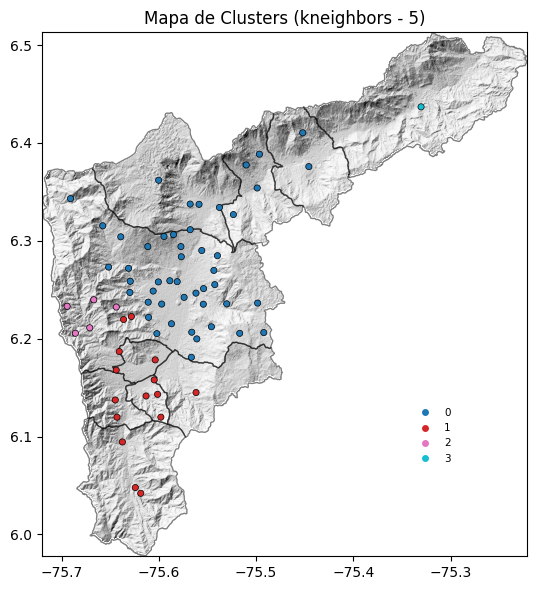

Generando mapa con 5 clusters


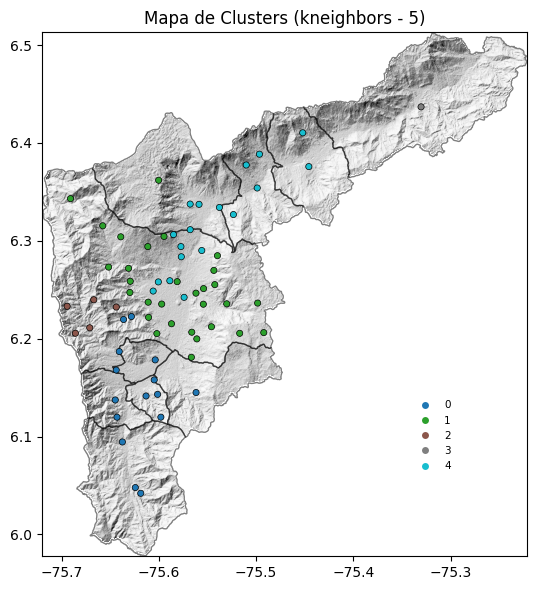

Generando mapa con 6 clusters


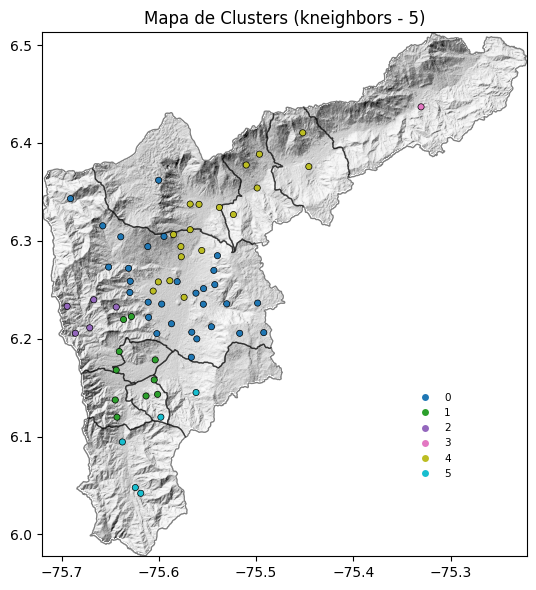

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt


from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")


# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(data, n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(data)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()



# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['Longitude'], row['Latitude']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]



# 1. Extraer patrón medio por hora del día
hourly_pattern_df = all_stations_df_10y_imputed.copy()
hourly_pattern_df['hour'] = hourly_pattern_df.index.hour
hourly_means = hourly_pattern_df.groupby('hour').mean()  # 24 filas x N columnas

# 2. Transponer para que filas = estaciones
X = hourly_means.T  # shape: (n_estaciones, 24 horas)

# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

X_pca_reducido = X_pca[:, :3]



# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [4, 5, 6]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(X_pca_reducido, n_clusters=n, connectivity_method=method, param=param)






## **ANÁLISIS DE PCA CON EST. SIATA DIARIAS**

In [32]:
from glob import glob
import pandas as pd
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score

from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

from sklearn.cluster import KMeans, AgglomerativeClustering
import scipy.cluster.hierarchy as sch

from scipy.spatial.distance import cdist

import numpy as np
import math

import rasterio as rio
import geopandas as gpd
from rasterio.plot import show
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from scipy.cluster.hierarchy import fcluster

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D


hourly_input = '../../DATA/rainfall/hourly_gauges_SIATA_EPM/'
daily_output = '../../DATA/rainfall/daily_gauges_SIATA_EPM/'
monthly_output = '../../DATA/rainfall/monthly_gauges_SIATA_EPM/'
annual_output = '../../DATA/rainfall/annual_gauges_SIATA_EPM/'
path_ENSO = '../../DATA/rainfall/ENSO/'
path_inventory = '../../DATA/landslides/'
output_figures = '../../FIGURES/temporal_analysis/'


# 📌 Definir rutas de archivos
main = '/run/media/oisanchezp/datos/MAESTRIA/Maestria_Daissy/DEM-20240409T233930Z-001/DEM/'
ruta_amva = '/home/oisanchezp/Geotecnia/shape_files/'
ruta_coor = '/home/oisanchezp/Geotecnia/shape_files/Est_All/'


# 📌 Cargar datos espaciales
hill_src = rio.open(main + "DEM_west_Hillshade_Clip_r.tif")
hill = hill_src.read(1)
hill = np.where(hill == hill[0, 0], np.nan, hill)

AMVA = gpd.read_file(f"{ruta_amva}mpios_amva_qnk.shp")
pluvios_shp = gpd.read_file(ruta_coor + "Est_All.shp")

In [33]:
# 1. Obtén la lista de archivos diarios
daily_files = sorted(glob(daily_output + 'Daily_Est_*.csv'))

# 2. Extrae el número de estación desde el nombre de archivo
stations_with_paths = [
    (int(os.path.basename(file).split('_')[-1].split('.')[0]), file) 
    for file in daily_files
]

# 3. Ordena la lista por número de estación
stations_with_paths_sorted = sorted(stations_with_paths, key=lambda x: x[0])

# 4. Filtra las estaciones de SIATA (excluyendo las últimas 16, que asumes son EPM)
siata_stations_with_paths = stations_with_paths_sorted[:-16]

# 5. Carga y renombra los datos de cada estación
data_frames = []
station_numbers = []

for station_number, file in siata_stations_with_paths:
    # Lee el archivo CSV usando 'Fecha' como índice de tipo datetime
    station_data = pd.read_csv(file, index_col='Fecha', parse_dates=True)

    # Intenta renombrar la columna de precipitación como 'Est_{station_number}'
    if 'P' in station_data.columns:
        station_data.rename(columns={'P': f'Est_{station_number}'}, inplace=True)
    else:
        # Si no existe la columna 'P', busca alguna columna que contenga 'P' en su nombre
        precip_column = [col for col in station_data.columns if 'P' in col.upper()]
        if precip_column:
            station_data.rename(
                columns={precip_column[0]: f'Est_{station_number}'}, 
                inplace=True
            )
        else:
            print(f"Advertencia: No se encontró columna de precipitación en {file}")
            continue

    data_frames.append(station_data)
    station_numbers.append(station_number)

# 6. Concatena todos los DataFrames, uniendo por índice (outer join)
all_stations_df = pd.concat(data_frames, axis=1, join='outer')


# Dejar estaciones con 10 o más años de datos
min_hours = 10 * 365
# Filtra columnas (estaciones) que tengan al menos 'min_hours' datos válidos (no nulos)
all_stations_df_10y = all_stations_df.loc[:, all_stations_df.count() >= min_hours]

# Filtrar filas desde '2013-01-01' hasta el final de las series
all_stations_df_10y = all_stations_df_10y.loc['2013-01-01':]

# Mostrar la cantidad de datos faltantes por estación
missing_values = all_stations_df_10y.isna().sum()
total_days = len(all_stations_df_10y)
missing_percentage = (missing_values / total_days) * 100


# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)


def imputar_nan_diario(df):
    """
    Rellena los valores NaN en un DataFrame de series temporales diarias.
    
    1. Interpola valores ausentes de hasta un límite de días consecutivos (por ejemplo, 7).
    2. Rellena los NaN restantes con la media de cada día del año (dayofyear).

    Args:
        df (pd.DataFrame): 
            DataFrame con índice de tipo fecha (diario) y 
            columnas correspondientes a distintas series (por ejemplo, estaciones).
    
    Returns:
        pd.DataFrame: DataFrame con los NaN imputados.
    """
    df_imputado = df.copy()
    
    # Paso 1: Interpola huecos de hasta 'limit' días consecutivos
    # (Puedes ajustar limit según tus necesidades: 7, 5, 3, etc.)
    df_imputado = df_imputado.interpolate(method='time', limit=2, limit_direction='both')
    
    # Paso 2: Rellenar lo que quede con la media de cada día del año
    # Creamos una columna auxiliar con el día del año
    df_imputado['DiaDelAnio'] = df_imputado.index.dayofyear
    
    # Calculamos la media para cada día del año; transform('mean') aplica 
    # la operación columna por columna dentro de cada grupo.
    medias_por_dia = df_imputado.groupby('DiaDelAnio').transform('mean')
    
    # Rellenamos los NaN con esos valores medios
    df_imputado = df_imputado.fillna(medias_por_dia)
    
    # Eliminamos la columna auxiliar
    df_imputado.drop(columns=['DiaDelAnio'], inplace=True)
    
    return df_imputado


all_stations_df_10y_imputed = imputar_nan_diario(all_stations_df_10y)


missing_values_2 = all_stations_df_10y_imputed.isna().sum()
total_days = len(all_stations_df_10y_imputed)
missing_percentage = (missing_values_2 / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values_2,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)


all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

all_stations_df_10y_imputed.to_csv('../../DATA/all_stations_SIATA_daily.csv', index=True)

Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  0             0.0
Est_2                  0             0.0
Est_3                  0             0.0
Est_4                  0             0.0
Est_5                  0             0.0
...                  ...             ...
Est_76                 0             0.0
Est_81                 0             0.0
Est_88                 0             0.0
Est_89                 0             0.0
Est_211                0             0.0

[70 rows x 2 columns]


#### Aplicamos PCA

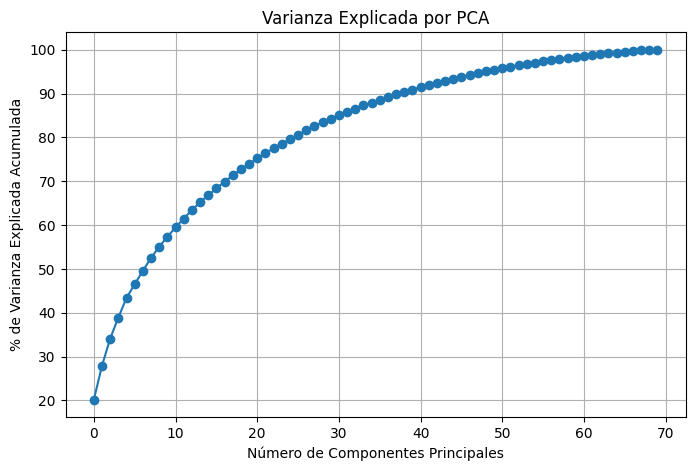

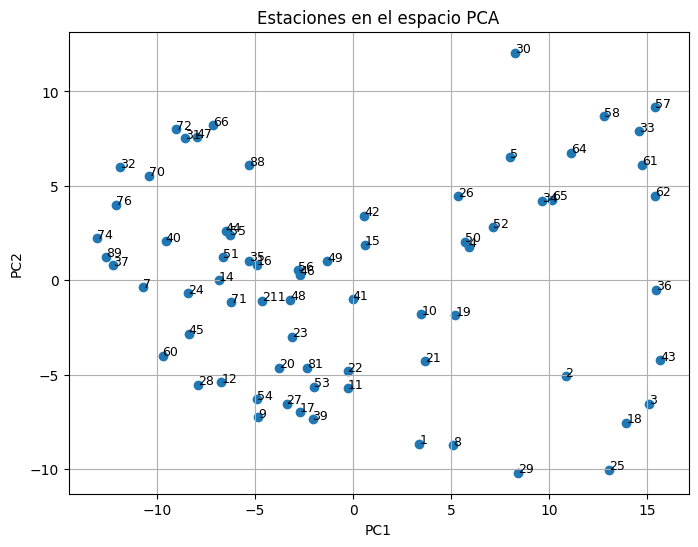

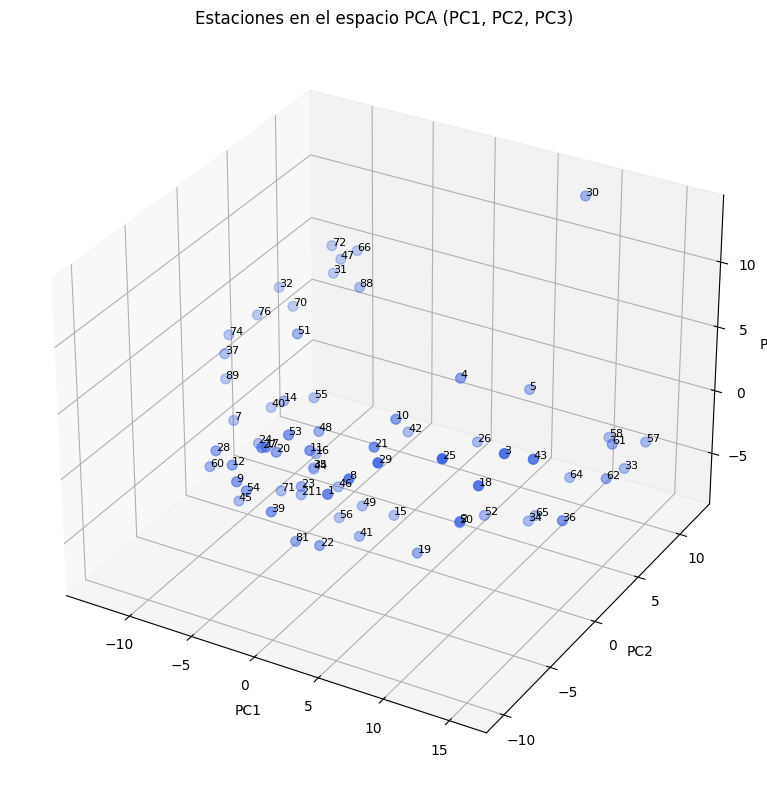

/tmp/ipykernel_44487/1004697415.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


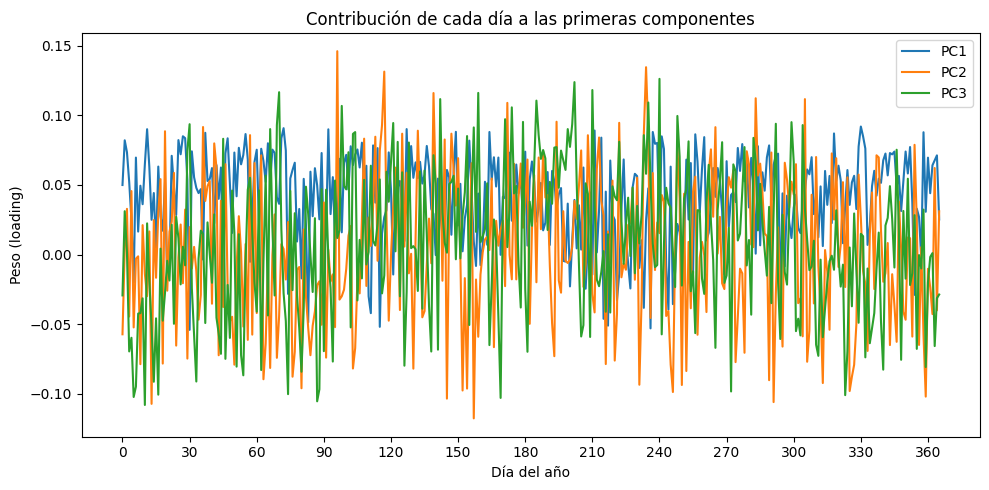

/tmp/ipykernel_44487/1004697415.py:89: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))


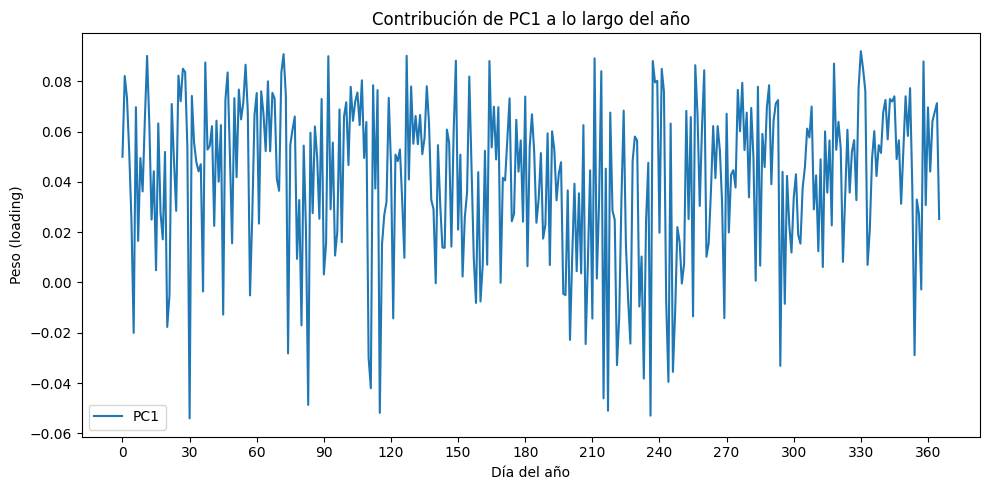

In [18]:


# 1. Extraer patrón medio por hora del día
daily_pattern_df = all_stations_df_10y_imputed.copy()
daily_pattern_df['day'] = daily_pattern_df.index.dayofyear
daily_means = daily_pattern_df.groupby('day').mean()  # 24 filas x N columnas

# 2. Transponer para que filas = estaciones
X = daily_means.T  # shape: (n_estaciones, 24 horas)

# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

# 5. Varianza explicada
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_)*100, marker='o')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('% de Varianza Explicada Acumulada')
plt.title('Varianza Explicada por PCA')
plt.grid(True)
plt.show()

# 6. Visualizar primeras 2 componentes
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1])
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=9)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Estaciones en el espacio PCA')
plt.grid(True)
plt.show()

# Gráfico 3D de las tres primeras componentes
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Coordenadas en el espacio PCA
x = X_pca[:, 0]  # PC1
y = X_pca[:, 1]  # PC2
z = X_pca[:, 2]  # PC3

# Graficar puntos
ax.scatter(x, y, z, c='royalblue', s=50)

# Añadir etiquetas a cada punto (nombre de estación)
for i, est in enumerate(X.index):
    ax.text(x[i], y[i], z[i], str(est), size=8)

# Etiquetas de ejes
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('Estaciones en el espacio PCA (PC1, PC2, PC3)')

plt.tight_layout()
plt.show()

#----------------------------------------------------------------------------
# ------------------- Constribución de días a las primeras componentes ------------
#----------------------------------------------------------------------------
from matplotlib.ticker import MultipleLocator

# Ejemplo para las tres primeras componentes:
fig, ax = plt.subplots(figsize=(10, 5))
for i in range(3):
    ax.plot(np.arange(366), pca.components_[i], label=f'PC{i+1}')

# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
ax.set_ylabel('Peso (loading)')
ax.set_title('Contribución de cada día a las primeras componentes')
ax.legend()
plt.tight_layout()
plt.show()


# Si sólo quieres la primera componente:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(np.arange(366), pca.components_[0], label='PC1')

ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))

ax.set_xlabel('Día del año')
ax.set_ylabel('Peso (loading)')
ax.set_title('Contribución de PC1 a lo largo del año')
ax.legend()
plt.tight_layout()
plt.show()

#### **Con KMEANS**

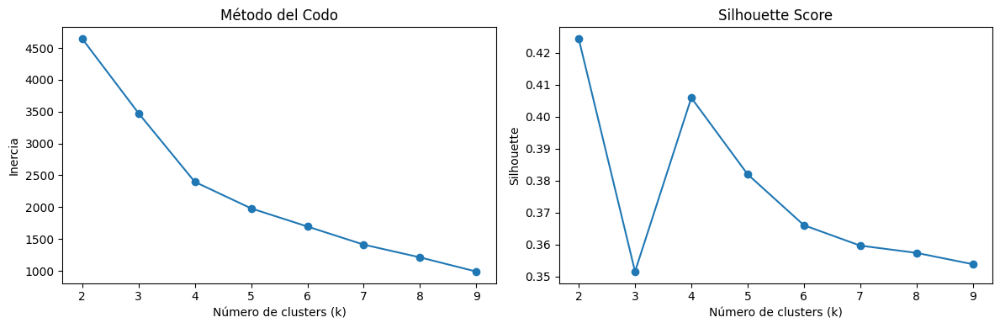

In [19]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertias = []
silhouettes = []

k_range = range(2, 10)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca[:, :3])  # Solo usamos PC1 y PC2
    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X_pca[:, :3], kmeans.labels_))

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia")

plt.subplot(1, 2, 2)
plt.plot(k_range, silhouettes, marker='o')
plt.title("Silhouette Score")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette")

plt.tight_layout()
plt.show()


#### **Con Clustering Jerarquico**

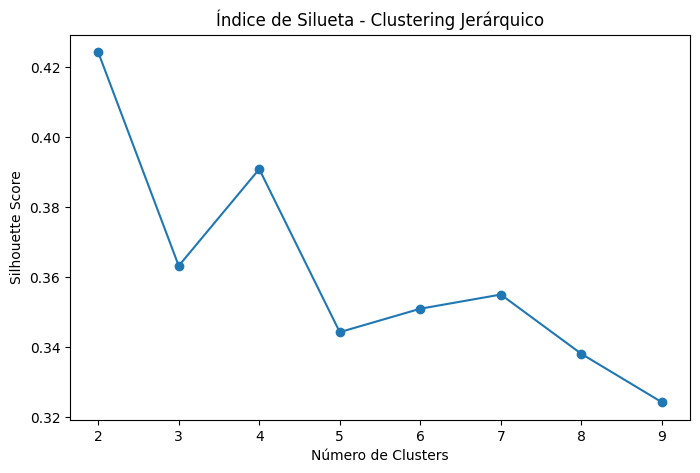

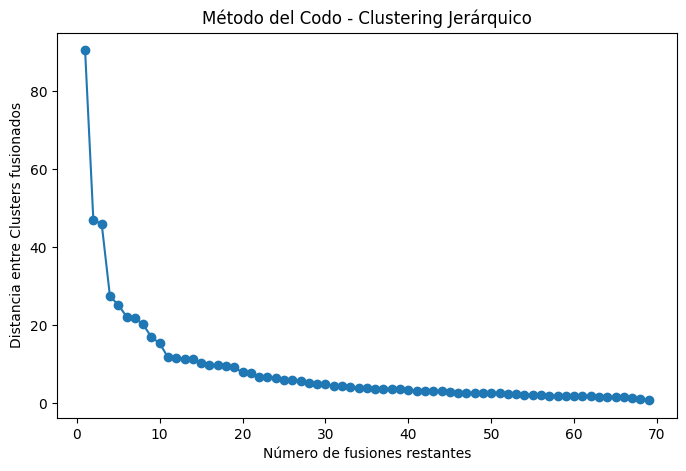

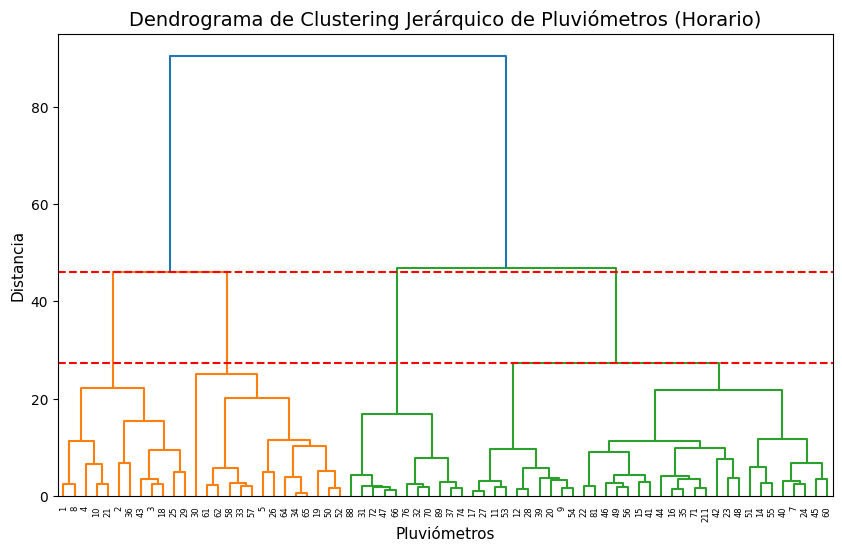

In [20]:
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# 1. Matriz PCA reducida (usamos 3 componentes)
X_pca_reducido = X_pca[:, :3]

# 2. Calcular la matriz de linkage (clustering jerárquico)
Z = linkage(X_pca_reducido, method='ward', metric='euclidean')

# 3. Evaluar silhouette para distintos números de clusters
silhouettes_hier = []
k_range = range(2, 10)

for k in k_range:
    labels = fcluster(Z, k, criterion='maxclust')  # Corta el dendrograma en k clusters
    score = silhouette_score(X_pca_reducido, labels)
    silhouettes_hier.append(score)

# 4. Graficar silhouette
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouettes_hier, marker='o')
plt.title('Índice de Silueta - Clustering Jerárquico')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()

from scipy.cluster.hierarchy import linkage
import matplotlib.pyplot as plt

# Aplicamos linkage sobre PC1, PC2, PC3
Z = linkage(X_pca[:, :3], method='ward')

# Extraemos las distancias de fusión (columna 2 de Z)
distancias = Z[:, 2]

# Creamos el método del codo: graficar las últimas distancias
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(distancias)+1), distancias[::-1], marker='o')
plt.title('Método del Codo - Clustering Jerárquico')
plt.xlabel('Número de fusiones restantes')
plt.ylabel('Distancia entre Clusters fusionados')
plt.show()


plt.figure(figsize=(10, 6))
dendrogram = sch.dendrogram(
    Z,
    labels=all_stations_df_10y_imputed.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

from scipy.cluster.hierarchy import cut_tree

# Línea para cortar en k clusters (por ejemplo, k = 4)
plt.axhline(y=Z[-(5 - 1), 2], c='red', ls='--')
# Línea para cortar en k clusters (por ejemplo, k = 4)
plt.axhline(y=Z[-(4 - 1), 2], c='red', ls='--')

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Horario)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)
plt.show()




/tmp/ipykernel_44487/3835281977.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


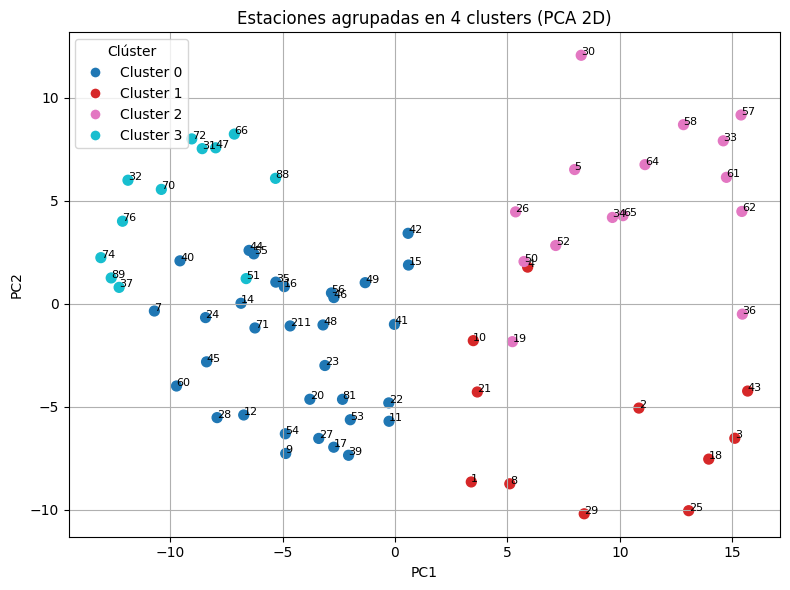

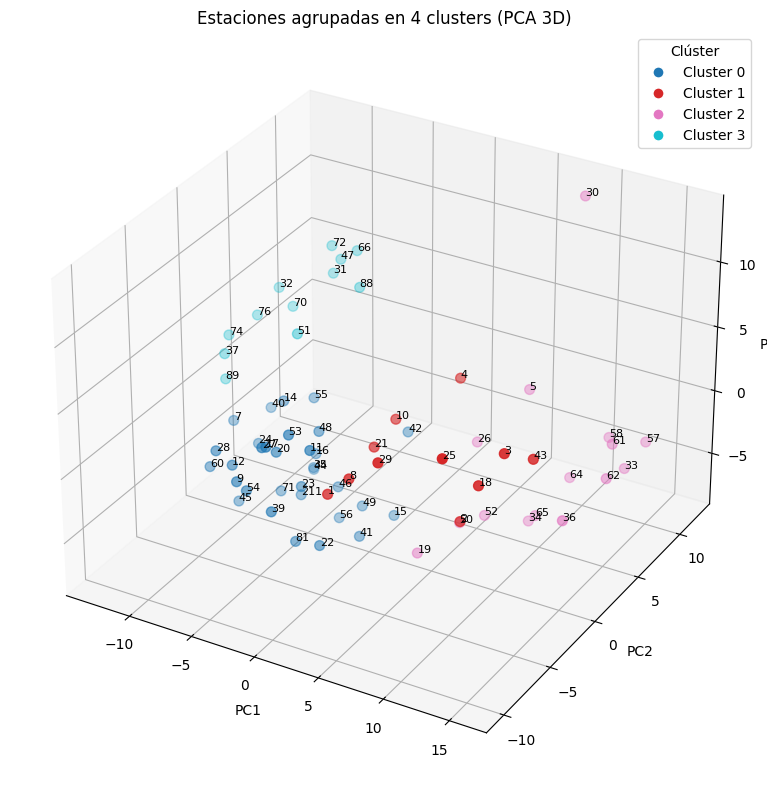

In [21]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 4
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/3835281977.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


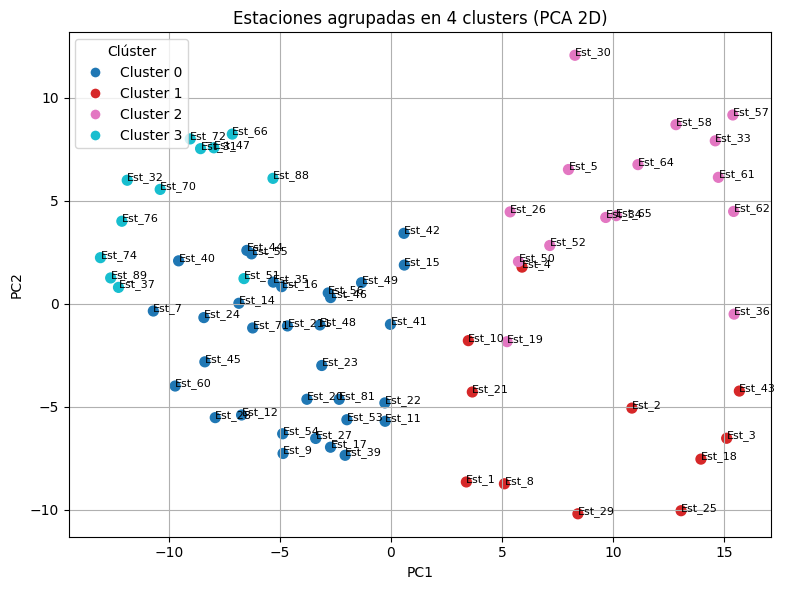

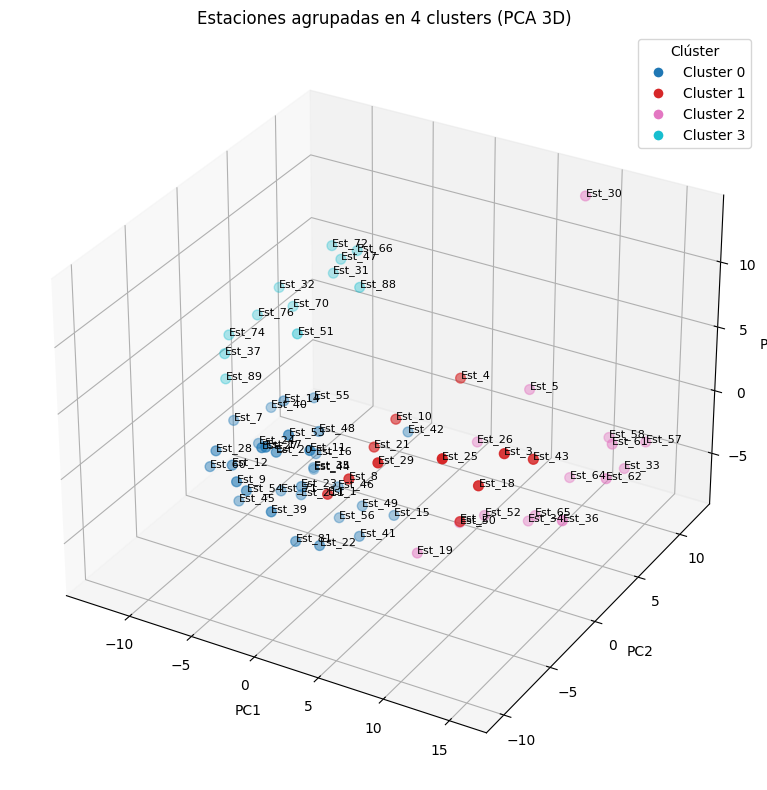

In [12]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 4
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/1110397077.py:41: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


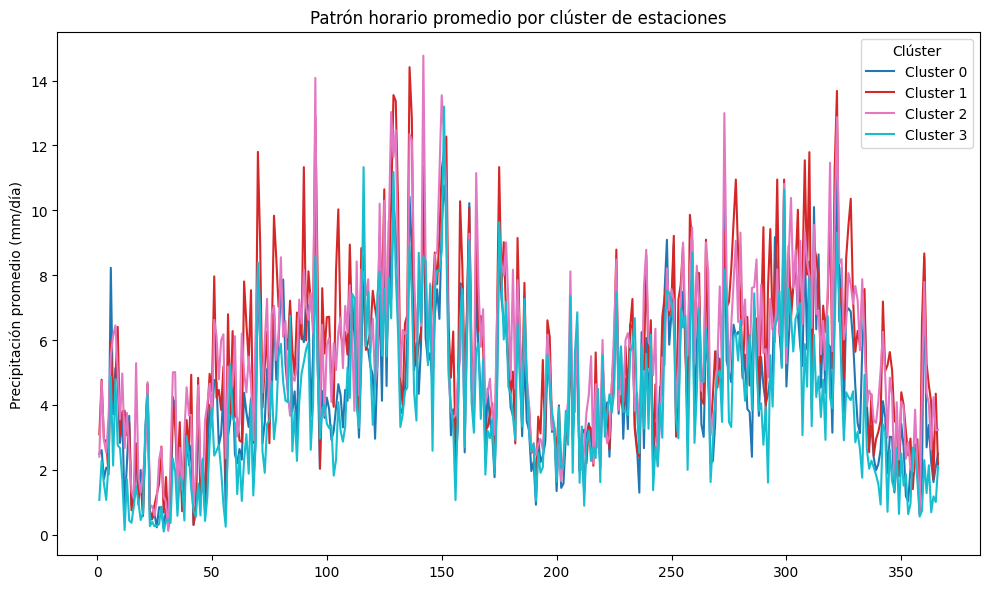

In [22]:
# # Paso 1: calcular el patrón horario promedio (24 horas) para cada estación
df_lluvia = all_stations_df_10y_imputed.copy()
df_lluvia['day'] = df_lluvia.index.dayofyear

# # matriz 24h x estaciones
df_horas = df_lluvia.groupby('day').mean()

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
plt.ylabel("Precipitación promedio (mm/día)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

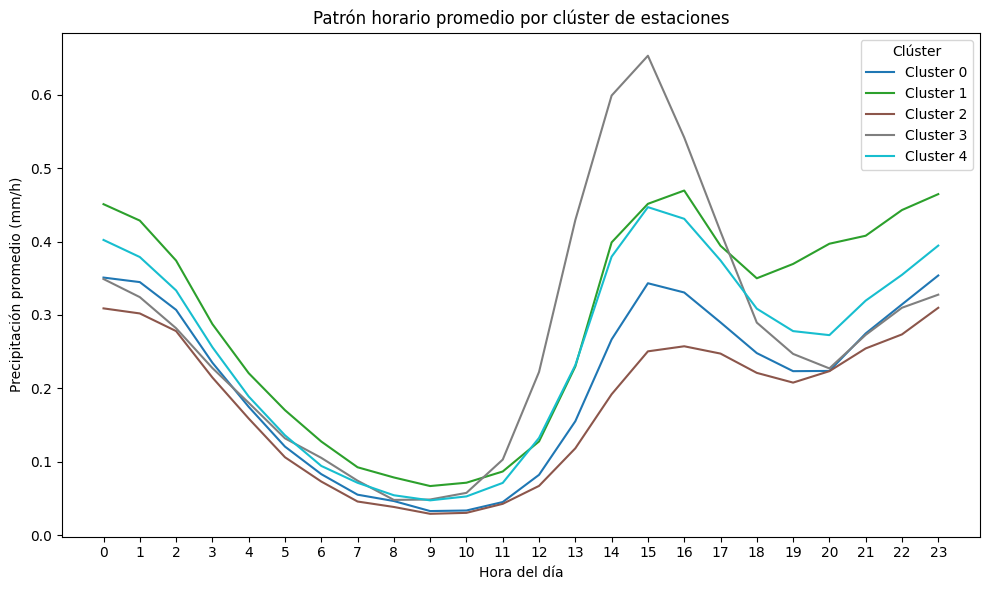

In [ ]:
# # Paso 1: calcular el patrón horario promedio (24 horas) para cada estación
df_lluvia = all_stations_df_10y_imputed.copy()
df_lluvia['hora'] = df_lluvia.index.hour

# # matriz 24h x estaciones
df_horas = df_lluvia.groupby('hora').mean()

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
plt.xticks(ticks=np.arange(0, 24))
plt.xlabel("Hora del día")
plt.ylabel("Precipitación promedio (mm/h)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

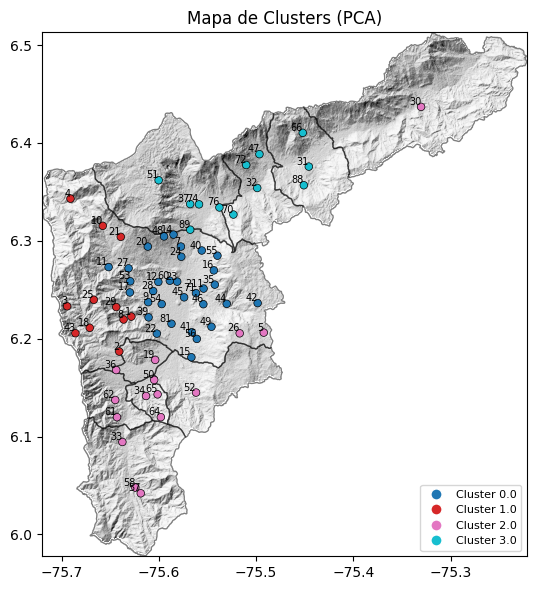

In [23]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()


# 1. Extraer patrón medio por hora del día
daily_pattern_df = all_stations_df_10y_imputed.copy()
daily_pattern_df['day'] = daily_pattern_df.index.dayofyear
daily_means = daily_pattern_df.groupby('day').mean()  # 24 filas x N columnas

# 2. Transponer para que filas = estaciones
X = daily_means.T  # shape: (n_estaciones, 24 horas)


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


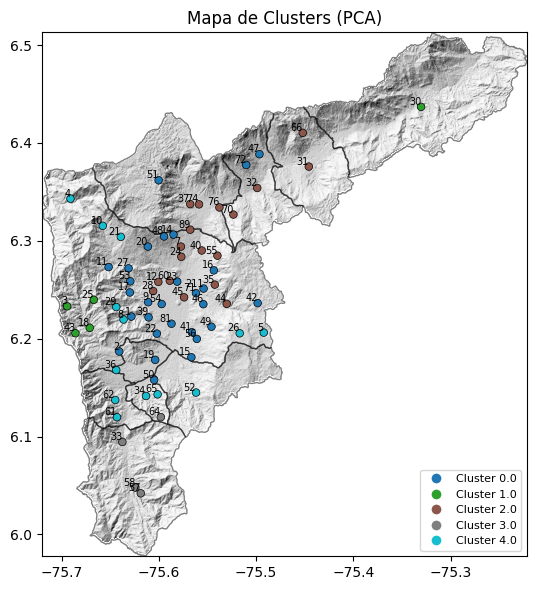

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


#### **PCA con Matriz de Vecindad Y Clustering Jearquico**

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 4 clusters


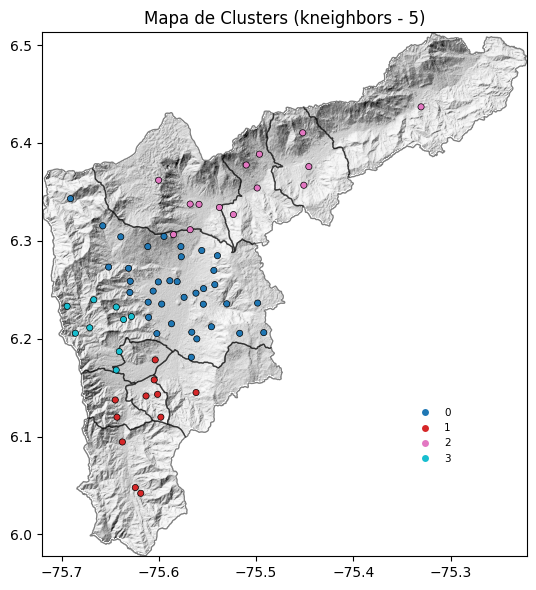

Generando mapa con 5 clusters


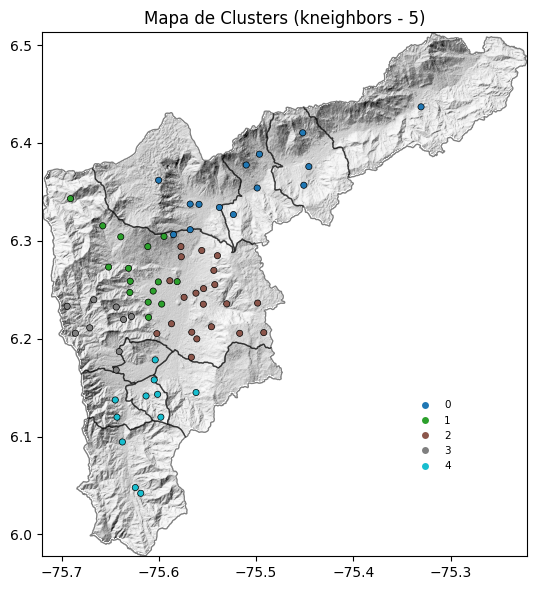

Generando mapa con 6 clusters


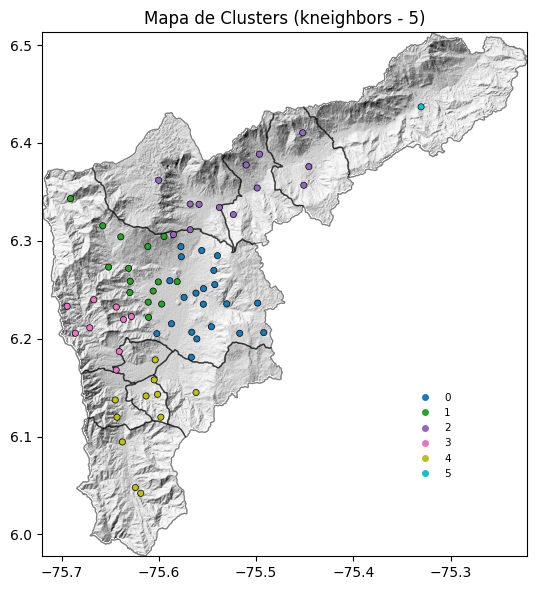

In [24]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt


from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")


# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(data, n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(data)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()



# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['Longitude'], row['Latitude']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]


# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

X_pca_reducido = X_pca[:, :3]



# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [4, 5, 6]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(X_pca_reducido, n_clusters=n, connectivity_method=method, param=param)






## **ANÁLISIS DE PCA CON EST. SIATA MENSUALES**

In [34]:
from glob import glob
import pandas as pd
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score

from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

from sklearn.cluster import KMeans, AgglomerativeClustering
import scipy.cluster.hierarchy as sch

from scipy.spatial.distance import cdist

import numpy as np
import math

import rasterio as rio
import geopandas as gpd
from rasterio.plot import show
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from scipy.cluster.hierarchy import fcluster

hourly_input = '../../DATA/rainfall/hourly_gauges_SIATA_EPM/'
daily_output = '../../DATA/rainfall/daily_gauges_SIATA_EPM/'
monthly_output = '../../DATA/rainfall/monthly_gauges_SIATA_EPM/'
annual_output = '../../DATA/rainfall/annual_gauges_SIATA_EPM/'
path_ENSO = '../../DATA/rainfall/ENSO/'
path_inventory = '../../DATA/landslides/'
output_figures = '../../FIGURES/temporal_analysis/'


# 📌 Definir rutas de archivos
main = '/run/media/oisanchezp/datos/MAESTRIA/Maestria_Daissy/DEM-20240409T233930Z-001/DEM/'
ruta_amva = '/home/oisanchezp/Geotecnia/shape_files/'
ruta_coor = '/home/oisanchezp/Geotecnia/shape_files/Est_All/'


# 📌 Cargar datos espaciales
hill_src = rio.open(main + "DEM_west_Hillshade_Clip_r.tif")
hill = hill_src.read(1)
hill = np.where(hill == hill[0, 0], np.nan, hill)

AMVA = gpd.read_file(f"{ruta_amva}mpios_amva_qnk.shp")
pluvios_shp = gpd.read_file(ruta_coor + "Est_All.shp")

In [35]:
# 1. Obtén la lista de archivos diarios
daily_files = sorted(glob(monthly_output + 'Monthly_Est_*.csv'))

# 2. Extrae el número de estación desde el nombre de archivo
stations_with_paths = [
    (int(os.path.basename(file).split('_')[-1].split('.')[0]), file) 
    for file in daily_files
]

# 3. Ordena la lista por número de estación
stations_with_paths_sorted = sorted(stations_with_paths, key=lambda x: x[0])

# 4. Filtra las estaciones de SIATA (excluyendo las últimas 16, que asumes son EPM)
siata_stations_with_paths = stations_with_paths_sorted[:-16]

# 5. Carga y renombra los datos de cada estación
data_frames = []
station_numbers = []

for station_number, file in siata_stations_with_paths:
    # Lee el archivo CSV usando 'Fecha' como índice de tipo datetime
    station_data = pd.read_csv(file, index_col='Fecha', parse_dates=True)

    # Intenta renombrar la columna de precipitación como 'Est_{station_number}'
    if 'P' in station_data.columns:
        station_data.rename(columns={'P': f'Est_{station_number}'}, inplace=True)
    else:
        # Si no existe la columna 'P', busca alguna columna que contenga 'P' en su nombre
        precip_column = [col for col in station_data.columns if 'P' in col.upper()]
        if precip_column:
            station_data.rename(
                columns={precip_column[0]: f'Est_{station_number}'}, 
                inplace=True
            )
        else:
            print(f"Advertencia: No se encontró columna de precipitación en {file}")
            continue

    data_frames.append(station_data)
    station_numbers.append(station_number)

# 6. Concatena todos los DataFrames, uniendo por índice (outer join)
all_stations_df = pd.concat(data_frames, axis=1, join='outer')


# Dejar estaciones con 10 o más años de datos
min_hours = 10 * 12  # ~87,600

# Filtra columnas (estaciones) que tengan al menos 'min_hours' datos válidos (no nulos)
all_stations_df_10y = all_stations_df.loc[:, all_stations_df.count() >= min_hours]

# Filtrar filas desde '2013-01-01' hasta el final de las series
all_stations_df_10y = all_stations_df_10y.loc['2013-01-01':]

# Mostrar la cantidad de datos faltantes por estación
missing_values = all_stations_df_10y.isna().sum()
total_days = len(all_stations_df_10y)
missing_percentage = (missing_values / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

def imputar_nan_mensual(df):
    """
    Rellena los valores NaN en un DataFrame de series temporales mensuales.
    
    Para cada mes (por ejemplo, enero, febrero, etc.), se reemplazan los valores faltantes 
    con el promedio de ese mes calculado a partir de los datos de los otros años.
    
    Args:
        df (pd.DataFrame): 
            DataFrame con índice de tipo fecha (mensual) y 
            columnas correspondientes a distintas series (por ejemplo, estaciones).
    
    Returns:
        pd.DataFrame: DataFrame con los NaN imputados.
    """
    df_imputado = df.copy()
    
    # Creamos una columna auxiliar que contiene el mes de cada fecha
    df_imputado['Mes'] = df_imputado.index.month
    
    # Calculamos la media para cada mes, aplicándola columna por columna en cada grupo
    medias_por_mes = df_imputado.groupby('Mes').transform('mean')
    
    # Rellenamos los NaN con la media calculada para cada mes
    df_imputado = df_imputado.fillna(medias_por_mes)
    
    # Eliminamos la columna auxiliar
    df_imputado.drop(columns=['Mes'], inplace=True)
    
    return df_imputado

all_stations_df_10y_imputed = imputar_nan_mensual(all_stations_df_10y)

missing_values_2 = all_stations_df_10y_imputed.isna().sum()
total_days = len(all_stations_df_10y_imputed)
missing_percentage = (missing_values_2 / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values_2,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)


all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)

all_stations_df_10y_imputed.to_csv('../../DATA/all_stations_SIATA_monthly.csv', index=True)

Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  1            0.71
Est_2                  1            0.71
Est_3                  0            0.00
Est_4                  1            0.71
Est_5                  0            0.00
...                  ...             ...
Est_76                 6            4.29
Est_81                 5            3.57
Est_88                10            7.14
Est_89                10            7.14
Est_211                3            2.14

[70 rows x 2 columns]
Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  0             0.0
Est_2                  0             0.0
Est_3                  0             0.0
Est_4                  0             0.0
Est_5                  0             0.0
...                  ...             ...
Est_76                 0             0.0
Est_81                 0             0.0
Est_88          

#### Aplicamos PCA

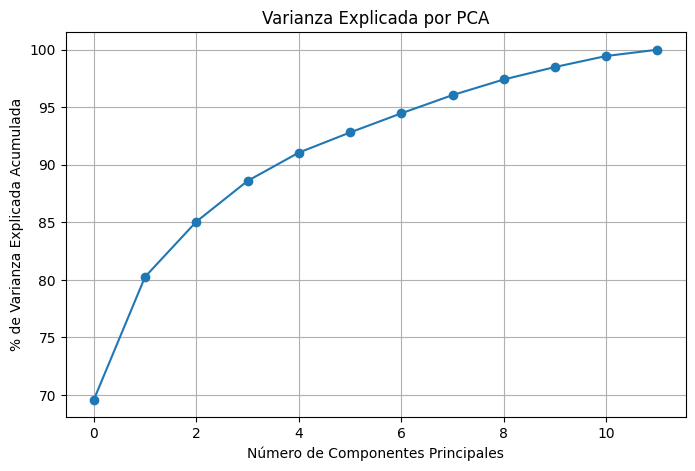

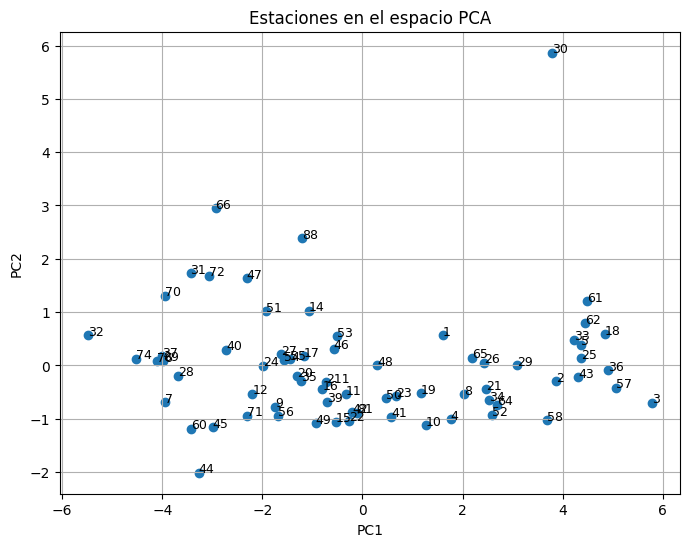

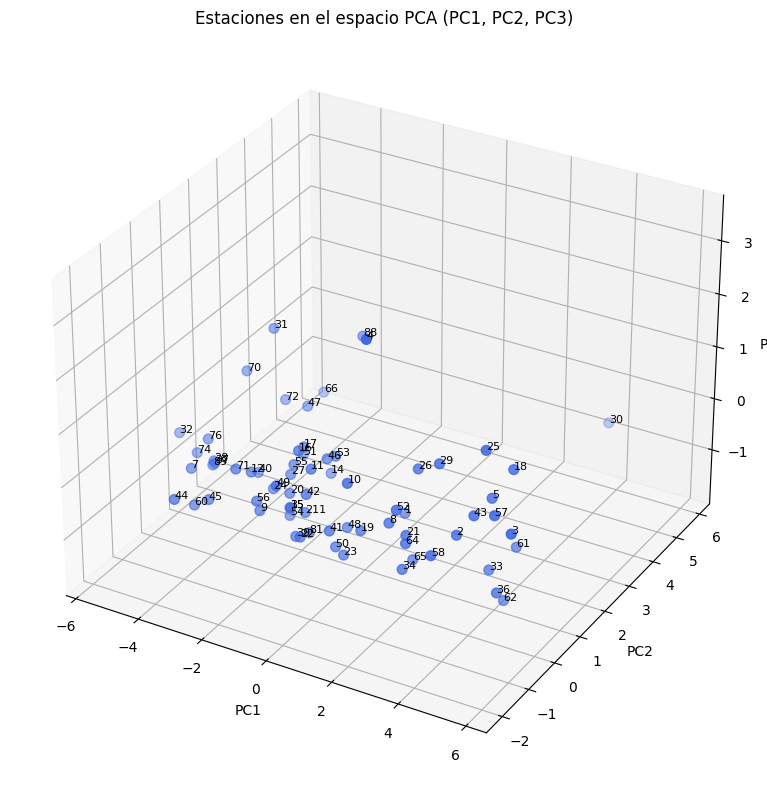

/tmp/ipykernel_44487/405604477.py:78: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


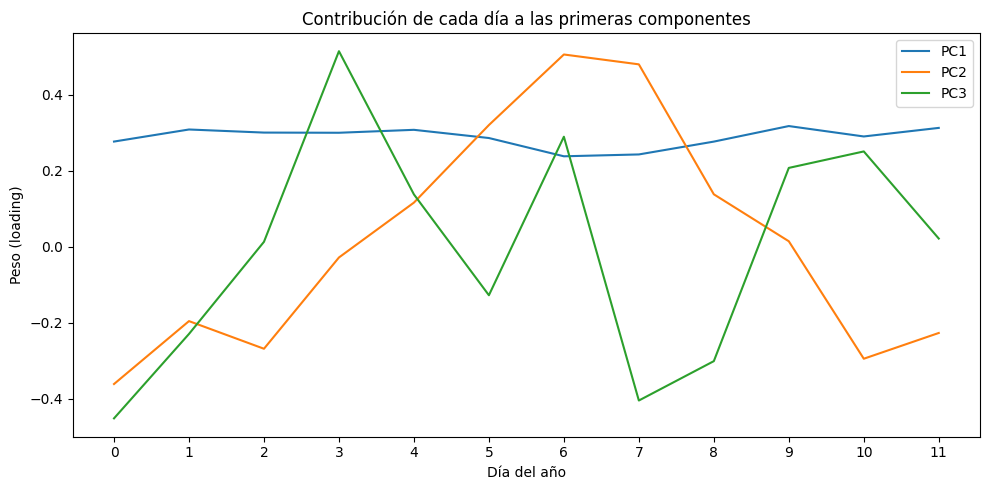

/tmp/ipykernel_44487/405604477.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))


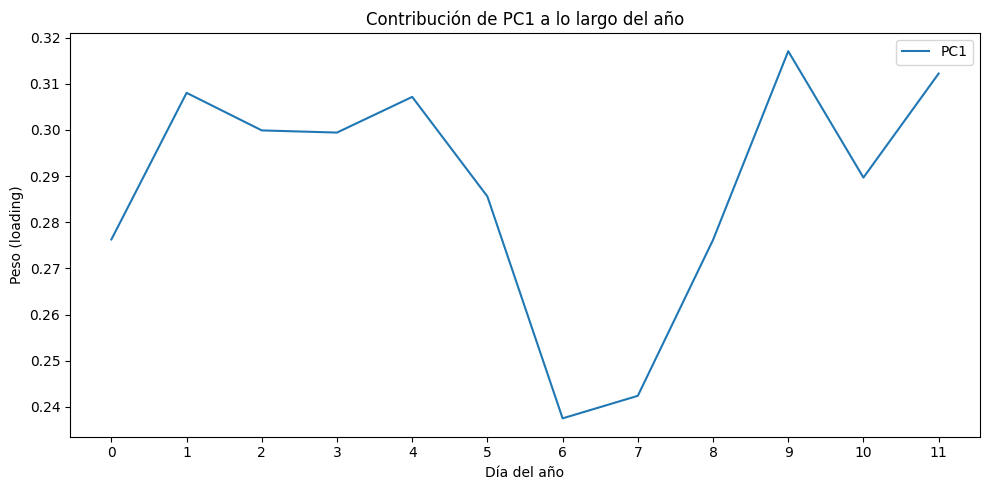

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt

# 1. Extraer patrón medio por hora del día
montly_pattern_df = all_stations_df_10y_imputed.copy()
montly_pattern_df['month'] = montly_pattern_df.index.month
montly_means = montly_pattern_df.groupby('month').mean()  # 24 filas x N columnas

# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)

# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

# 5. Varianza explicada
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_)*100, marker='o')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('% de Varianza Explicada Acumulada')
plt.title('Varianza Explicada por PCA')
plt.grid(True)
plt.show()

# 6. Visualizar primeras 2 componentes
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1])
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=9)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Estaciones en el espacio PCA')
plt.grid(True)
plt.show()

# Gráfico 3D de las tres primeras componentes
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Coordenadas en el espacio PCA
x = X_pca[:, 0]  # PC1
y = X_pca[:, 1]  # PC2
z = X_pca[:, 2]  # PC3

# Graficar puntos
ax.scatter(x, y, z, c='royalblue', s=50)

# Añadir etiquetas a cada punto (nombre de estación)
for i, est in enumerate(X.index):
    ax.text(x[i], y[i], z[i], str(est), size=8)

# Etiquetas de ejes
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('Estaciones en el espacio PCA (PC1, PC2, PC3)')

plt.tight_layout()
plt.show()


#----------------------------------------------------------------------------
# ------------------- Constribución de días a las primeras componentes ------------
#----------------------------------------------------------------------------
from matplotlib.ticker import MultipleLocator

# Ejemplo para las tres primeras componentes:
fig, ax = plt.subplots(figsize=(10, 5))
for i in range(3):
    ax.plot(np.arange(12), pca.components_[i], label=f'PC{i+1}')

# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(1))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
ax.set_ylabel('Peso (loading)')
ax.set_title('Contribución de cada día a las primeras componentes')
ax.legend()
plt.tight_layout()
plt.show()


# Si sólo quieres la primera componente:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(np.arange(12), pca.components_[0], label='PC1')

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.set_xticklabels(ax.get_xticks().astype(int))

ax.set_xlabel('Día del año')
ax.set_ylabel('Peso (loading)')
ax.set_title('Contribución de PC1 a lo largo del año')
ax.legend()
plt.tight_layout()
plt.show()


#### **Con KMEANS**

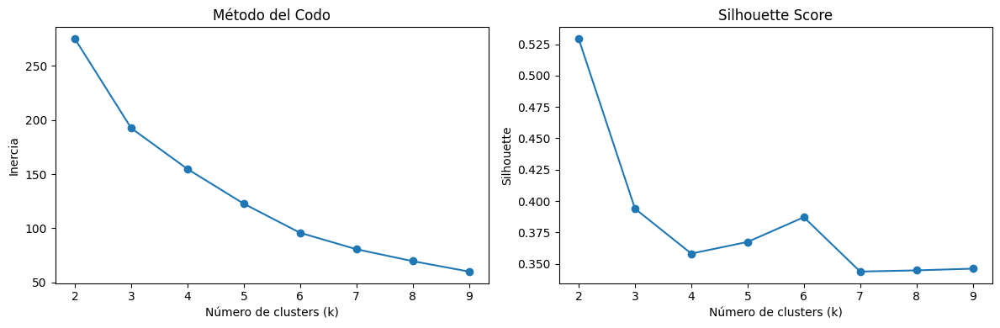

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertias = []
silhouettes = []

k_range = range(2, 10)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca[:, :3])  # Solo usamos PC1 y PC2
    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X_pca[:, :3], kmeans.labels_))

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia")

plt.subplot(1, 2, 2)
plt.plot(k_range, silhouettes, marker='o')
plt.title("Silhouette Score")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette")

plt.tight_layout()
plt.show()


#### **Con Clustering Jerarquico**

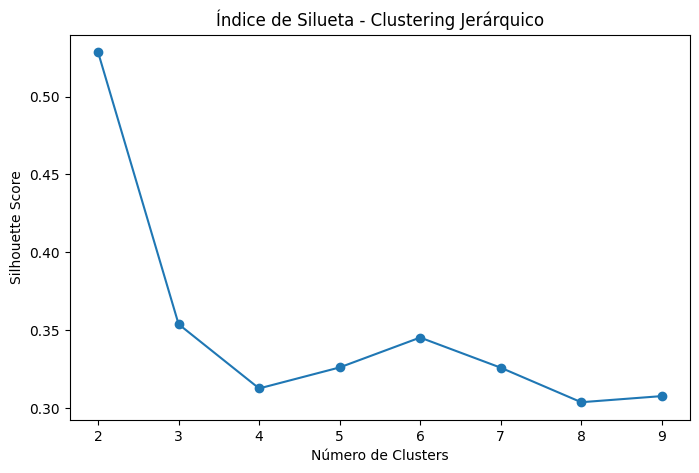

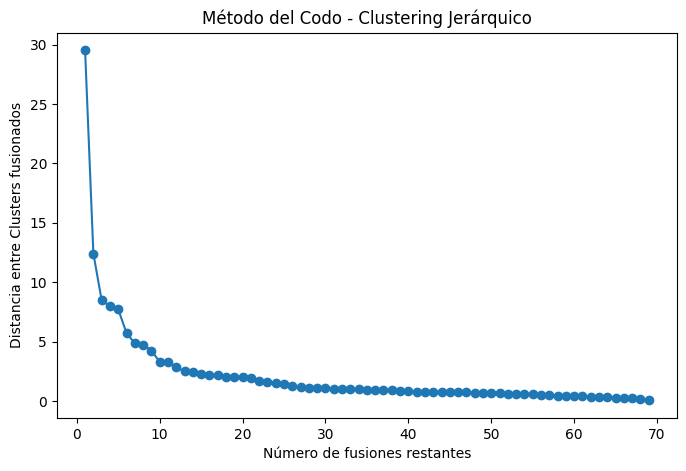

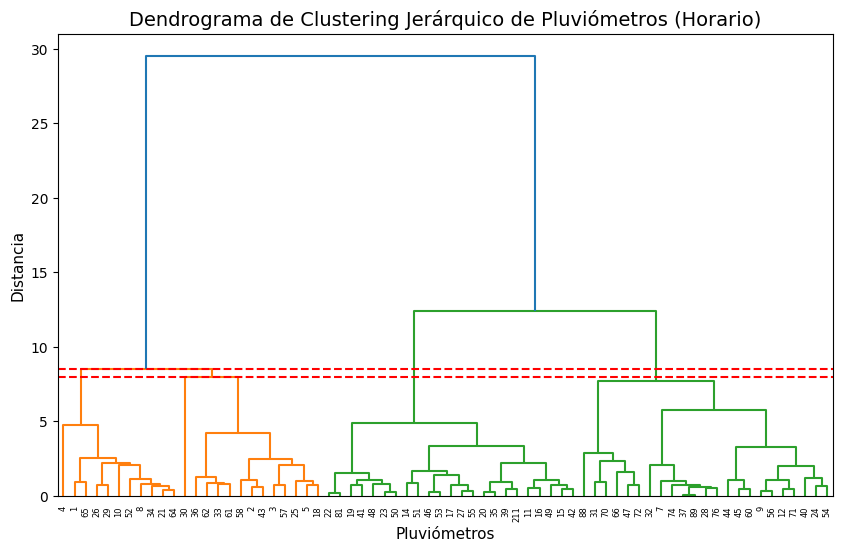

In [ ]:
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# 1. Matriz PCA reducida (usamos 3 componentes)
X_pca_reducido = X_pca[:, :3]

# 2. Calcular la matriz de linkage (clustering jerárquico)
Z = linkage(X_pca_reducido, method='ward', metric='euclidean')

# 3. Evaluar silhouette para distintos números de clusters
silhouettes_hier = []
k_range = range(2, 10)

for k in k_range:
    labels = fcluster(Z, k, criterion='maxclust')  # Corta el dendrograma en k clusters
    score = silhouette_score(X_pca_reducido, labels)
    silhouettes_hier.append(score)

# 4. Graficar silhouette
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouettes_hier, marker='o')
plt.title('Índice de Silueta - Clustering Jerárquico')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()

from scipy.cluster.hierarchy import linkage
import matplotlib.pyplot as plt

# Aplicamos linkage sobre PC1, PC2, PC3
Z = linkage(X_pca[:, :3], method='ward')

# Extraemos las distancias de fusión (columna 2 de Z)
distancias = Z[:, 2]

# Creamos el método del codo: graficar las últimas distancias
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(distancias)+1), distancias[::-1], marker='o')
plt.title('Método del Codo - Clustering Jerárquico')
plt.xlabel('Número de fusiones restantes')
plt.ylabel('Distancia entre Clusters fusionados')
plt.show()


plt.figure(figsize=(10, 6))
dendrogram = sch.dendrogram(
    Z,
    labels=all_stations_df_10y_imputed.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

from scipy.cluster.hierarchy import cut_tree

# Línea para cortar en k clusters (por ejemplo, k = 4)
plt.axhline(y=Z[-(5 - 1), 2], c='red', ls='--')
# Línea para cortar en k clusters (por ejemplo, k = 4)
plt.axhline(y=Z[-(4 - 1), 2], c='red', ls='--')

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Horario)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)
plt.show()




/tmp/ipykernel_44487/3835281977.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


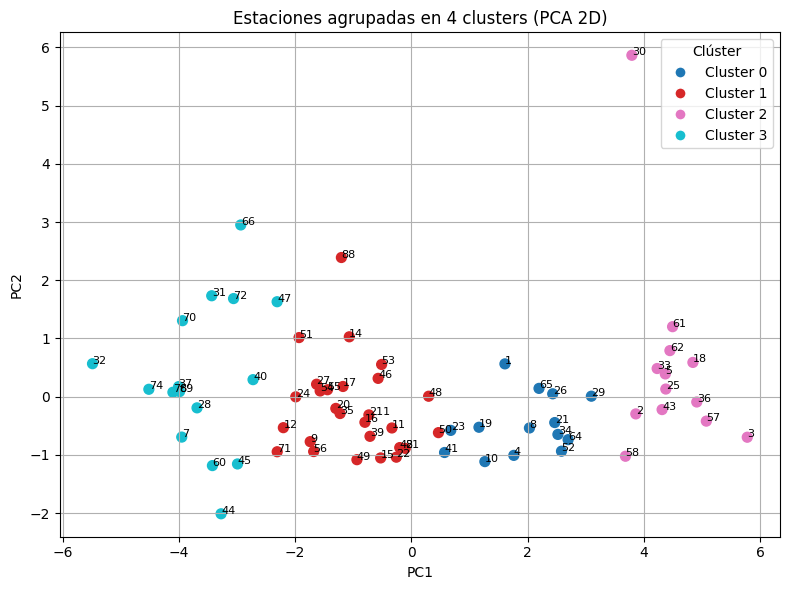

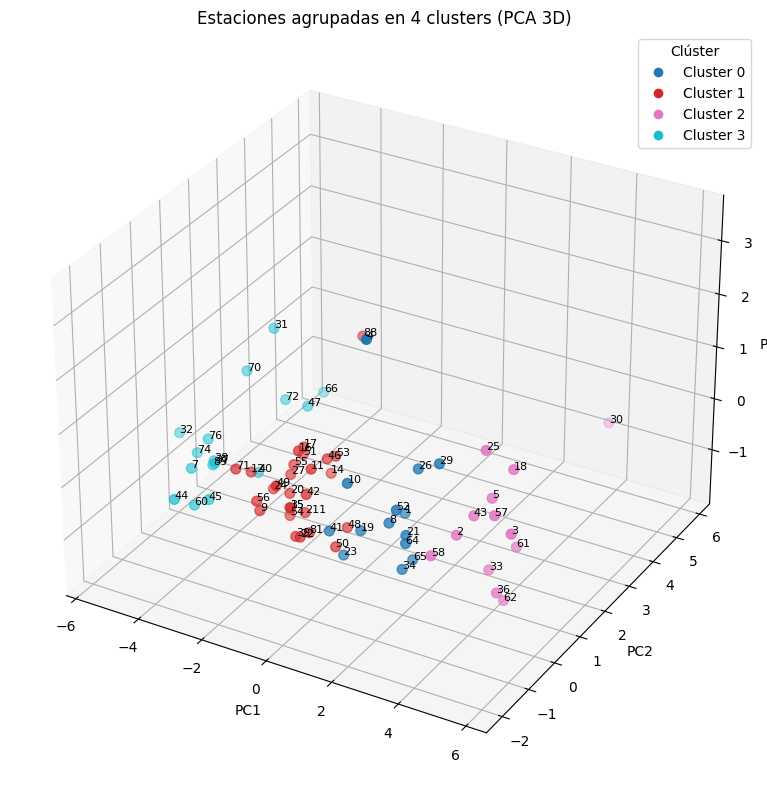

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 4
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/2783672948.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


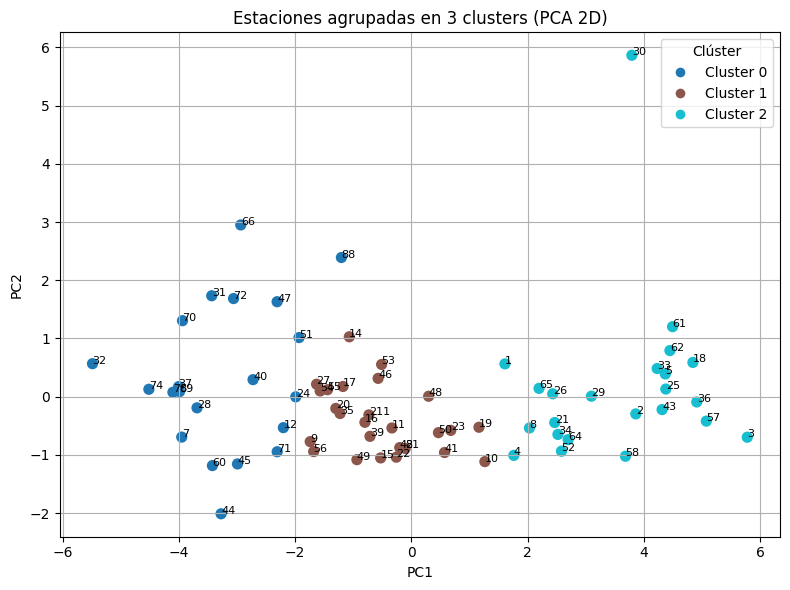

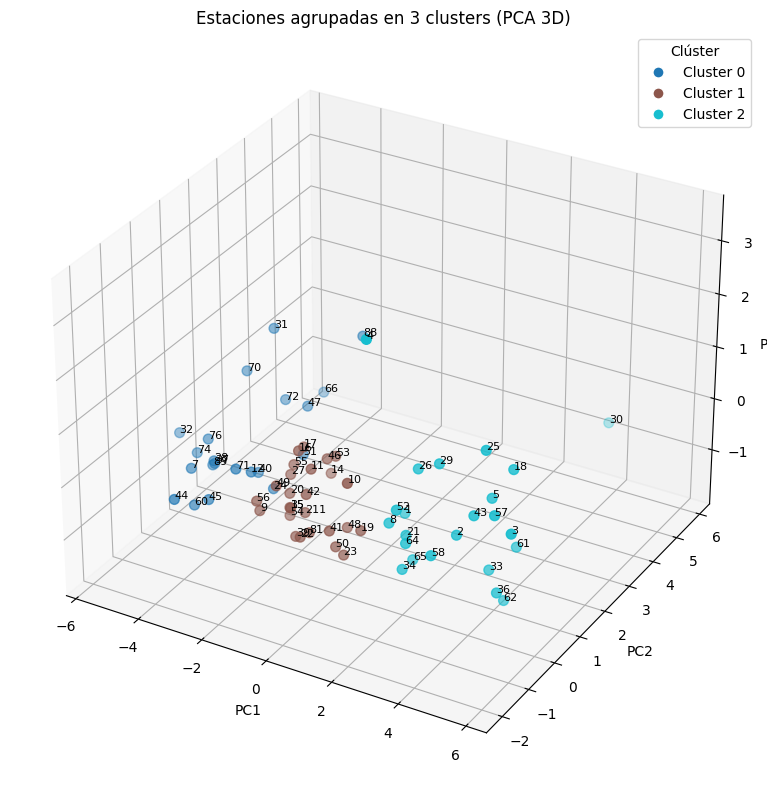

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 3
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/1363418585.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


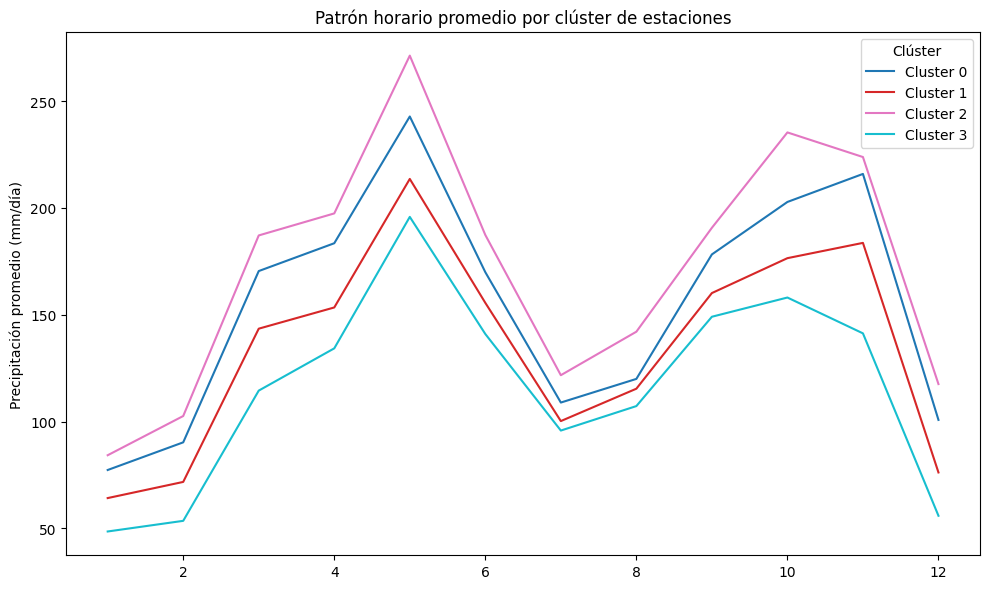

In [ ]:

# # matriz 24h x estaciones
df_horas = montly_means

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
plt.ylabel("Precipitación promedio (mm/día)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/1363418585.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


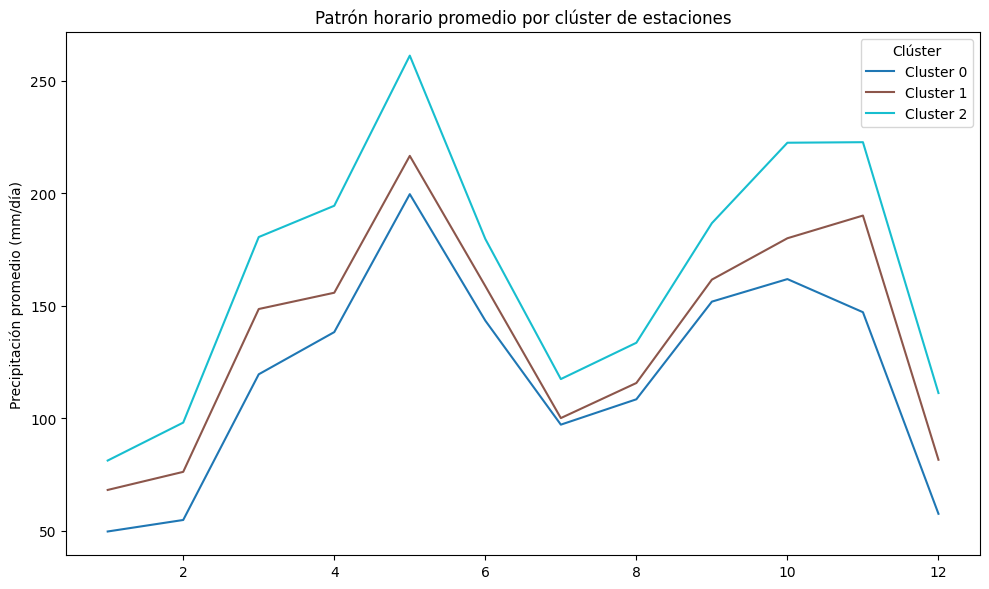

In [ ]:

# # matriz 24h x estaciones
df_horas = montly_means

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
plt.ylabel("Precipitación promedio (mm/día)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

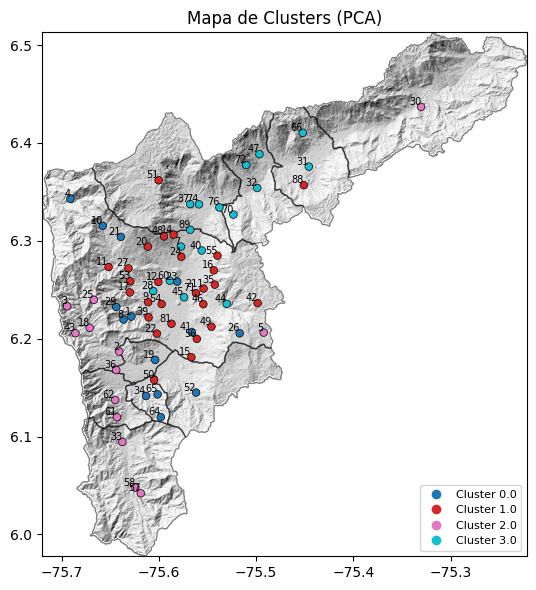

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()



# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


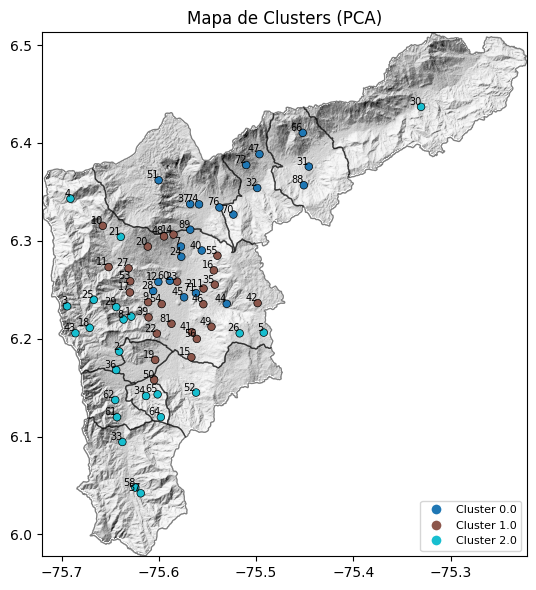

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()



# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


Patron_Lluvia
Otro                   31
Temporada JJA          20
Temporada FMA y SON    19
Name: count, dtype: int64


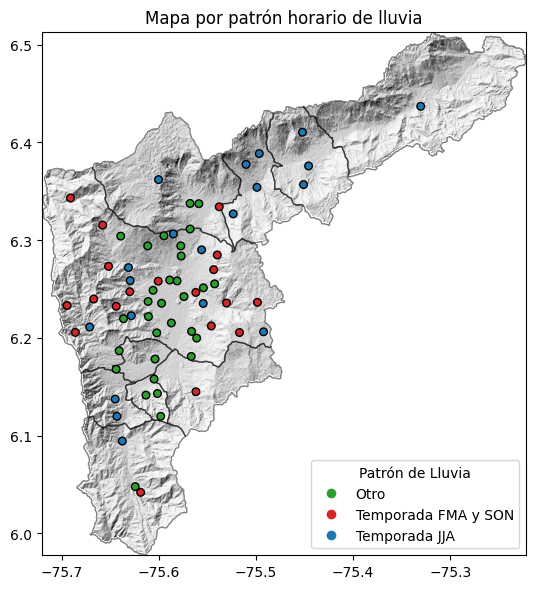

In [ ]:
df_pca_scores = pd.DataFrame({
    'Estacion': X.index.astype(int),  # si usaste los códigos como índice
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'PC3': X_pca[:, 2],
})

# Regla: si PC2 > 0.2 → lluvia en la tarde / PC2 < 0 y PC3 > 0.1 → lluvia en madrugada/noche
df_pca_scores['Patron_Lluvia'] = df_pca_scores.apply(
    lambda row: 
        'Temporada JJA' if row['PC2'] > 0.2 
      else ('Temporada FMA y SON' if (row['PC2'] < 0.2 and row['PC3'] > 0) else 'Otro'),
    axis=1
)

# df_pca_scores['Patron_Lluvia'] = df_pca_scores['PC2'].apply(
#     lambda x: 'Tarde' if x > 0.2 else 'Madrugada-Noche'
# )


# Ver cuántas hay por tipo
print(df_pca_scores['Patron_Lluvia'].value_counts())

# Ver algunas estaciones de cada tipo
df_tarde = df_pca_scores[df_pca_scores['Patron_Lluvia'] == 'Temporada JJA']
df_noche = df_pca_scores[df_pca_scores['Patron_Lluvia'] == 'Temporada FMA y SON']

# Exportar
df_pca_scores.to_csv('estaciones_patron_lluvia.csv', index=False)


n_estaciones = len(df_pca_scores)

# Simular clasificación por patrón de lluvia
patterns = ['Temporada JJA' if i % 2 == 0 else 'Temporada FMA y SON' for i in range(n_estaciones)]

pluvios_shp_c['Patron_Lluvia'] = pluvios_shp_c.index.map(df_pca_scores.set_index('Estacion')['Patron_Lluvia'])

color_dict = {
    'Temporada JJA': '#1f77b4',            # Azul
    'Temporada FMA y SON': '#d62728',   # Rojo
    'Otro': '#2ca02c'              # Verde
}

# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_patron'] = pluvios_shp_c['Patron_Lluvia'].map(color_dict)

pluvios_shp_patron = pluvios_shp_c.dropna(subset=['Patron_Lluvia'])

# Función para graficar el mapa
def plot_patron_lluvia_map(geodf, col_patron='Patron_Lluvia', col_color='color_patron', title="Mapa por patrón horario de lluvia"):
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    
    # Graficar puntos de estaciones
    geodf.plot(ax=ax, c=geodf[col_color], edgecolor='k', markersize=30)

    # Crear leyenda manual
    legend_elements = []
    for patron in sorted(geodf[col_patron].unique()):
        color = geodf.loc[geodf[col_patron] == patron, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=patron,
                                      markerfacecolor=color, markersize=8))
    ax.legend(handles=legend_elements, loc='lower right', title="Patrón de Lluvia")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Mostrar el mapa
plot_patron_lluvia_map(pluvios_shp_patron)



#### **PCA con Matriz de Vecindad Y Clustering Jearquico**

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 3 clusters


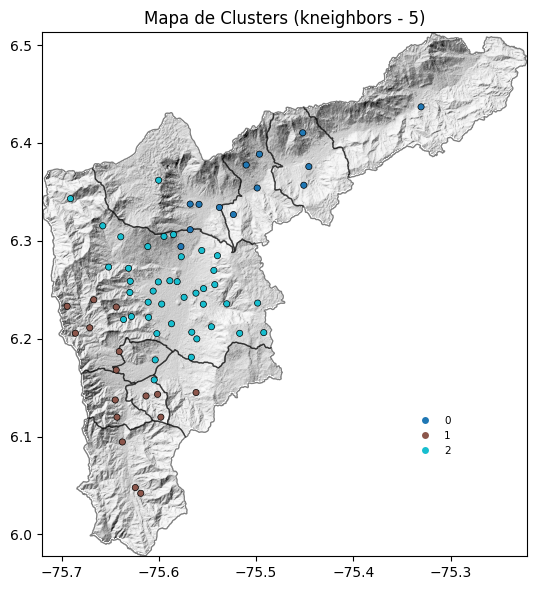

Generando mapa con 4 clusters


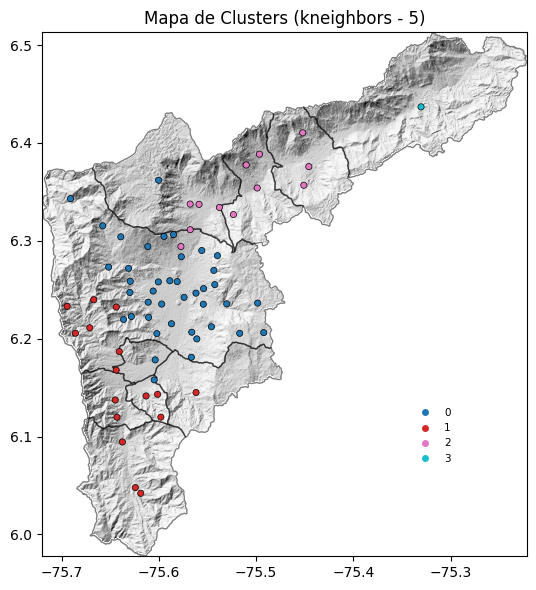

Generando mapa con 5 clusters


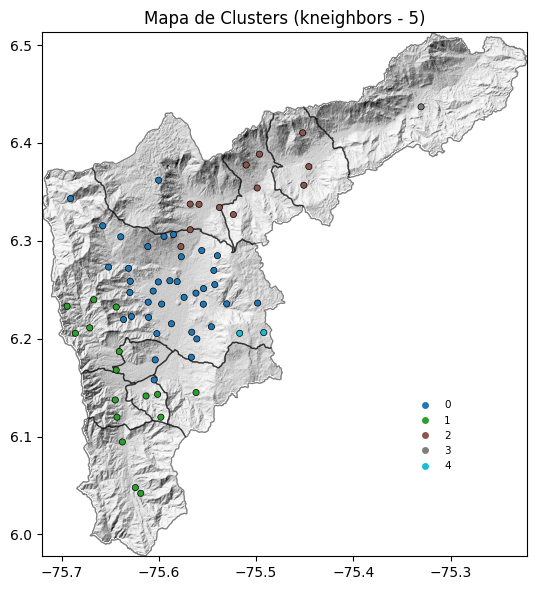

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt


from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")


# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(data, n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(data)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()



# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['Longitude'], row['Latitude']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]


# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

X_pca_reducido = X_pca[:, :3]



# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [3, 4, 5]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(X_pca_reducido, n_clusters=n, connectivity_method=method, param=param)






In [ ]:
# 1. Obtén la lista de archivos diarios
daily_files = sorted(glob(monthly_output + 'Monthly_Est_*.csv'))

# 2. Extrae el número de estación desde el nombre de archivo
stations_with_paths = [
    (int(os.path.basename(file).split('_')[-1].split('.')[0]), file) 
    for file in daily_files
]

# 3. Ordena la lista por número de estación
stations_with_paths_sorted = sorted(stations_with_paths, key=lambda x: x[0])

# 4. Filtra las estaciones de SIATA (excluyendo las últimas 16, que asumes son EPM)
siata_stations_with_paths = stations_with_paths_sorted[:-16]

# 5. Carga y renombra los datos de cada estación
data_frames = []
station_numbers = []

for station_number, file in siata_stations_with_paths:
    # Lee el archivo CSV usando 'Fecha' como índice de tipo datetime
    station_data = pd.read_csv(file, index_col='Fecha', parse_dates=True)

    # Intenta renombrar la columna de precipitación como 'Est_{station_number}'
    if 'P' in station_data.columns:
        station_data.rename(columns={'P': f'Est_{station_number}'}, inplace=True)
    else:
        # Si no existe la columna 'P', busca alguna columna que contenga 'P' en su nombre
        precip_column = [col for col in station_data.columns if 'P' in col.upper()]
        if precip_column:
            station_data.rename(
                columns={precip_column[0]: f'Est_{station_number}'}, 
                inplace=True
            )
        else:
            print(f"Advertencia: No se encontró columna de precipitación en {file}")
            continue

    data_frames.append(station_data)
    station_numbers.append(station_number)

# 6. Concatena todos los DataFrames, uniendo por índice (outer join)
all_stations_df = pd.concat(data_frames, axis=1, join='outer')


# Dejar estaciones con 10 o más años de datos
min_hours = 10 * 12  # ~87,600

# Filtra columnas (estaciones) que tengan al menos 'min_hours' datos válidos (no nulos)
all_stations_df_10y = all_stations_df.loc[:, all_stations_df.count() >= min_hours]

# Filtrar filas desde '2013-01-01' hasta el final de las series
all_stations_df_10y = all_stations_df_10y.loc['2013-01-01':]

# Mostrar la cantidad de datos faltantes por estación
missing_values = all_stations_df_10y.isna().sum()
total_days = len(all_stations_df_10y)
missing_percentage = (missing_values / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

def imputar_nan_mensual(df):
    """
    Rellena los valores NaN en un DataFrame de series temporales mensuales.
    
    Para cada mes (por ejemplo, enero, febrero, etc.), se reemplazan los valores faltantes 
    con el promedio de ese mes calculado a partir de los datos de los otros años.
    
    Args:
        df (pd.DataFrame): 
            DataFrame con índice de tipo fecha (mensual) y 
            columnas correspondientes a distintas series (por ejemplo, estaciones).
    
    Returns:
        pd.DataFrame: DataFrame con los NaN imputados.
    """
    df_imputado = df.copy()
    
    # Creamos una columna auxiliar que contiene el mes de cada fecha
    df_imputado['Mes'] = df_imputado.index.month
    
    # Calculamos la media para cada mes, aplicándola columna por columna en cada grupo
    medias_por_mes = df_imputado.groupby('Mes').transform('mean')
    
    # Rellenamos los NaN con la media calculada para cada mes
    df_imputado = df_imputado.fillna(medias_por_mes)
    
    # Eliminamos la columna auxiliar
    df_imputado.drop(columns=['Mes'], inplace=True)
    
    return df_imputado

all_stations_df_10y_imputed = imputar_nan_mensual(all_stations_df_10y)

missing_values_2 = all_stations_df_10y_imputed.isna().sum()
total_days = len(all_stations_df_10y_imputed)
missing_percentage = (missing_values_2 / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values_2,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)


all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)


Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  1            0.71
Est_2                  1            0.71
Est_3                  0            0.00
Est_4                  1            0.71
Est_5                  0            0.00
...                  ...             ...
Est_76                 6            4.29
Est_81                 5            3.57
Est_88                10            7.14
Est_89                10            7.14
Est_211                3            2.14

[70 rows x 2 columns]
Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  0             0.0
Est_2                  0             0.0
Est_3                  0             0.0
Est_4                  0             0.0
Est_5                  0             0.0
...                  ...             ...
Est_76                 0             0.0
Est_81                 0             0.0
Est_88          

#### Aplicamos PCA

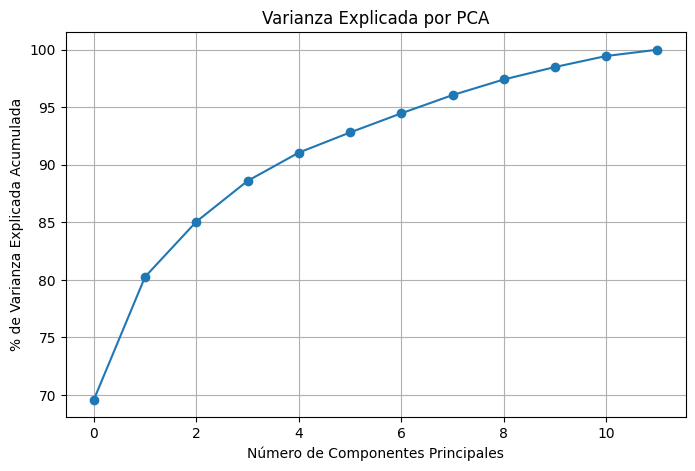

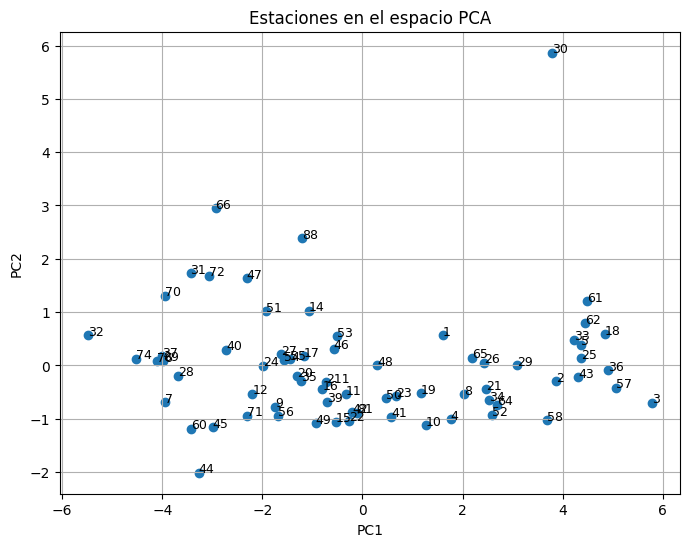

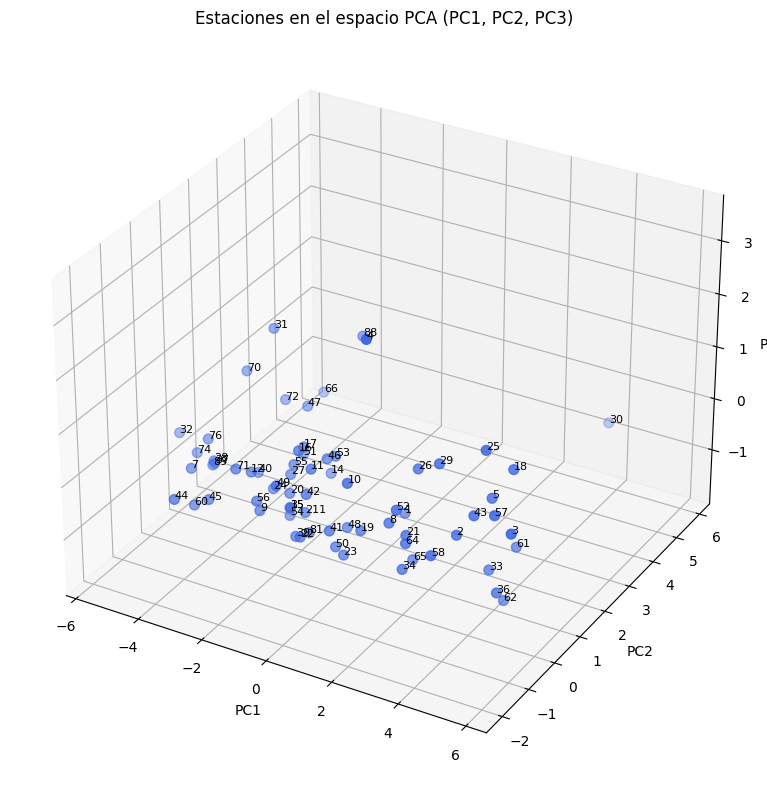

/tmp/ipykernel_44487/405604477.py:78: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


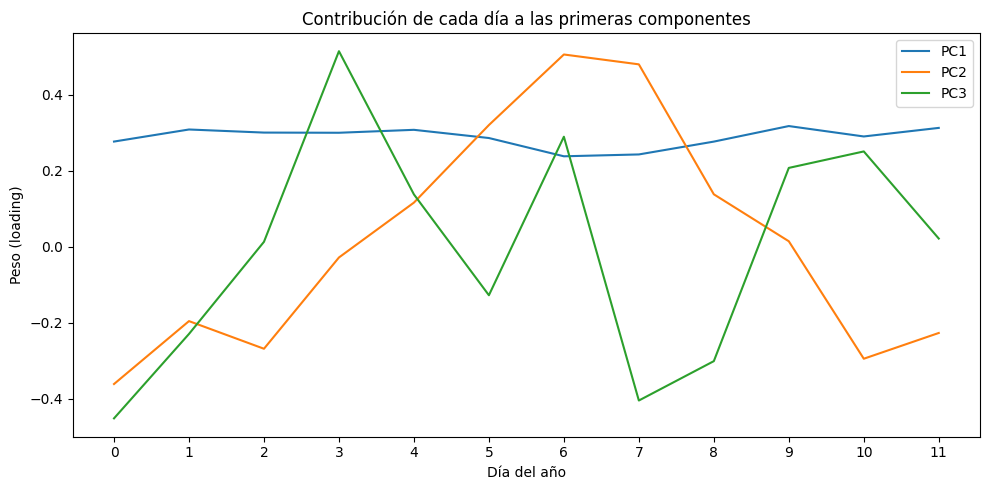

/tmp/ipykernel_44487/405604477.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))


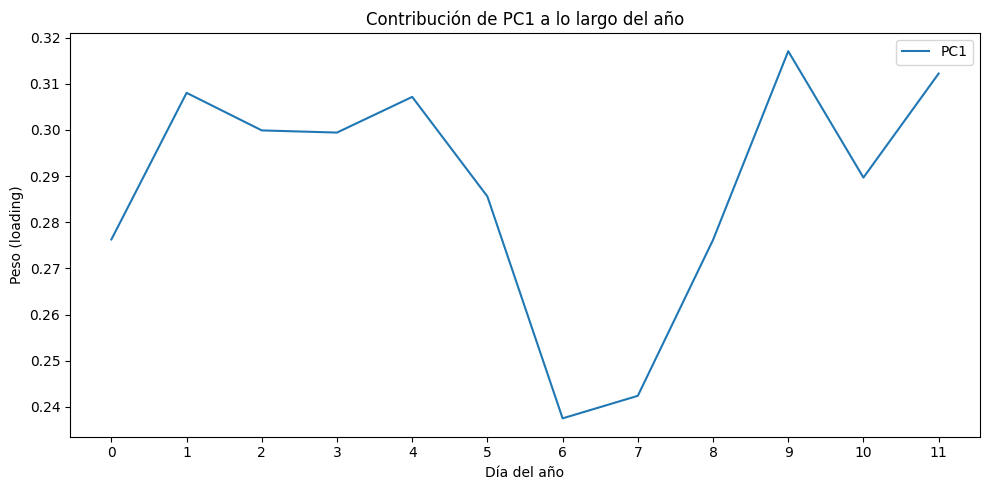

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt

# 1. Extraer patrón medio por hora del día
montly_pattern_df = all_stations_df_10y_imputed.copy()
montly_pattern_df['month'] = montly_pattern_df.index.month
montly_means = montly_pattern_df.groupby('month').mean()  # 24 filas x N columnas

# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)

# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

# 5. Varianza explicada
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_)*100, marker='o')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('% de Varianza Explicada Acumulada')
plt.title('Varianza Explicada por PCA')
plt.grid(True)
plt.show()

# 6. Visualizar primeras 2 componentes
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1])
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=9)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Estaciones en el espacio PCA')
plt.grid(True)
plt.show()

# Gráfico 3D de las tres primeras componentes
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Coordenadas en el espacio PCA
x = X_pca[:, 0]  # PC1
y = X_pca[:, 1]  # PC2
z = X_pca[:, 2]  # PC3

# Graficar puntos
ax.scatter(x, y, z, c='royalblue', s=50)

# Añadir etiquetas a cada punto (nombre de estación)
for i, est in enumerate(X.index):
    ax.text(x[i], y[i], z[i], str(est), size=8)

# Etiquetas de ejes
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('Estaciones en el espacio PCA (PC1, PC2, PC3)')

plt.tight_layout()
plt.show()


#----------------------------------------------------------------------------
# ------------------- Constribución de días a las primeras componentes ------------
#----------------------------------------------------------------------------
from matplotlib.ticker import MultipleLocator

# Ejemplo para las tres primeras componentes:
fig, ax = plt.subplots(figsize=(10, 5))
for i in range(3):
    ax.plot(np.arange(12), pca.components_[i], label=f'PC{i+1}')

# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(1))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
ax.set_ylabel('Peso (loading)')
ax.set_title('Contribución de cada día a las primeras componentes')
ax.legend()
plt.tight_layout()
plt.show()


# Si sólo quieres la primera componente:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(np.arange(12), pca.components_[0], label='PC1')

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.set_xticklabels(ax.get_xticks().astype(int))

ax.set_xlabel('Día del año')
ax.set_ylabel('Peso (loading)')
ax.set_title('Contribución de PC1 a lo largo del año')
ax.legend()
plt.tight_layout()
plt.show()


#### **Con KMEANS**

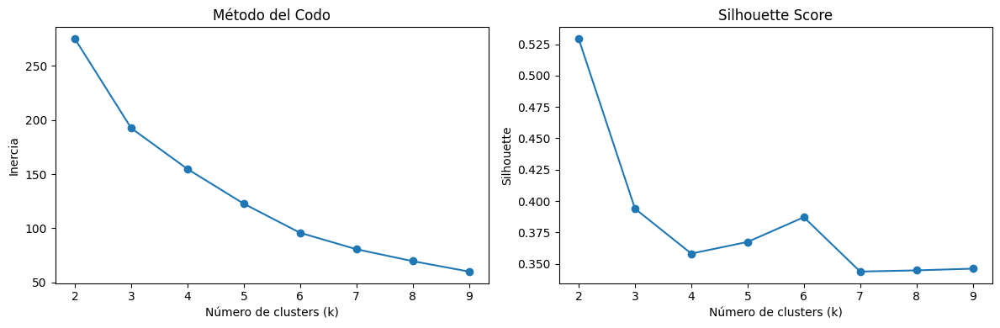

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertias = []
silhouettes = []

k_range = range(2, 10)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca[:, :3])  # Solo usamos PC1 y PC2
    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X_pca[:, :3], kmeans.labels_))

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia")

plt.subplot(1, 2, 2)
plt.plot(k_range, silhouettes, marker='o')
plt.title("Silhouette Score")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette")

plt.tight_layout()
plt.show()


#### **Con Clustering Jerarquico**

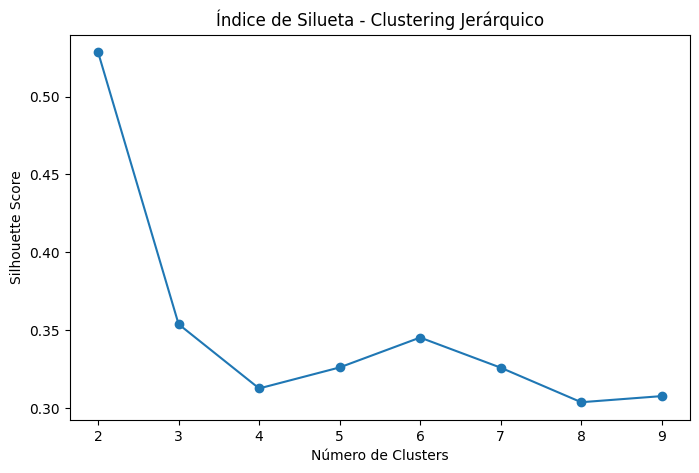

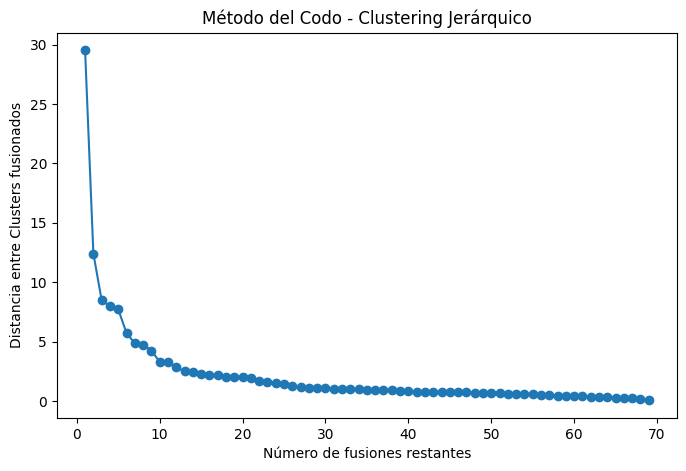

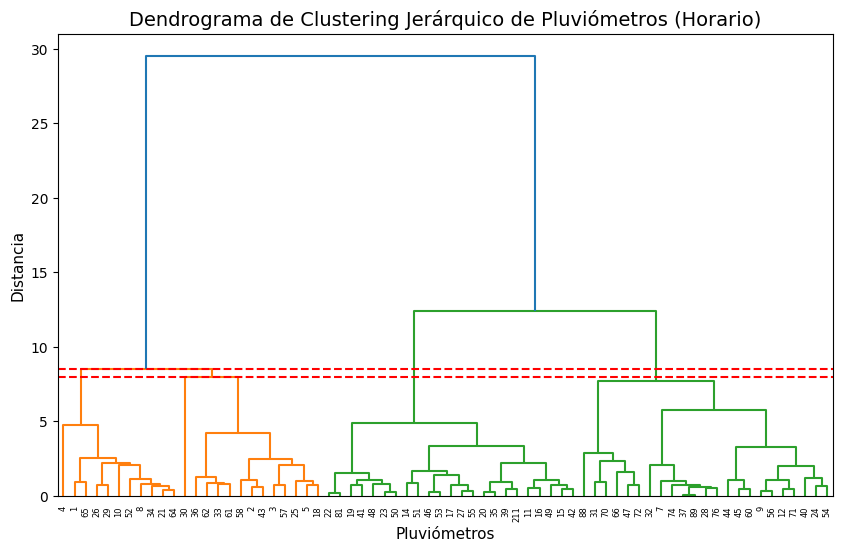

In [ ]:
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# 1. Matriz PCA reducida (usamos 3 componentes)
X_pca_reducido = X_pca[:, :3]

# 2. Calcular la matriz de linkage (clustering jerárquico)
Z = linkage(X_pca_reducido, method='ward', metric='euclidean')

# 3. Evaluar silhouette para distintos números de clusters
silhouettes_hier = []
k_range = range(2, 10)

for k in k_range:
    labels = fcluster(Z, k, criterion='maxclust')  # Corta el dendrograma en k clusters
    score = silhouette_score(X_pca_reducido, labels)
    silhouettes_hier.append(score)

# 4. Graficar silhouette
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouettes_hier, marker='o')
plt.title('Índice de Silueta - Clustering Jerárquico')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()

from scipy.cluster.hierarchy import linkage
import matplotlib.pyplot as plt

# Aplicamos linkage sobre PC1, PC2, PC3
Z = linkage(X_pca[:, :3], method='ward')

# Extraemos las distancias de fusión (columna 2 de Z)
distancias = Z[:, 2]

# Creamos el método del codo: graficar las últimas distancias
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(distancias)+1), distancias[::-1], marker='o')
plt.title('Método del Codo - Clustering Jerárquico')
plt.xlabel('Número de fusiones restantes')
plt.ylabel('Distancia entre Clusters fusionados')
plt.show()


plt.figure(figsize=(10, 6))
dendrogram = sch.dendrogram(
    Z,
    labels=all_stations_df_10y_imputed.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

from scipy.cluster.hierarchy import cut_tree

# Línea para cortar en k clusters (por ejemplo, k = 4)
plt.axhline(y=Z[-(5 - 1), 2], c='red', ls='--')
# Línea para cortar en k clusters (por ejemplo, k = 4)
plt.axhline(y=Z[-(4 - 1), 2], c='red', ls='--')

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Horario)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)
plt.show()




/tmp/ipykernel_44487/3835281977.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


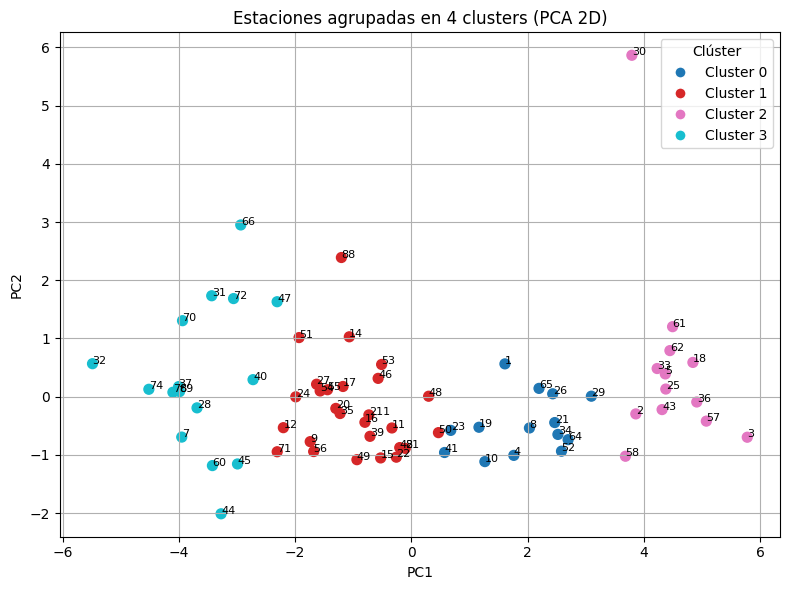

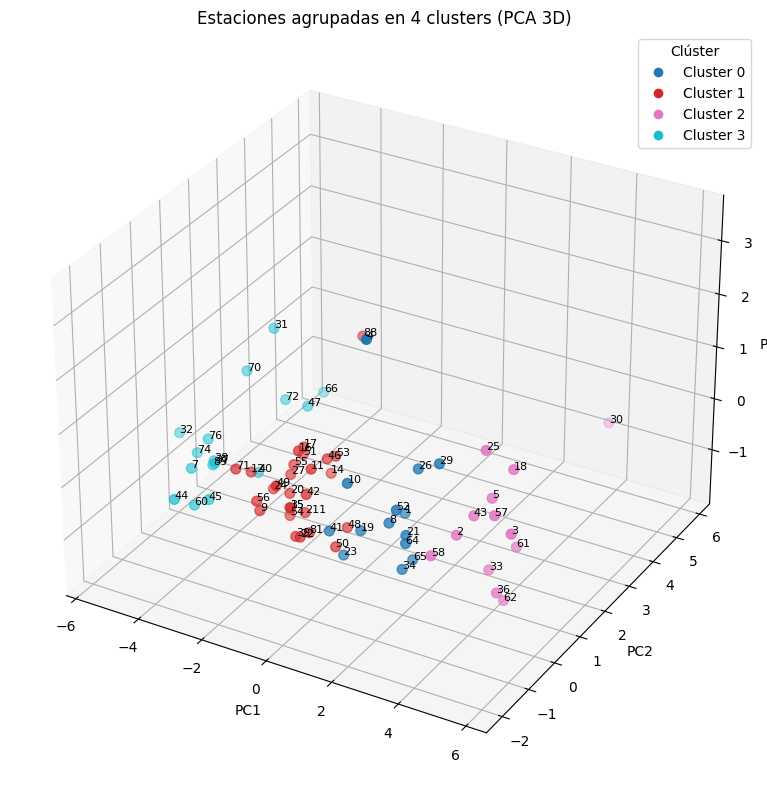

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 4
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/2783672948.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


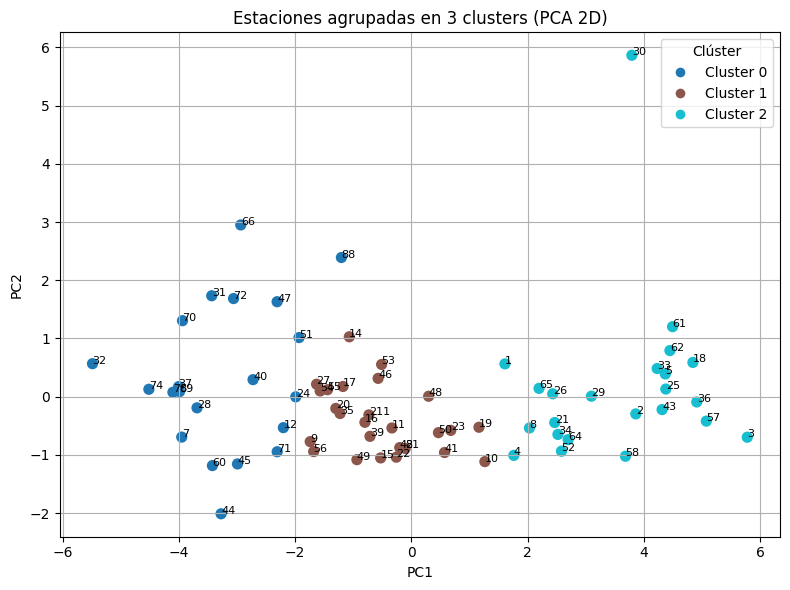

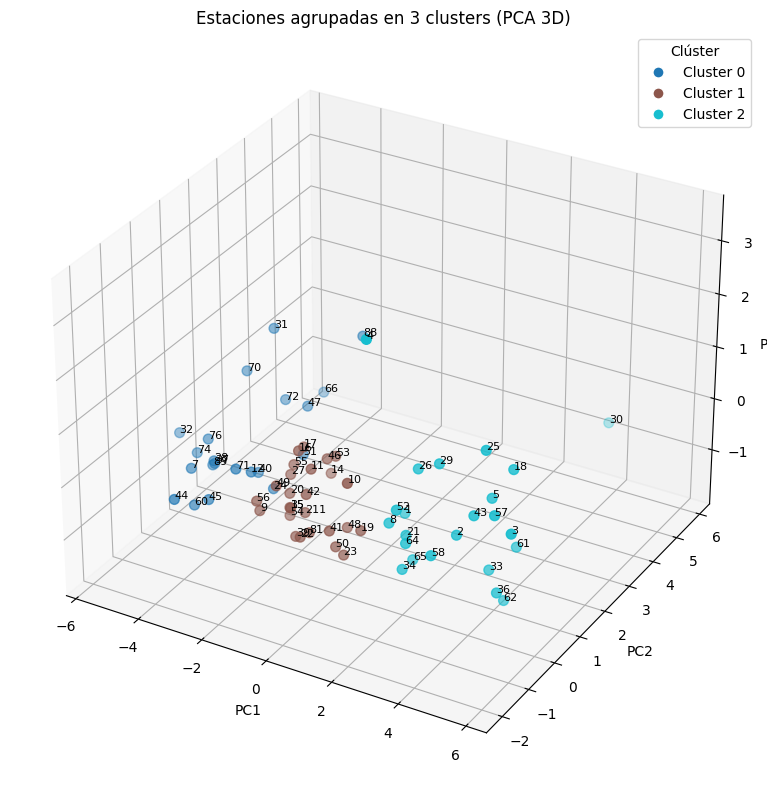

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 3
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/1363418585.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


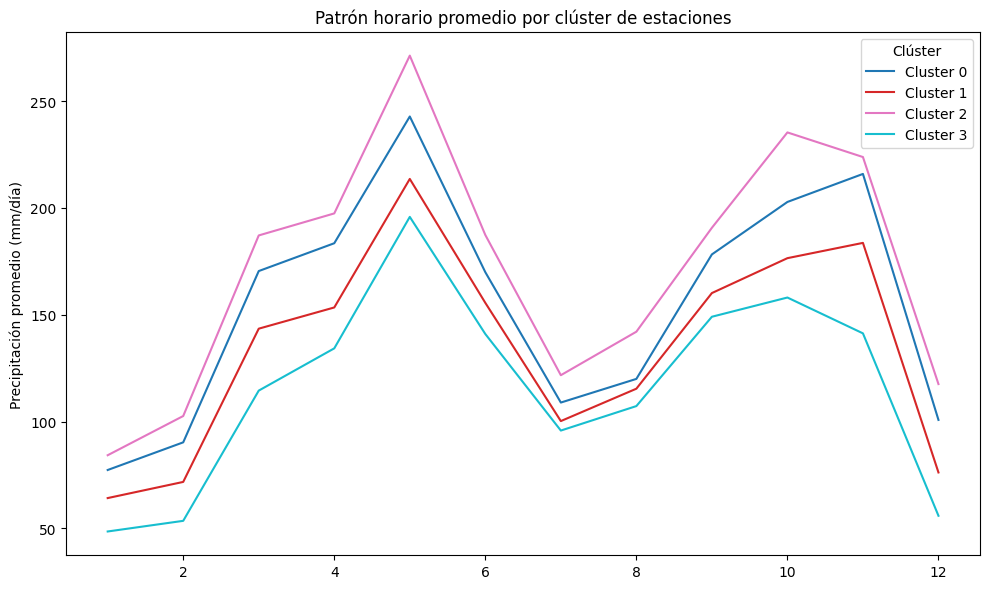

In [ ]:

# # matriz 24h x estaciones
df_horas = montly_means

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
plt.ylabel("Precipitación promedio (mm/día)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/1363418585.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


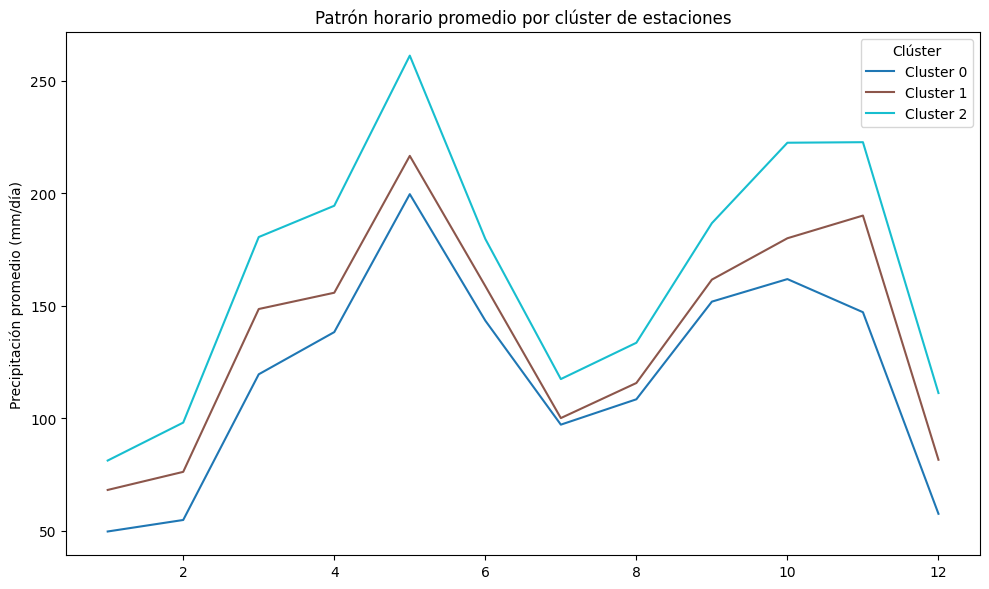

In [ ]:

# # matriz 24h x estaciones
df_horas = montly_means

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
plt.ylabel("Precipitación promedio (mm/día)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

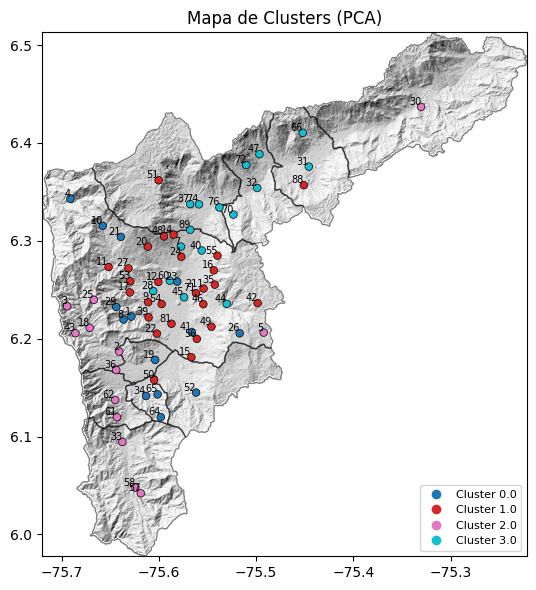

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()



# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


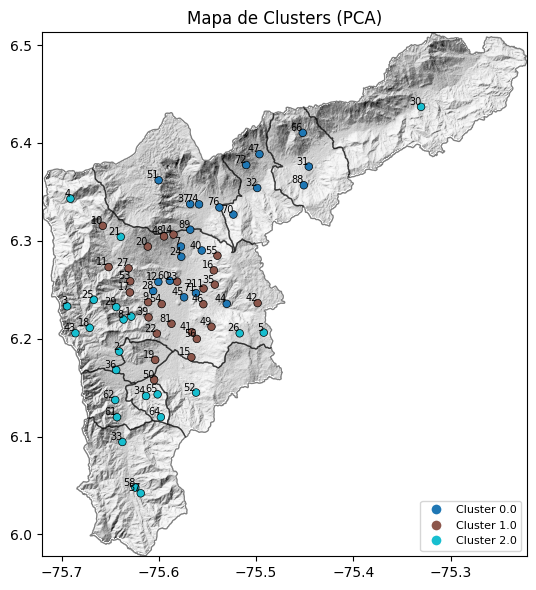

In [ ]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()



# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


Patron_Lluvia
Otro                   31
Temporada JJA          20
Temporada FMA y SON    19
Name: count, dtype: int64


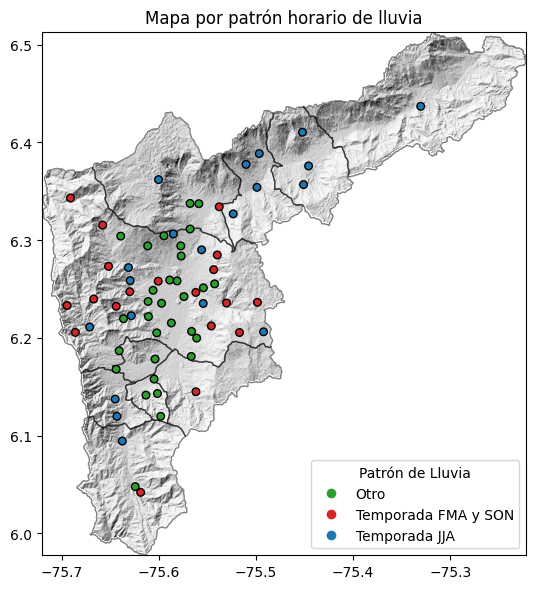

In [ ]:
df_pca_scores = pd.DataFrame({
    'Estacion': X.index.astype(int),  # si usaste los códigos como índice
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'PC3': X_pca[:, 2],
})

# Regla: si PC2 > 0.2 → lluvia en la tarde / PC2 < 0 y PC3 > 0.1 → lluvia en madrugada/noche
df_pca_scores['Patron_Lluvia'] = df_pca_scores.apply(
    lambda row: 
        'Temporada JJA' if row['PC2'] > 0.2 
      else ('Temporada FMA y SON' if (row['PC2'] < 0.2 and row['PC3'] > 0) else 'Otro'),
    axis=1
)

# df_pca_scores['Patron_Lluvia'] = df_pca_scores['PC2'].apply(
#     lambda x: 'Tarde' if x > 0.2 else 'Madrugada-Noche'
# )


# Ver cuántas hay por tipo
print(df_pca_scores['Patron_Lluvia'].value_counts())

# Ver algunas estaciones de cada tipo
df_tarde = df_pca_scores[df_pca_scores['Patron_Lluvia'] == 'Temporada JJA']
df_noche = df_pca_scores[df_pca_scores['Patron_Lluvia'] == 'Temporada FMA y SON']

# Exportar
df_pca_scores.to_csv('estaciones_patron_lluvia.csv', index=False)


n_estaciones = len(df_pca_scores)

# Simular clasificación por patrón de lluvia
patterns = ['Temporada JJA' if i % 2 == 0 else 'Temporada FMA y SON' for i in range(n_estaciones)]

pluvios_shp_c['Patron_Lluvia'] = pluvios_shp_c.index.map(df_pca_scores.set_index('Estacion')['Patron_Lluvia'])

color_dict = {
    'Temporada JJA': '#1f77b4',            # Azul
    'Temporada FMA y SON': '#d62728',   # Rojo
    'Otro': '#2ca02c'              # Verde
}

# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_patron'] = pluvios_shp_c['Patron_Lluvia'].map(color_dict)

pluvios_shp_patron = pluvios_shp_c.dropna(subset=['Patron_Lluvia'])

# Función para graficar el mapa
def plot_patron_lluvia_map(geodf, col_patron='Patron_Lluvia', col_color='color_patron', title="Mapa por patrón horario de lluvia"):
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    
    # Graficar puntos de estaciones
    geodf.plot(ax=ax, c=geodf[col_color], edgecolor='k', markersize=30)

    # Crear leyenda manual
    legend_elements = []
    for patron in sorted(geodf[col_patron].unique()):
        color = geodf.loc[geodf[col_patron] == patron, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=patron,
                                      markerfacecolor=color, markersize=8))
    ax.legend(handles=legend_elements, loc='lower right', title="Patrón de Lluvia")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Mostrar el mapa
plot_patron_lluvia_map(pluvios_shp_patron)



#### **PCA con Matriz de Vecindad Y Clustering Jearquico**

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 3 clusters


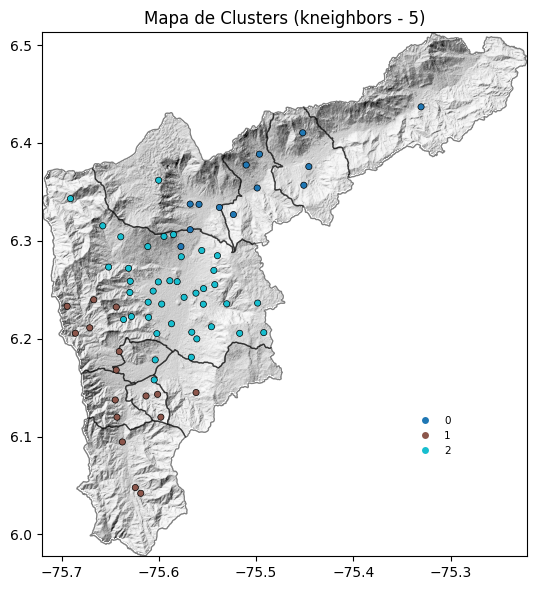

Generando mapa con 4 clusters


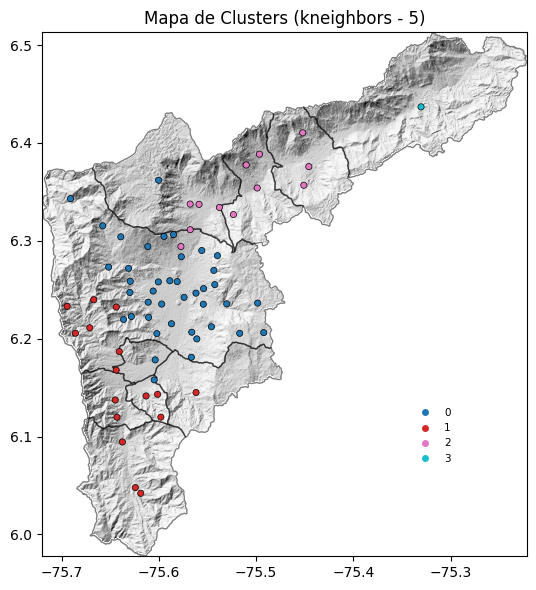

Generando mapa con 5 clusters


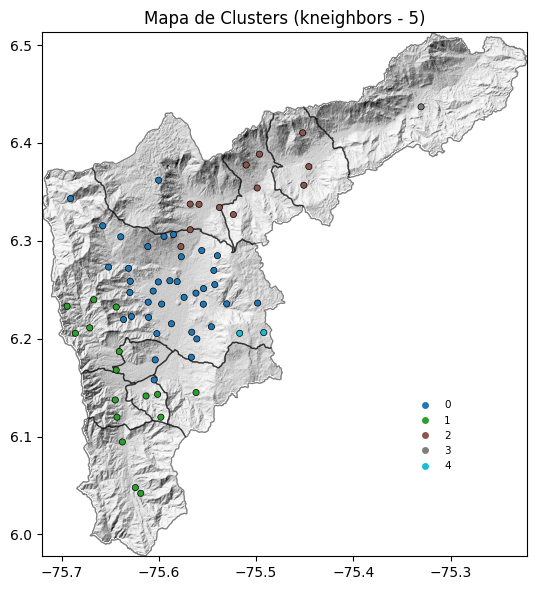

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt


from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")


# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(data, n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(data)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()



# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['Longitude'], row['Latitude']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]


# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

X_pca_reducido = X_pca[:, :3]



# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [3, 4, 5]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(X_pca_reducido, n_clusters=n, connectivity_method=method, param=param)






In [25]:
from glob import glob
import pandas as pd
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score

from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

from sklearn.cluster import KMeans, AgglomerativeClustering
import scipy.cluster.hierarchy as sch

from scipy.spatial.distance import cdist

import numpy as np
import math

import rasterio as rio
import geopandas as gpd
from rasterio.plot import show
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from scipy.cluster.hierarchy import fcluster

hourly_input = '../../DATA/rainfall/hourly_gauges_SIATA_EPM/'
daily_output = '../../DATA/rainfall/daily_gauges_SIATA_EPM/'
monthly_output = '../../DATA/rainfall/monthly_gauges_SIATA_EPM/'
annual_output = '../../DATA/rainfall/annual_gauges_SIATA_EPM/'
path_ENSO = '../../DATA/rainfall/ENSO/'
path_inventory = '../../DATA/landslides/'
output_figures = '../../FIGURES/temporal_analysis/'


# 📌 Definir rutas de archivos
main = '/run/media/oisanchezp/datos/MAESTRIA/Maestria_Daissy/DEM-20240409T233930Z-001/DEM/'
ruta_amva = '/home/oisanchezp/Geotecnia/shape_files/'
ruta_coor = '/home/oisanchezp/Geotecnia/shape_files/Est_All/'


# 📌 Cargar datos espaciales
hill_src = rio.open(main + "DEM_west_Hillshade_Clip_r.tif")
hill = hill_src.read(1)
hill = np.where(hill == hill[0, 0], np.nan, hill)

AMVA = gpd.read_file(f"{ruta_amva}mpios_amva_qnk.shp")
pluvios_shp = gpd.read_file(ruta_coor + "Est_All.shp")

In [26]:
# 1. Obtén la lista de archivos diarios
daily_files = sorted(glob(monthly_output + 'Monthly_Est_*.csv'))

# 2. Extrae el número de estación desde el nombre de archivo
stations_with_paths = [
    (int(os.path.basename(file).split('_')[-1].split('.')[0]), file) 
    for file in daily_files
]

# 3. Ordena la lista por número de estación
stations_with_paths_sorted = sorted(stations_with_paths, key=lambda x: x[0])

# 4. Filtra las estaciones de SIATA (excluyendo las últimas 16, que asumes son EPM)
siata_stations_with_paths = stations_with_paths_sorted[:-16]

# 5. Carga y renombra los datos de cada estación
data_frames = []
station_numbers = []

for station_number, file in siata_stations_with_paths:
    # Lee el archivo CSV usando 'Fecha' como índice de tipo datetime
    station_data = pd.read_csv(file, index_col='Fecha', parse_dates=True)

    # Intenta renombrar la columna de precipitación como 'Est_{station_number}'
    if 'P' in station_data.columns:
        station_data.rename(columns={'P': f'Est_{station_number}'}, inplace=True)
    else:
        # Si no existe la columna 'P', busca alguna columna que contenga 'P' en su nombre
        precip_column = [col for col in station_data.columns if 'P' in col.upper()]
        if precip_column:
            station_data.rename(
                columns={precip_column[0]: f'Est_{station_number}'}, 
                inplace=True
            )
        else:
            print(f"Advertencia: No se encontró columna de precipitación en {file}")
            continue

    data_frames.append(station_data)
    station_numbers.append(station_number)

# 6. Concatena todos los DataFrames, uniendo por índice (outer join)
all_stations_df = pd.concat(data_frames, axis=1, join='outer')


# Dejar estaciones con 10 o más años de datos
min_hours = 10 * 12  # ~87,600

# Filtra columnas (estaciones) que tengan al menos 'min_hours' datos válidos (no nulos)
all_stations_df_10y = all_stations_df.loc[:, all_stations_df.count() >= min_hours]

# Filtrar filas desde '2013-01-01' hasta el final de las series
all_stations_df_10y = all_stations_df_10y.loc['2013-01-01':]

# Mostrar la cantidad de datos faltantes por estación
missing_values = all_stations_df_10y.isna().sum()
total_days = len(all_stations_df_10y)
missing_percentage = (missing_values / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)

def imputar_nan_mensual(df):
    """
    Rellena los valores NaN en un DataFrame de series temporales mensuales.
    
    Para cada mes (por ejemplo, enero, febrero, etc.), se reemplazan los valores faltantes 
    con el promedio de ese mes calculado a partir de los datos de los otros años.
    
    Args:
        df (pd.DataFrame): 
            DataFrame con índice de tipo fecha (mensual) y 
            columnas correspondientes a distintas series (por ejemplo, estaciones).
    
    Returns:
        pd.DataFrame: DataFrame con los NaN imputados.
    """
    df_imputado = df.copy()
    
    # Creamos una columna auxiliar que contiene el mes de cada fecha
    df_imputado['Mes'] = df_imputado.index.month
    
    # Calculamos la media para cada mes, aplicándola columna por columna en cada grupo
    medias_por_mes = df_imputado.groupby('Mes').transform('mean')
    
    # Rellenamos los NaN con la media calculada para cada mes
    df_imputado = df_imputado.fillna(medias_por_mes)
    
    # Eliminamos la columna auxiliar
    df_imputado.drop(columns=['Mes'], inplace=True)
    
    return df_imputado

all_stations_df_10y_imputed = imputar_nan_mensual(all_stations_df_10y)

missing_values_2 = all_stations_df_10y_imputed.isna().sum()
total_days = len(all_stations_df_10y_imputed)
missing_percentage = (missing_values_2 / total_days) * 100


print("Porcentaje de datos faltantes (NaN) por estación:")
# 1. Creamos el DataFrame con ambas series
df_missing = pd.DataFrame({
    'Datos_faltantes': missing_values_2,
    'Porcentaje_NaN': missing_percentage
})

# 2. Redondear el porcentaje a 2 decimales
df_missing['Porcentaje_NaN'] = df_missing['Porcentaje_NaN'].round(2)

# 3. Mostrar el resultado
print(df_missing)


all_stations_df_10y_imputed.columns = (
    all_stations_df_10y_imputed.columns
    .str.replace("Est_", "")
    .astype(int)
)


Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  1            0.71
Est_2                  1            0.71
Est_3                  0            0.00
Est_4                  1            0.71
Est_5                  0            0.00
...                  ...             ...
Est_76                 6            4.29
Est_81                 5            3.57
Est_88                10            7.14
Est_89                10            7.14
Est_211                3            2.14

[70 rows x 2 columns]
Porcentaje de datos faltantes (NaN) por estación:
         Datos_faltantes  Porcentaje_NaN
Est_1                  0             0.0
Est_2                  0             0.0
Est_3                  0             0.0
Est_4                  0             0.0
Est_5                  0             0.0
...                  ...             ...
Est_76                 0             0.0
Est_81                 0             0.0
Est_88          

#### Aplicamos PCA

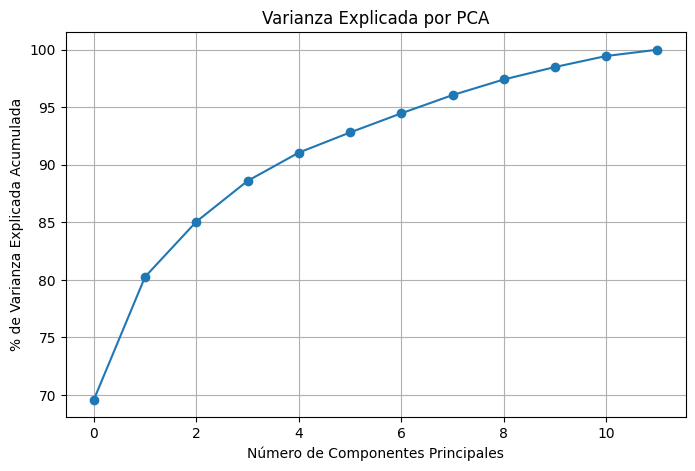

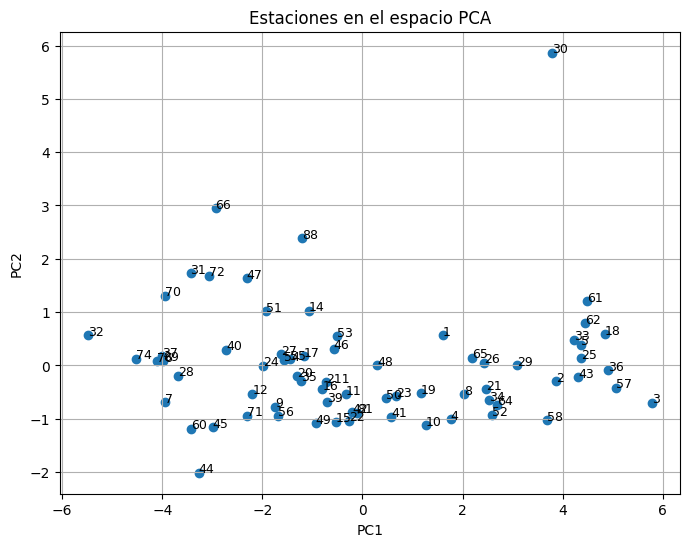

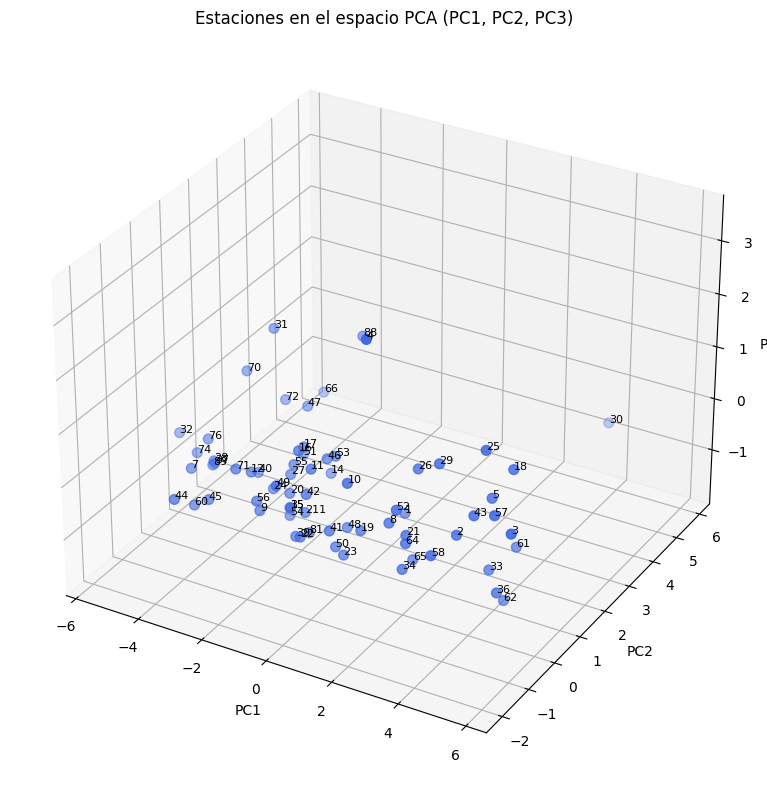

/tmp/ipykernel_44487/405604477.py:78: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


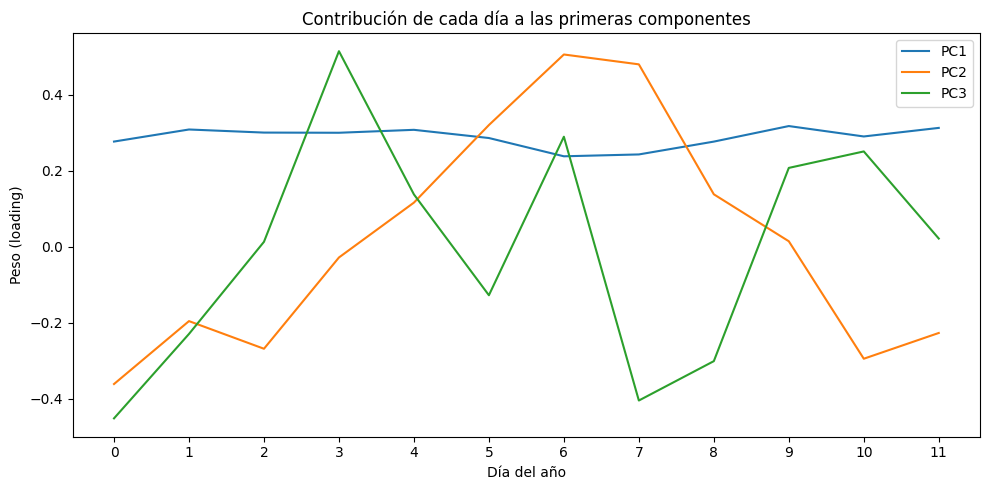

/tmp/ipykernel_44487/405604477.py:93: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))


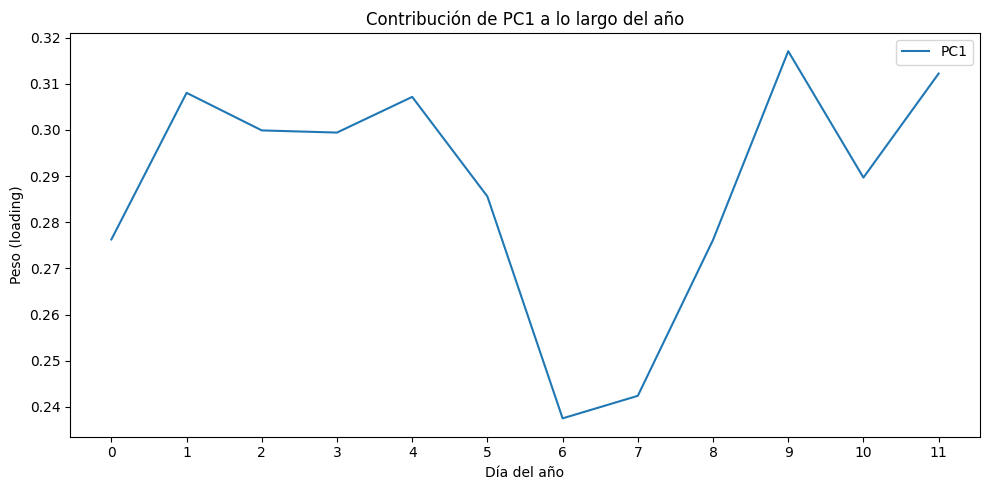

In [32]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt

# 1. Extraer patrón medio por hora del día
montly_pattern_df = all_stations_df_10y_imputed.copy()
montly_pattern_df['month'] = montly_pattern_df.index.month
montly_means = montly_pattern_df.groupby('month').mean()  # 24 filas x N columnas

# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)

# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

# 5. Varianza explicada
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_)*100, marker='o')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('% de Varianza Explicada Acumulada')
plt.title('Varianza Explicada por PCA')
plt.grid(True)
plt.show()

# 6. Visualizar primeras 2 componentes
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1])
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=9)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Estaciones en el espacio PCA')
plt.grid(True)
plt.show()

# Gráfico 3D de las tres primeras componentes
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Coordenadas en el espacio PCA
x = X_pca[:, 0]  # PC1
y = X_pca[:, 1]  # PC2
z = X_pca[:, 2]  # PC3

# Graficar puntos
ax.scatter(x, y, z, c='royalblue', s=50)

# Añadir etiquetas a cada punto (nombre de estación)
for i, est in enumerate(X.index):
    ax.text(x[i], y[i], z[i], str(est), size=8)

# Etiquetas de ejes
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('Estaciones en el espacio PCA (PC1, PC2, PC3)')

plt.tight_layout()
plt.show()


#----------------------------------------------------------------------------
# ------------------- Constribución de días a las primeras componentes ------------
#----------------------------------------------------------------------------
from matplotlib.ticker import MultipleLocator

# Ejemplo para las tres primeras componentes:
fig, ax = plt.subplots(figsize=(10, 5))
for i in range(3):
    ax.plot(np.arange(12), pca.components_[i], label=f'PC{i+1}')

# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(1))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
ax.set_ylabel('Peso (loading)')
ax.set_title('Contribución de cada día a las primeras componentes')
ax.legend()
plt.tight_layout()
plt.show()


# Si sólo quieres la primera componente:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(np.arange(12), pca.components_[0], label='PC1')

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.set_xticklabels(ax.get_xticks().astype(int))

ax.set_xlabel('Día del año')
ax.set_ylabel('Peso (loading)')
ax.set_title('Contribución de PC1 a lo largo del año')
ax.legend()
plt.tight_layout()
plt.show()


#### **Con KMEANS**

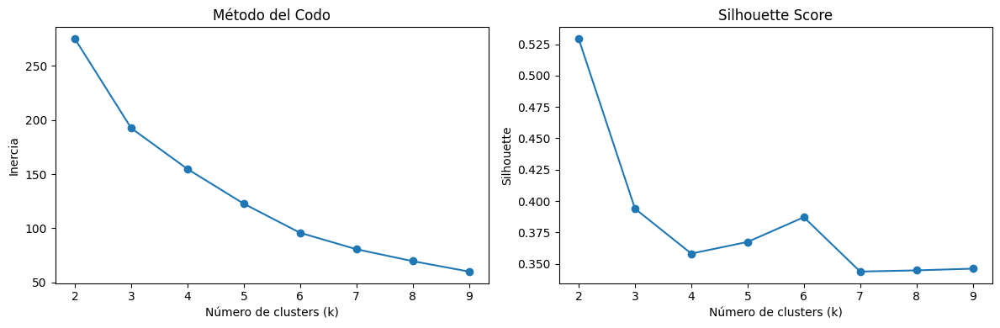

In [33]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertias = []
silhouettes = []

k_range = range(2, 10)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca[:, :3])  # Solo usamos PC1 y PC2
    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X_pca[:, :3], kmeans.labels_))

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia")

plt.subplot(1, 2, 2)
plt.plot(k_range, silhouettes, marker='o')
plt.title("Silhouette Score")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette")

plt.tight_layout()
plt.show()


#### **Con Clustering Jerarquico**

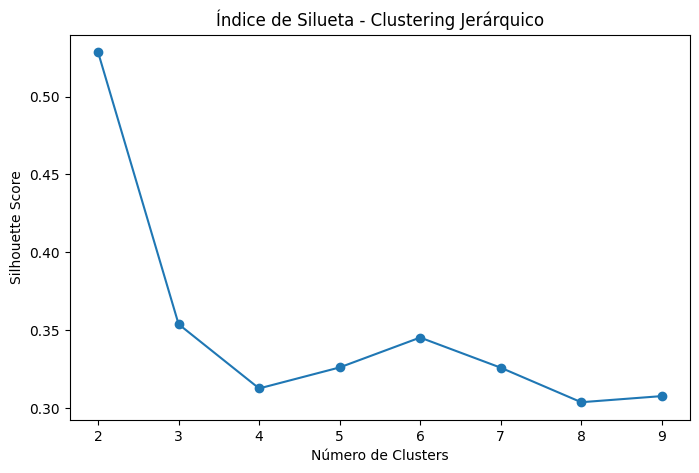

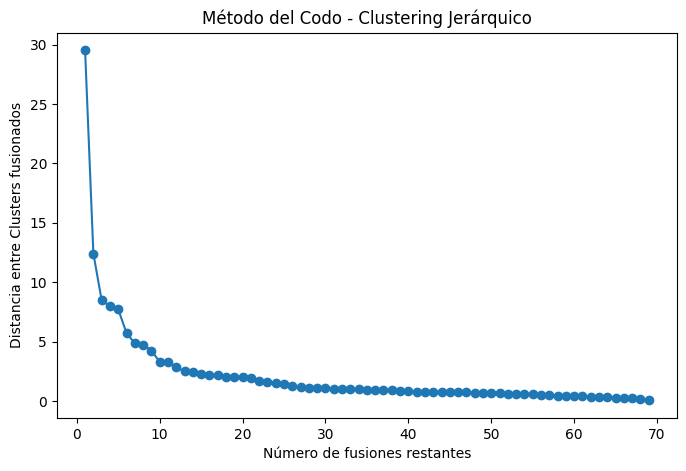

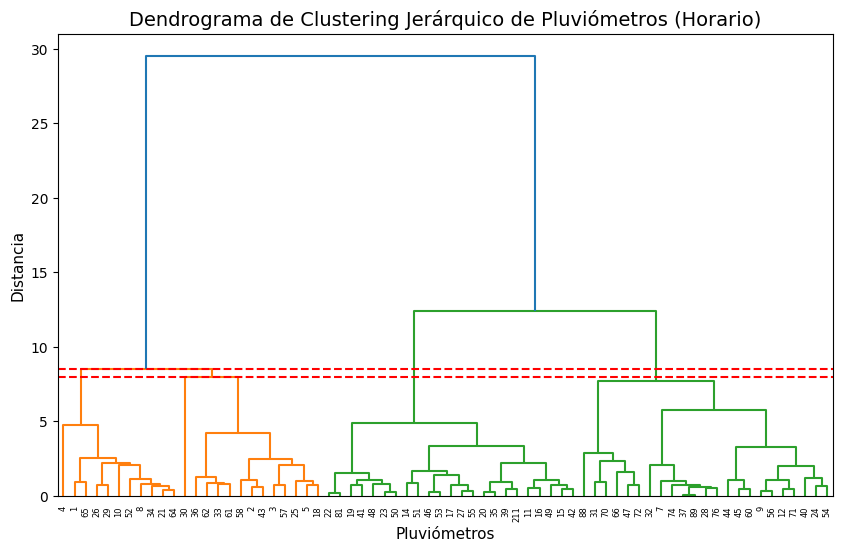

In [34]:
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# 1. Matriz PCA reducida (usamos 3 componentes)
X_pca_reducido = X_pca[:, :3]

# 2. Calcular la matriz de linkage (clustering jerárquico)
Z = linkage(X_pca_reducido, method='ward', metric='euclidean')

# 3. Evaluar silhouette para distintos números de clusters
silhouettes_hier = []
k_range = range(2, 10)

for k in k_range:
    labels = fcluster(Z, k, criterion='maxclust')  # Corta el dendrograma en k clusters
    score = silhouette_score(X_pca_reducido, labels)
    silhouettes_hier.append(score)

# 4. Graficar silhouette
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouettes_hier, marker='o')
plt.title('Índice de Silueta - Clustering Jerárquico')
plt.xlabel('Número de Clusters')
plt.ylabel('Silhouette Score')
plt.show()

from scipy.cluster.hierarchy import linkage
import matplotlib.pyplot as plt

# Aplicamos linkage sobre PC1, PC2, PC3
Z = linkage(X_pca[:, :3], method='ward')

# Extraemos las distancias de fusión (columna 2 de Z)
distancias = Z[:, 2]

# Creamos el método del codo: graficar las últimas distancias
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(distancias)+1), distancias[::-1], marker='o')
plt.title('Método del Codo - Clustering Jerárquico')
plt.xlabel('Número de fusiones restantes')
plt.ylabel('Distancia entre Clusters fusionados')
plt.show()


plt.figure(figsize=(10, 6))
dendrogram = sch.dendrogram(
    Z,
    labels=all_stations_df_10y_imputed.columns,
    leaf_rotation=90, 
    leaf_font_size=6
)

from scipy.cluster.hierarchy import cut_tree

# Línea para cortar en k clusters (por ejemplo, k = 4)
plt.axhline(y=Z[-(5 - 1), 2], c='red', ls='--')
# Línea para cortar en k clusters (por ejemplo, k = 4)
plt.axhline(y=Z[-(4 - 1), 2], c='red', ls='--')

plt.title("Dendrograma de Clustering Jerárquico de Pluviómetros (Horario)", fontsize=14)
plt.xlabel("Pluviómetros", fontsize=11)
plt.ylabel("Distancia", fontsize=11)
plt.show()




/tmp/ipykernel_44487/3835281977.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


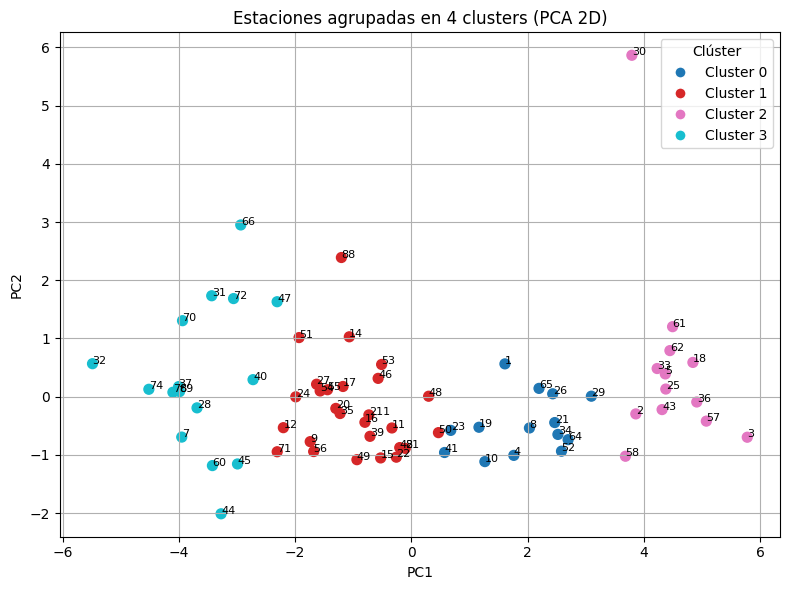

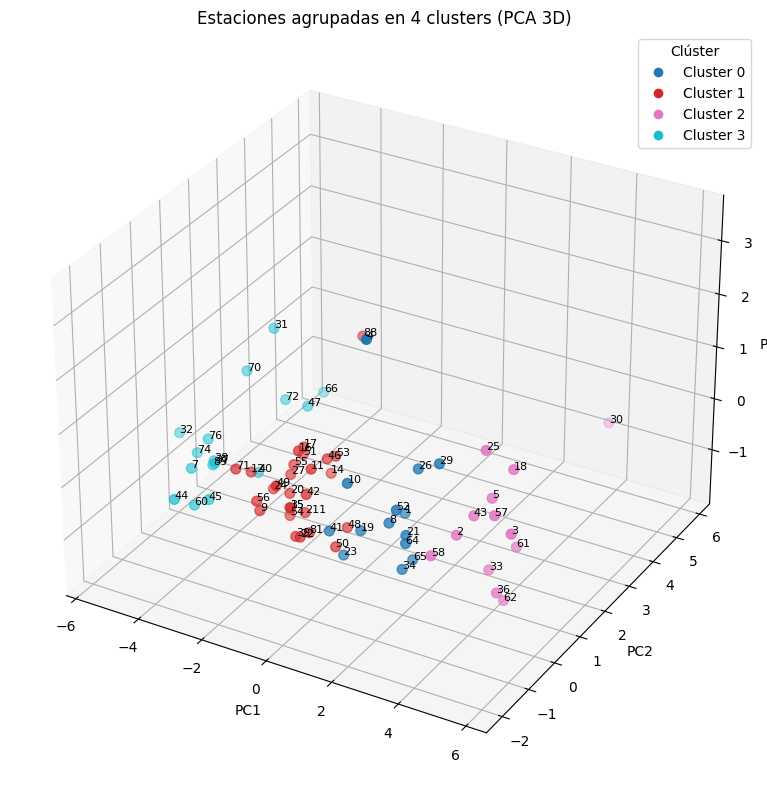

In [35]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 4
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/2783672948.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('tab10', k_optimo)


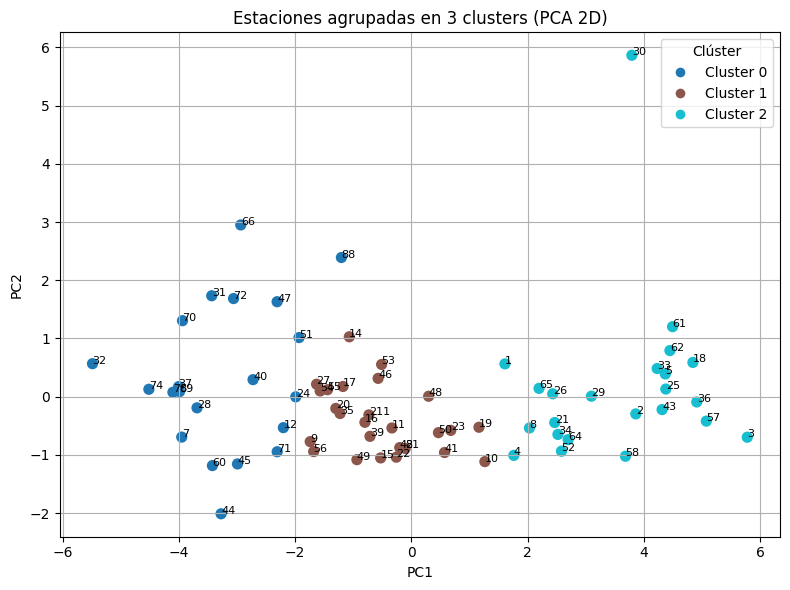

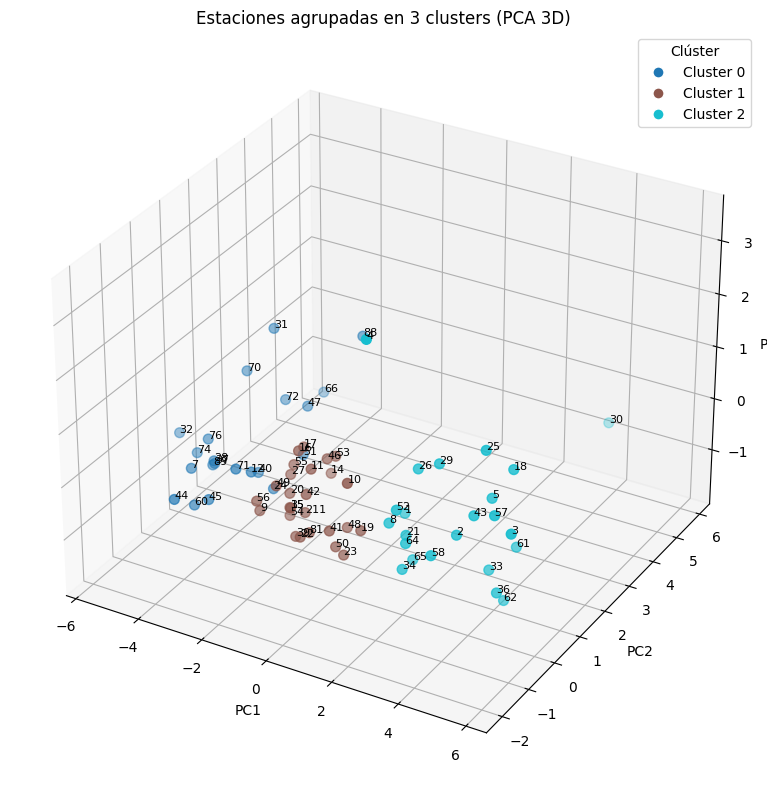

In [39]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans


k_optimo = 3
kmeans = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_pca[:, :3])  # usa 3 componentes para mejor separación

# Paleta de colores fija
palette = cm.get_cmap('tab10', k_optimo)
cluster_color_dict = {i: mcolors.to_hex(palette(i)) for i in range(k_optimo)}

# Asigna color a cada estación según su clúster
colors = [cluster_color_dict[c] for c in clusters]



plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=50)

# Etiquetas de estaciones
for i, est in enumerate(X.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(est), fontsize=8)

# Leyenda
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'Cluster {i}',
           markerfacecolor=cluster_color_dict[i], markersize=8)
    for i in sorted(cluster_color_dict.keys())
]
plt.legend(handles=legend_elements, title="Clúster")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 2D)")
plt.grid(True)
plt.tight_layout()
plt.show()


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, s=50)

for i, est in enumerate(X.index):
    ax.text(X_pca[i, 0], X_pca[i, 1], X_pca[i, 2], str(est), size=8)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"Estaciones agrupadas en {k_optimo} clusters (PCA 3D)")

# Leyenda igual que en 2D
ax.legend(handles=legend_elements, title="Clúster")

plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/1363418585.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


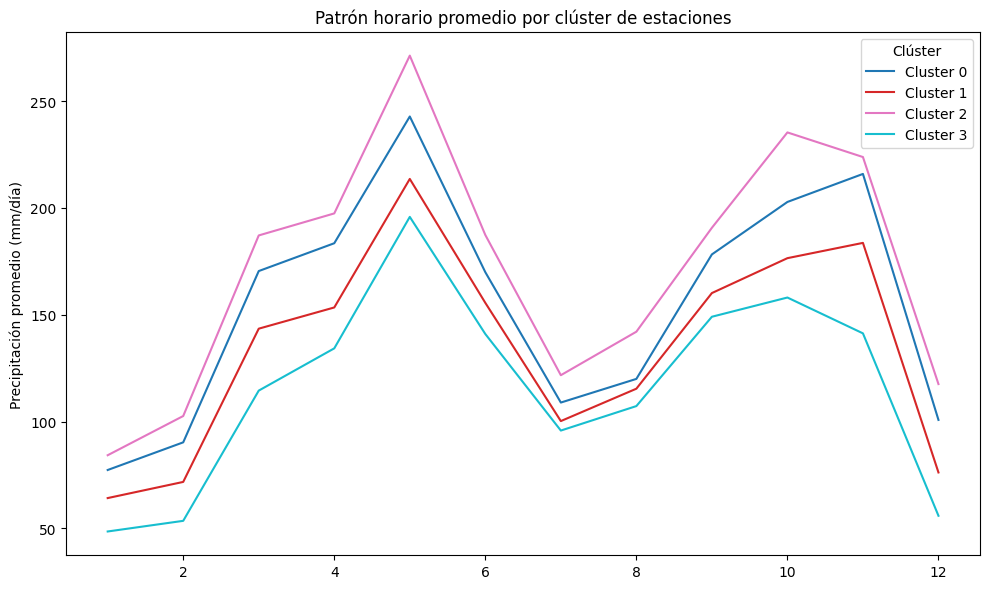

In [36]:

# # matriz 24h x estaciones
df_horas = montly_means

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
plt.ylabel("Precipitación promedio (mm/día)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

/tmp/ipykernel_44487/1363418585.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros


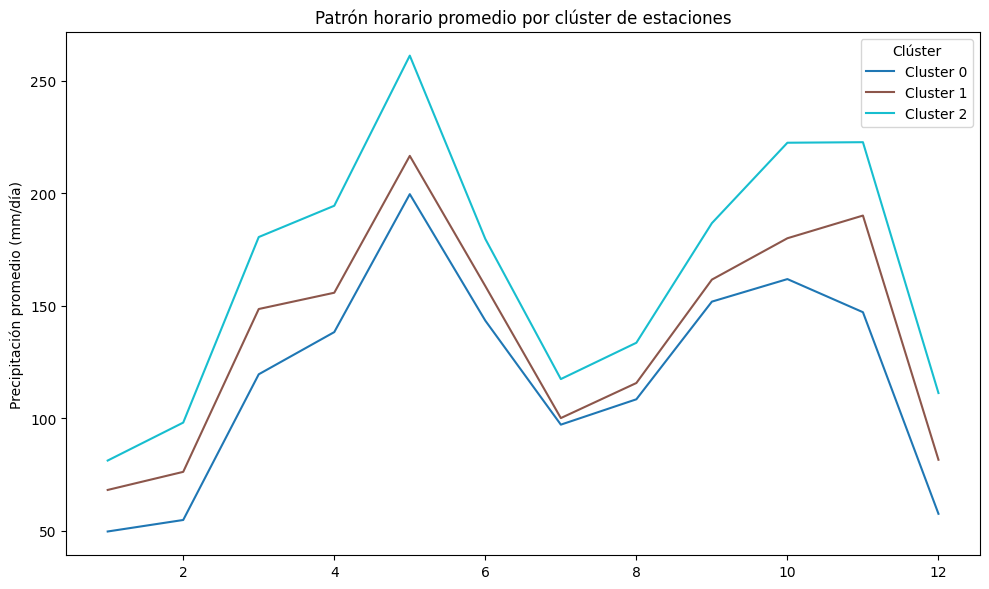

In [40]:

# # matriz 24h x estaciones
df_horas = montly_means

# # Transponer: filas = estaciones, columnas = horas
# X = df_horas.T

# # Escalar
# scaler = StandardScaler()
# X_std = scaler.fit_transform(X)

# # PCA
# pca = PCA()
# X_pca = pca.fit_transform(X_std)

# # Clustering con k=4
# kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
# clusters = kmeans.fit_predict(X_pca[:, :3])

# Agregar etiquetas de clúster al patrón horario
df_horas_clustered = df_horas.copy()
df_horas_clustered = df_horas_clustered.T  # estaciones como filas
df_horas_clustered['Cluster'] = clusters

# Calcular patrón promedio horario por clúster
mean_patterns_by_cluster = df_horas_clustered.groupby('Cluster').mean().T  # ahora sí, index = horas

# Graficar
plt.figure(figsize=(10, 6))
for cluster in sorted(mean_patterns_by_cluster.columns):
    plt.plot(mean_patterns_by_cluster.index, 
             mean_patterns_by_cluster[cluster], 
             label=f"Cluster {cluster}",
             color=cluster_color_dict[cluster])  # usa el color fijo
    
# Mostrar un tick cada 30 días
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.set_xticklabels(ax.get_xticks().astype(int))  # opcional: asegurar enteros

ax.set_xlabel('Día del año')
plt.ylabel("Precipitación promedio (mm/día)")
plt.title("Patrón horario promedio por clúster de estaciones")
plt.legend(title="Clúster")
plt.tight_layout()
plt.show()

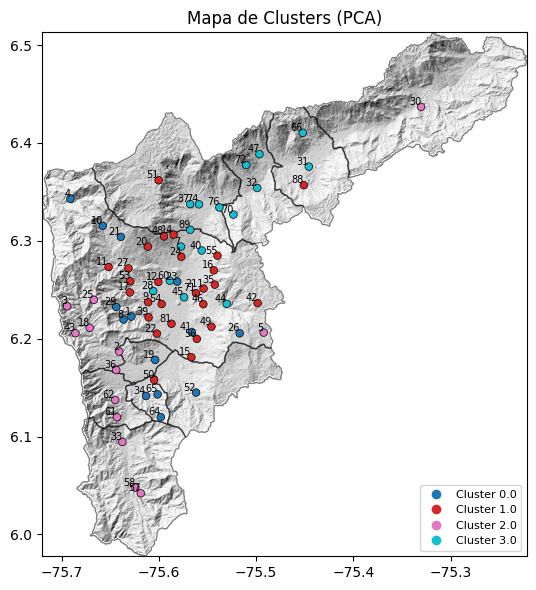

In [37]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()



# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


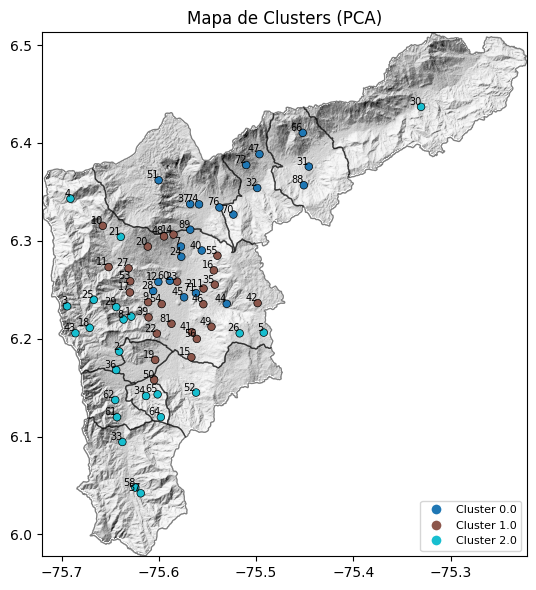

In [41]:
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

def plot_cluster_map_pca(geodf, col_cluster='cluster_pca', col_color='color_pca', title="Mapa de Clusters (PCA)"):
    """
    Grafica el mapa de clusters generados por PCA y KMeans.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    # Graficar cada estación con su color de cluster PCA
    geodf.plot(
        ax=ax, 
        c=geodf[col_color], 
        edgecolor='k', 
        markersize=30, 
        linewidth=0.5
    )

        # Añadir etiquetas de las estaciones
    for idx, row in geodf.iterrows():
        ax.text(
            row.geometry.x,
            row.geometry.y,
            str(row['codigo']),  # ajusta si tu columna de ID tiene otro nombre
            fontsize=7,
            ha='right',
            va='bottom',
            color='black'
        )

        # Leyenda
    legend_elements = []
    for cluster in sorted(geodf[col_cluster].unique()):
        color = geodf.loc[geodf[col_cluster] == cluster, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                                      markerfacecolor=color, markersize=8))

    ax.legend(handles=legend_elements, loc='lower right', fontsize=8)
    plt.title(title, fontsize=12)
    plt.tight_layout()
    plt.show()



# 2. Transponer para que filas = estaciones
X = montly_means.T  # shape: (n_estaciones, 24 horas)


# DataFrame de clusters (por ejemplo después de KMeans con PCA)
df_clusters_pca = pd.DataFrame({
    'Estacion': X.index.astype(int),  # ID de estación
    'cluster_pca': clusters
})

# Asignar un color por cluster
df_clusters_pca['color_pca'] = df_clusters_pca['cluster_pca'].map(cluster_color_dict)

# Copiar y alinear con GeoDataFrame original
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']  # Asegura que el index coincida

# Asignar los valores al GeoDataFrame
pluvios_shp_c['cluster_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['cluster_pca'])
# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_pca'] = pluvios_shp_c.index.map(df_clusters_pca.set_index('Estacion')['color_pca'])

# Filtrar solo estaciones que tienen asignado un cluster
pluvios_shp_pca = pluvios_shp_c.dropna(subset=['cluster_pca'])
pluvios_shp_pca.loc[:, 'cluster_pca'] = pluvios_shp_pca['cluster_pca'].astype(int)

# Graficar el mapa de clústeres PCA
plot_cluster_map_pca(pluvios_shp_pca)


Patron_Lluvia
Otro                   31
Temporada JJA          20
Temporada FMA y SON    19
Name: count, dtype: int64


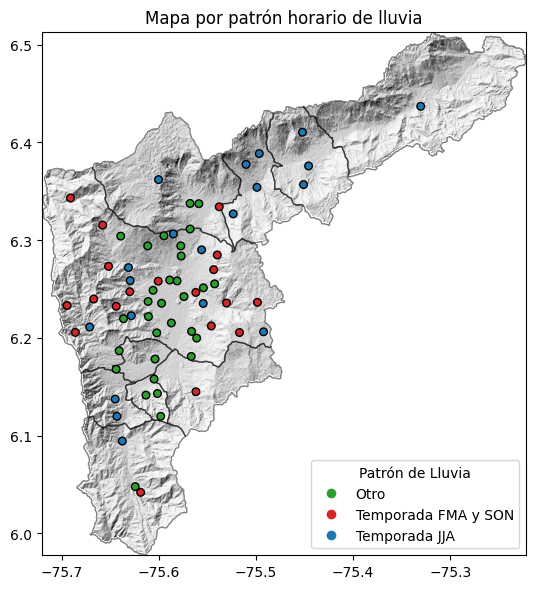

In [44]:
df_pca_scores = pd.DataFrame({
    'Estacion': X.index.astype(int),  # si usaste los códigos como índice
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'PC3': X_pca[:, 2],
})

# Regla: si PC2 > 0.2 → lluvia en la tarde / PC2 < 0 y PC3 > 0.1 → lluvia en madrugada/noche
df_pca_scores['Patron_Lluvia'] = df_pca_scores.apply(
    lambda row: 
        'Temporada JJA' if row['PC2'] > 0.2 
      else ('Temporada FMA y SON' if (row['PC2'] < 0.2 and row['PC3'] > 0) else 'Otro'),
    axis=1
)

# df_pca_scores['Patron_Lluvia'] = df_pca_scores['PC2'].apply(
#     lambda x: 'Tarde' if x > 0.2 else 'Madrugada-Noche'
# )


# Ver cuántas hay por tipo
print(df_pca_scores['Patron_Lluvia'].value_counts())

# Ver algunas estaciones de cada tipo
df_tarde = df_pca_scores[df_pca_scores['Patron_Lluvia'] == 'Temporada JJA']
df_noche = df_pca_scores[df_pca_scores['Patron_Lluvia'] == 'Temporada FMA y SON']

# Exportar
df_pca_scores.to_csv('estaciones_patron_lluvia.csv', index=False)


n_estaciones = len(df_pca_scores)

# Simular clasificación por patrón de lluvia
patterns = ['Temporada JJA' if i % 2 == 0 else 'Temporada FMA y SON' for i in range(n_estaciones)]

pluvios_shp_c['Patron_Lluvia'] = pluvios_shp_c.index.map(df_pca_scores.set_index('Estacion')['Patron_Lluvia'])

color_dict = {
    'Temporada JJA': '#1f77b4',            # Azul
    'Temporada FMA y SON': '#d62728',   # Rojo
    'Otro': '#2ca02c'              # Verde
}

# Actualiza en pluvios_shp_c (esto ya lo haces)
pluvios_shp_c['color_patron'] = pluvios_shp_c['Patron_Lluvia'].map(color_dict)

pluvios_shp_patron = pluvios_shp_c.dropna(subset=['Patron_Lluvia'])

# Función para graficar el mapa
def plot_patron_lluvia_map(geodf, col_patron='Patron_Lluvia', col_color='color_patron', title="Mapa por patrón horario de lluvia"):
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)

    
    # Graficar puntos de estaciones
    geodf.plot(ax=ax, c=geodf[col_color], edgecolor='k', markersize=30)

    # Crear leyenda manual
    legend_elements = []
    for patron in sorted(geodf[col_patron].unique()):
        color = geodf.loc[geodf[col_patron] == patron, col_color].iloc[0]
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=patron,
                                      markerfacecolor=color, markersize=8))
    ax.legend(handles=legend_elements, loc='lower right', title="Patrón de Lluvia")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Mostrar el mapa
plot_patron_lluvia_map(pluvios_shp_patron)



#### **PCA con Matriz de Vecindad Y Clustering Jearquico**

Haciendo mapas con método de conectividad: kneighbors y parámetro 5
Generando mapa con 3 clusters


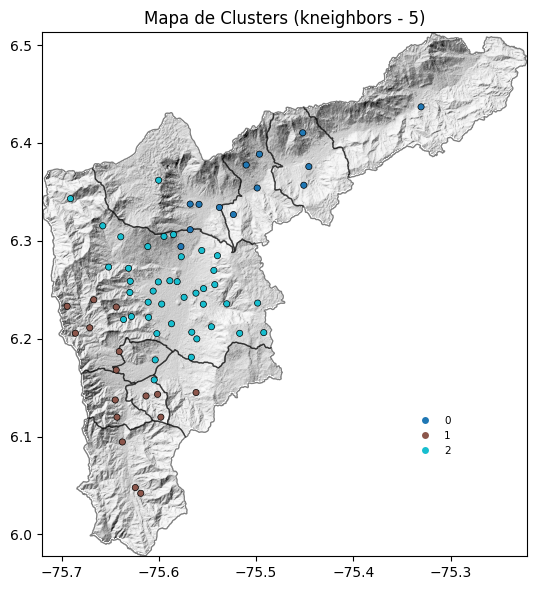

Generando mapa con 4 clusters


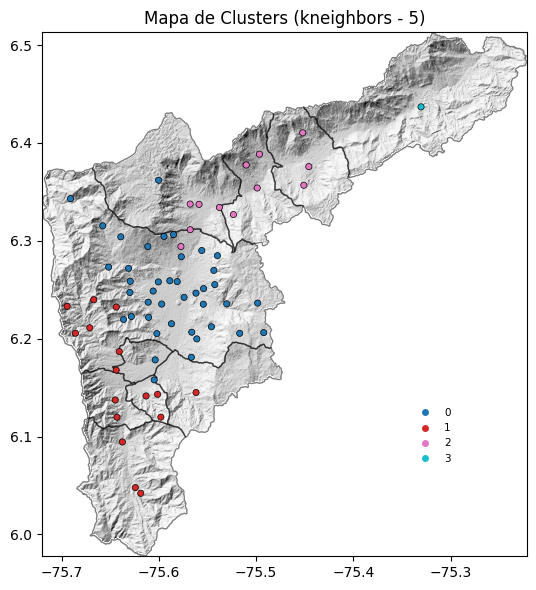

Generando mapa con 5 clusters


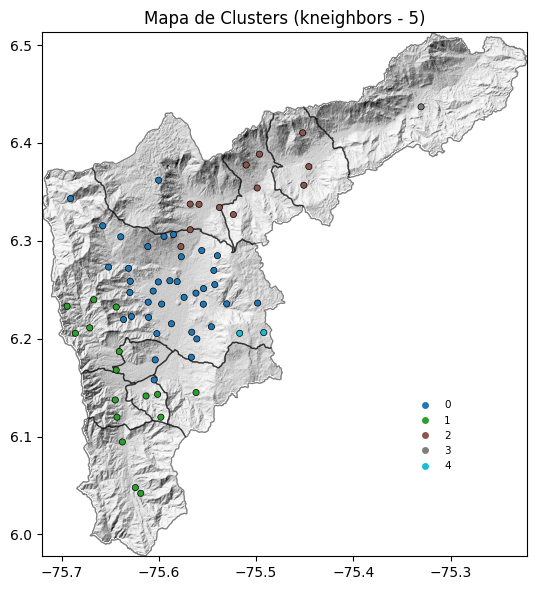

In [43]:
from mpl_toolkits.mplot3d import Axes3D  # Para gráficos 3D
import matplotlib.pyplot as plt


from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

import scipy.sparse as sp
from scipy.spatial import Delaunay
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from rasterio.plot import show
from pyproj import Transformer

# 📌 Función para construir la matriz de conectividad
def build_connectivity_matrix(method, param):
    """
    Construye la matriz de conectividad para el clustering.

    Parámetros:
    - method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Número de vecinos para k-NN o radio en metros.

    Retorna:
    - Matriz de conectividad.
    """
    if method == 'kneighbors':
        return kneighbors_graph(coords_df[['X', 'Y']], n_neighbors=int(param), include_self=False)
    elif method == 'radius':
        return radius_neighbors_graph(coords_df[['X', 'Y']], radius=float(param), include_self=False)
    elif method == 'delaunay':
        tri = Delaunay(coords_df[['X', 'Y']].values)
        n_points = len(coords_df)
        connectivity_matrix = sp.lil_matrix((n_points, n_points))
        for simplex in tri.simplices:
            for i in range(3):
                for j in range(i + 1, 3):
                    connectivity_matrix[simplex[i], simplex[j]] = 1
                    connectivity_matrix[simplex[j], simplex[i]] = 1
        return connectivity_matrix.tocsr()
    else:
        raise ValueError("Método no reconocido. Usa 'kneighbors', 'radius' o 'delaunay'.")


# 📌 Función para graficar el mapa de clusters
def plot_cluster_map(data, n_clusters, connectivity_method='kneighbors', param=5):
    """
    Genera y grafica un mapa con la clasificación de estaciones en clusters.

    Parámetros:
    - n_clusters (int): Número de clusters a calcular.
    - connectivity_method (str): Tipo de conectividad ('kneighbors', 'radius', 'delaunay').
    - param (int/float): Parámetro de conectividad (número de vecinos o radio en metros).
    """
    # 📌 Construir matriz de conectividad
    connectivity = build_connectivity_matrix(connectivity_method, param)

    # 📌 Aplicar Agglomerative Clustering
    hc = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage='ward')
    labels_hc = hc.fit_predict(data)

    # 📌 Asignar clusters al GeoDataFrame
    pluvios_shp_c['cluster'] = labels_hc

    # 📌 Asignar colores a los clusters
    colores_base = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colores = colores_base * (n_clusters // len(colores_base)) + colores_base[:n_clusters % len(colores_base)]
    for i in np.unique(labels_hc):
        pluvios_shp_c.loc[pluvios_shp_c['cluster'] == i, 'color'] = colores[i]

    # 📌 Generar el mapa
    fig, ax = plt.subplots(figsize=(6, 6))
    show(hill, transform=hill_src.transform, ax=ax, cmap='Greys_r')
    AMVA.plot(ax=ax, facecolor='none', edgecolor='black', alpha=0.5)
    pluvios_shp_c.plot(ax=ax, c=pluvios_shp_c['color'], edgecolor='k', markersize=20, linewidth=0.5,
                       column="cluster",
                       categorical=True,
                       legend=True,
                       legend_kwds={"loc": "center left", "bbox_to_anchor": (0.75, 0.23), "fontsize": 7.5,
                                    "markerscale": 0.5, "frameon": False})
    
    plt.title(f"Mapa de Clusters ({connectivity_method} - {param})", fontsize=12)
    plt.tight_layout()
    plt.show()



# Cargar coordenadas
coords_df = pd.read_csv("../../DATA/coords_SIATA.csv", index_col="Codigo")
# 📌 Convertir coordenadas geográficas a UTM
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3116", always_xy=True)
coords_df['X'], coords_df['Y'] = zip(*coords_df.apply(lambda row: transformer.transform(row['Longitude'], row['Latitude']), axis=1))


# 📌 Asegurar que los identificadores de estaciones coincidan con los datos
pluvios_shp_c = pluvios_shp.copy()
pluvios_shp_c.index = pluvios_shp_c['codigo']

# Validar que los índices coincidan entre las coordenadas y las series de tiempo
all_stations_df_10y_imputed.columns = all_stations_df_10y_imputed.columns.astype(int)
coords_df = coords_df.loc[all_stations_df_10y_imputed.columns]

# 📌 Filtrar el GeoDataFrame para que solo contenga las estaciones analizadas
pluvios_shp_c = pluvios_shp_c.loc[all_stations_df_10y_imputed.columns]


# 3. Estandarizar
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 4. PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

X_pca_reducido = X_pca[:, :3]



# 📌 Generar mapas para 4, 5 y 6 clusters con distintas matrices de conectividad
for method, param in [('kneighbors', 5)]:
    print(f'Haciendo mapas con método de conectividad: {method} y parámetro {param}')
    for n in [3, 4, 5]:
        print(f"Generando mapa con {n} clusters")
        plot_cluster_map(X_pca_reducido, n_clusters=n, connectivity_method=method, param=param)




